# **Data Pre-processing & Visualization** 


In [2]:
#imporitng all the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
#reading the data
data = pd.read_csv('Country-data.csv')
data

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [4]:
#data preprocessing
data.isnull().sum()


country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [5]:
#reading the country data
country_data = pd.read_csv('data-dictionary.csv')
country_data

,Column Name,Description
0,country,Name of the country
1,child_mort,Death of children under 5 years of age per 100...
2,exports,Exports of goods and services per capita. Give...
3,health,Total health spending per capita. Given as %ag...
4,imports,Imports of goods and services per capita. Give...
5,Income,Net income per person
6,Inflation,The measurement of the annual growth rate of t...
7,life_expec,The average number of years a new born child w...
8,total_fer,The number of children that would be born to e...
9,gdpp,The GDP per capita. Calculated as the Total GD...


In [6]:
#reading continent data
continent = pd.read_csv('continents2.csv')
continent

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
244,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,Oceania,Polynesia,NaN,9.0,61.0,NaN
245,Western Sahara,EH,ESH,732,ISO 3166-2:EH,Africa,Northern Africa,NaN,2.0,15.0,NaN
246,Yemen,YE,YEM,887,ISO 3166-2:YE,Asia,Western Asia,NaN,142.0,145.0,NaN
247,Zambia,ZM,ZMB,894,ISO 3166-2:ZM,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0


In [7]:
#dropping the unnecessary columns of continent
continent.drop(['alpha-2','alpha-3','country-code','intermediate-region','region-code','sub-region-code','intermediate-region-code','iso_3166-2'],axis=1,inplace=True)
continent

,name,region,sub-region
0,Afghanistan,Asia,Southern Asia
1,Åland Islands,Europe,Northern Europe
2,Albania,Europe,Southern Europe
3,Algeria,Africa,Northern Africa
4,American Samoa,Oceania,Polynesia
...,...,...,...
244,Wallis and Futuna,Oceania,Polynesia
245,Western Sahara,Africa,Northern Africa
246,Yemen,Asia,Western Asia
247,Zambia,Africa,Sub-Saharan Africa


I have imported the country to categorise all the countries on the basis of their continent and sub region in their continent.

In [8]:
#renaming the column "name" as "country"
continent.rename(columns={'name':'country'},inplace=True)

In [9]:
#merging the data and continent 
df = pd.merge(data,continent, how='left', on='country' )
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,region,sub-region
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Asia,Southern Asia
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Europe,Southern Europe
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Africa,Northern Africa
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Africa,Sub-Saharan Africa
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,Americas,Latin America and the Caribbean
...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,Oceania,Melanesia
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,Americas,Latin America and the Caribbean
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,Asia,South-eastern Asia
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,Asia,Western Asia


In [10]:
df.isnull().sum()

country        0
child_mort     0
exports        0
health         0
imports        0
income         0
inflation      0
life_expec     0
total_fer      0
gdpp           0
region        13
sub-region    13
dtype: int64

In [11]:
#filling the missing values of region and sub-region with the the row's region and sub-region whose income is nearest to the missing value
df['region'].fillna(method='ffill',inplace=True)
df['sub-region'].fillna(method='ffill',inplace=True)
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,region,sub-region
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Asia,Southern Asia
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Europe,Southern Europe
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Africa,Northern Africa
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Africa,Sub-Saharan Africa
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,Americas,Latin America and the Caribbean
...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,Oceania,Melanesia
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,Americas,Latin America and the Caribbean
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,Asia,South-eastern Asia
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,Asia,Western Asia


In [12]:
df.nunique()

country       167
child_mort    139
exports       147
health        147
imports       151
income        156
inflation     156
life_expec    127
total_fer     138
gdpp          157
region          5
sub-region     17
dtype: int64

In [13]:
#encoding the dataset
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['country'] = le.fit_transform(df['country'])
df['region'] = le.fit_transform(df['region'])
df['sub-region'] = le.fit_transform(df['sub-region'])
df_pca_kmeans = df.copy()
df_pca_dbscan = df.copy()
df_pca_hierarchal = df.copy()
df_lda_kmeans = df.copy()
df_lda_dbscan = df.copy()
df_lda_hierarchal = df.copy()
df_ica_kmeans = df.copy()
df_ica_dbscan = df.copy()
df_ica_hierarchal = df.copy()
df.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,region,sub-region
0,0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,2,12
1,1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,3,13
2,2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,0,7
3,3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0,14
4,4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1,4


##Visualization of the Processed Dataset

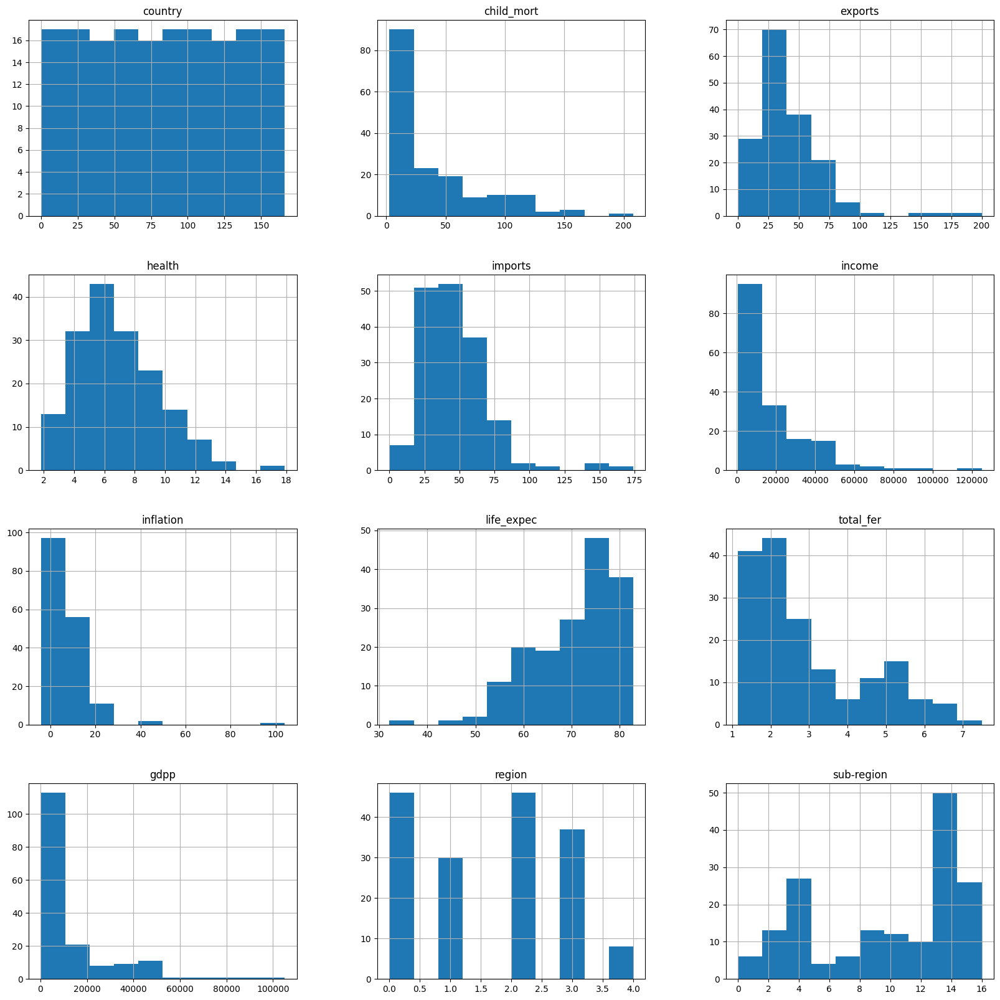

In [14]:
#visualization of the data using histograms
df_pca_kmeans.hist(figsize=(20,20))
plt.show()


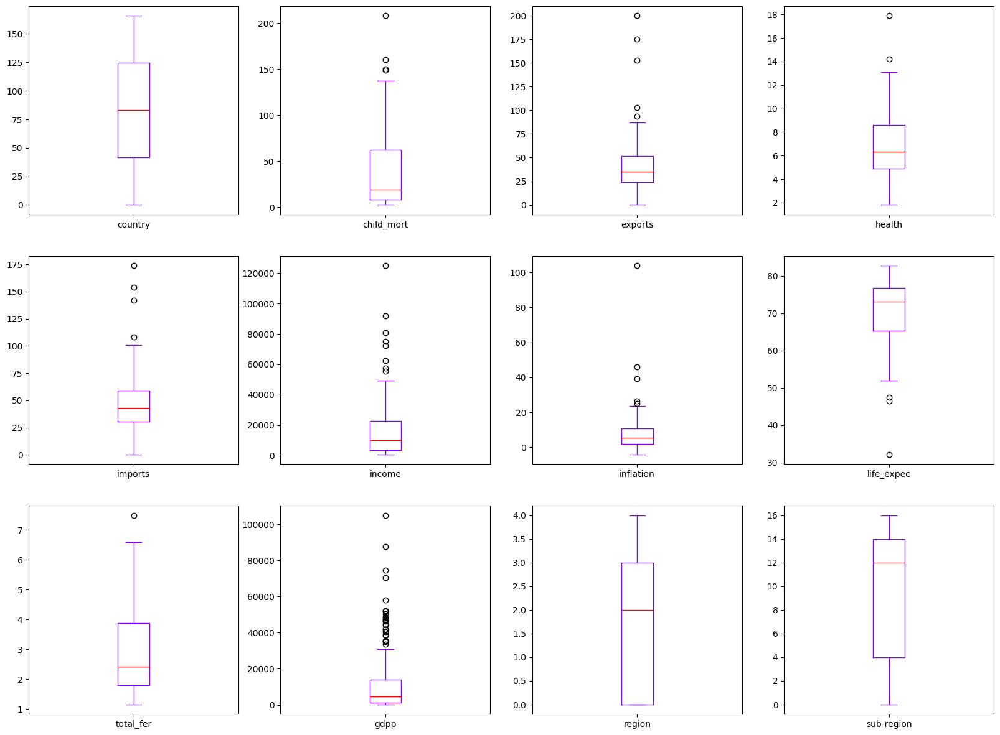

In [15]:
#plotting boxplot give beautiful color to outliers
df_pca_kmeans.plot(kind='box',subplots=True,layout=(4,4),figsize=(20,20),colormap='rainbow')
plt.show()

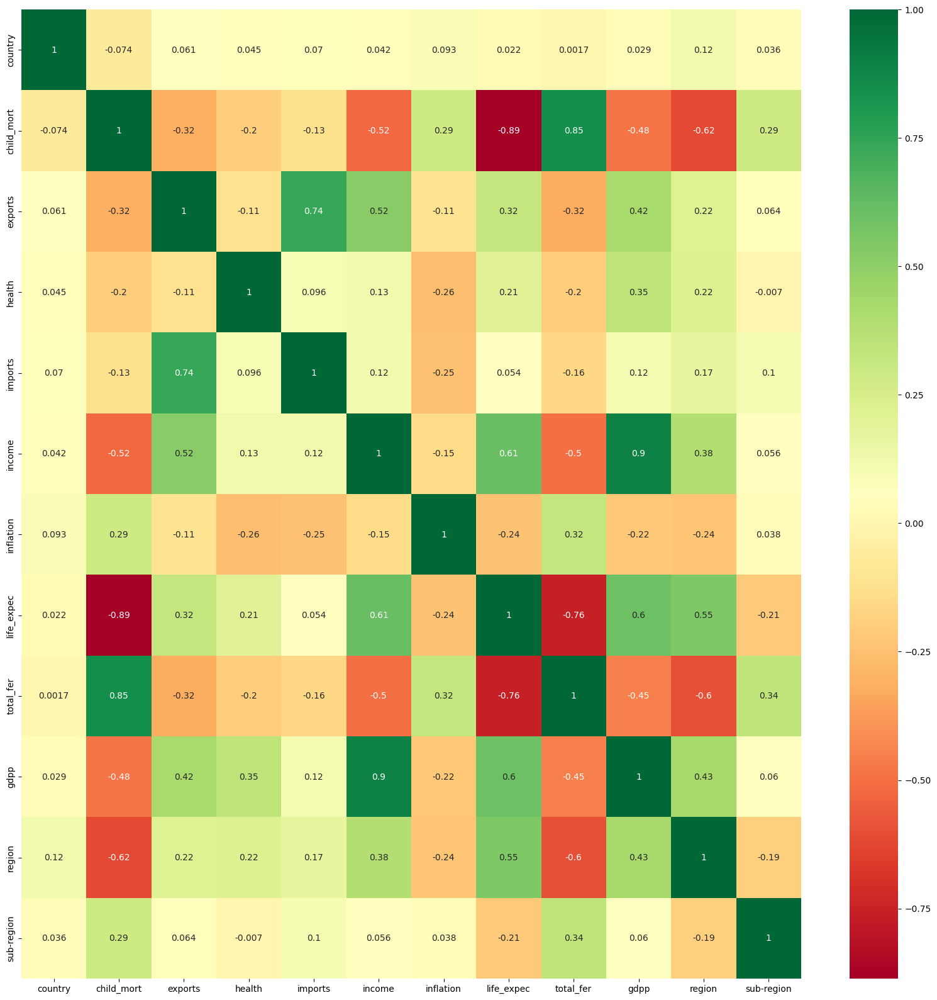

In [16]:
#plotting the correlation matrix heatmap
plt.figure(figsize=(20,20))
sns.heatmap(df_pca_kmeans.corr(),annot=True,cmap='RdYlGn')
plt.show()

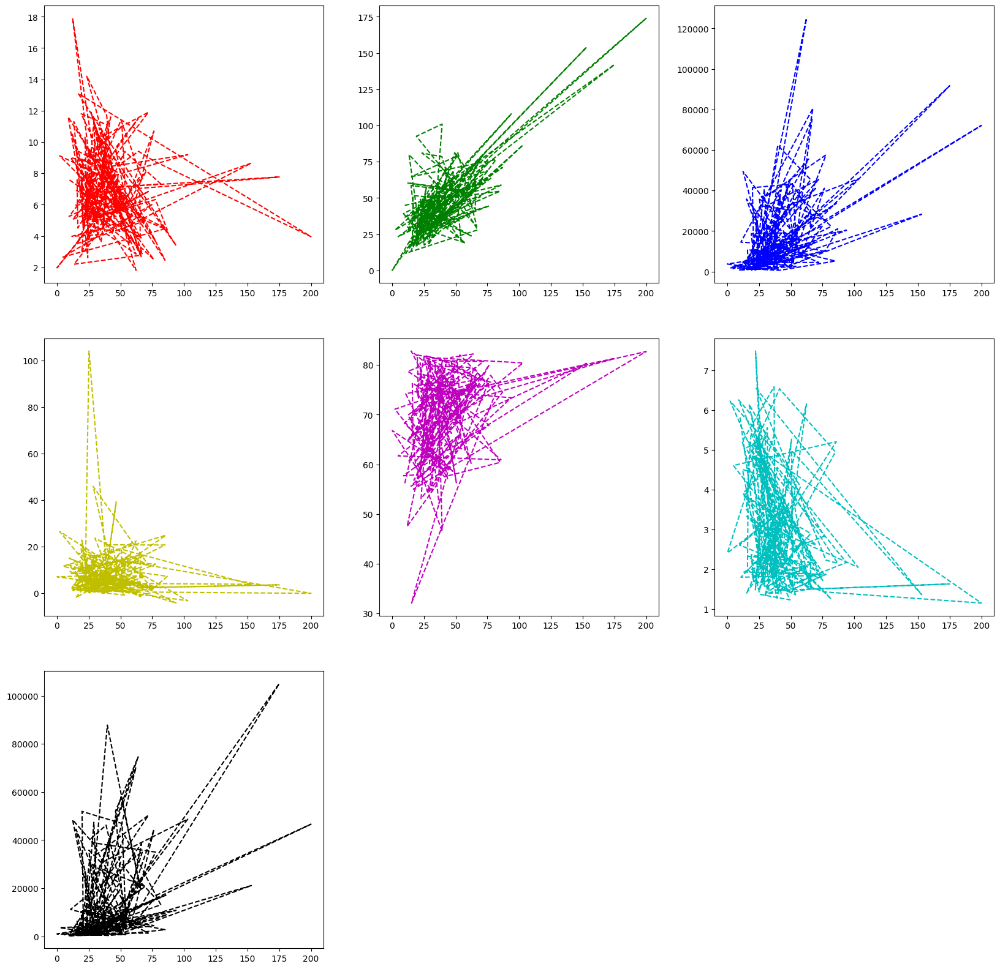

In [17]:
#plot some line plots between the features
plt.figure(figsize=(20,20))
plt.subplot(3,3,1)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['health'],'r--')
plt.subplot(3,3,2)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['imports'],'g--')
plt.subplot(3,3,3)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['income'],'b--')
plt.subplot(3,3,4)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['inflation'],'y--')
plt.subplot(3,3,5)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['life_expec'],'m--')
plt.subplot(3,3,6)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['total_fer'],'c--')
plt.subplot(3,3,7)
plt.plot(df_pca_kmeans['exports'],df_pca_kmeans['gdpp'],'k--')
plt.show()

In [18]:
#standardizing the x data
x = df_pca_kmeans.drop(['country'],axis=1)
y = df_pca_kmeans['country']
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = sc.fit_transform(x)

#**PCA and applying k-Means on the data**

In [19]:
#implementing pca on the dataset
from sklearn.decomposition import PCA
pca = PCA(n_components=7)
x_pca = pca.fit_transform(x)
pca.explained_variance_ratio_


array([0.4172692 , 0.15465436, 0.11268456, 0.1067757 , 0.06444422,
       0.05680392, 0.04440822])

In [20]:
#making the dataframe of the pca components
pca_df = pd.DataFrame(data=x_pca,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7'])
pca_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7
0,-2.686330,0.090080,0.489637,-0.954634,0.391380,0.442775,1.270621
1,0.762236,-0.621412,-0.387810,-0.339497,-0.562713,1.477221,0.018339
2,-0.611760,-0.665996,-0.406230,1.434772,-0.232271,-0.548903,-1.132898
3,-3.328829,1.885013,0.343364,1.413602,0.140841,-0.235483,0.311438
4,0.944663,-0.397190,-1.121248,0.058739,-0.238966,-0.945241,-0.553165


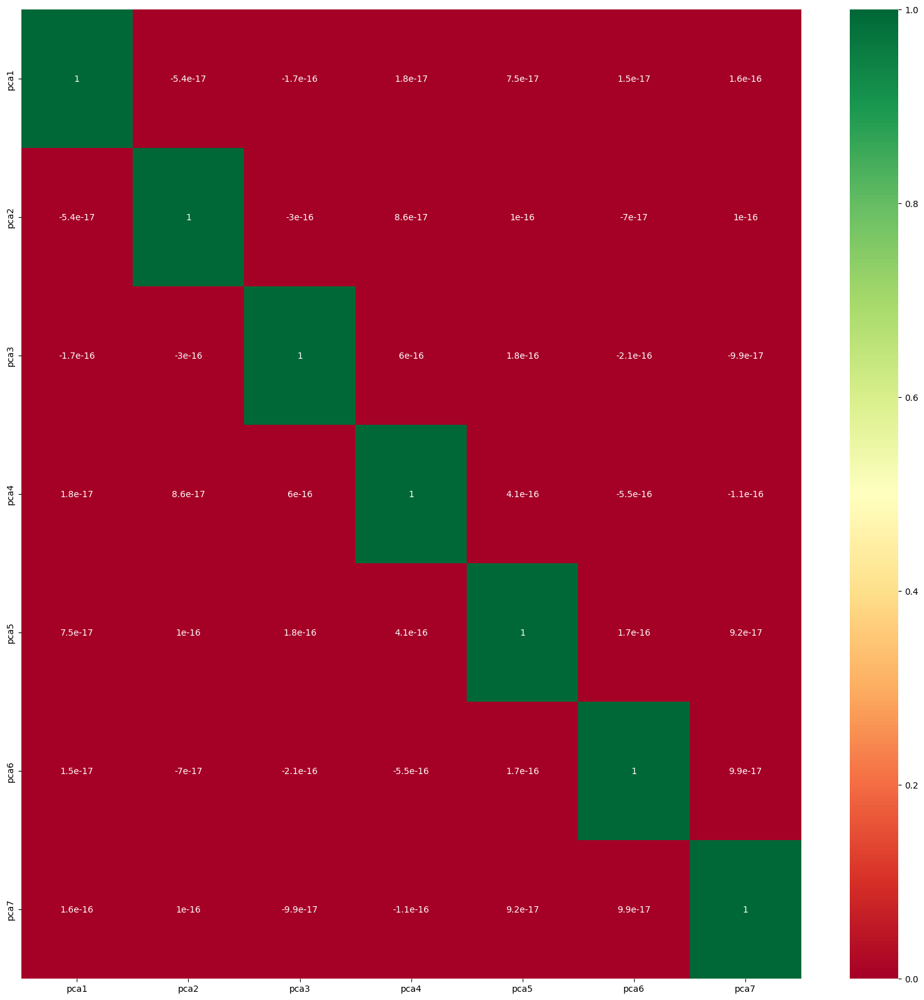

In [21]:
#plotting correlation matrix of pca components
plt.figure(figsize=(20,20))
sns.heatmap(pca_df.corr(),annot=True,cmap='RdYlGn')
plt.show()

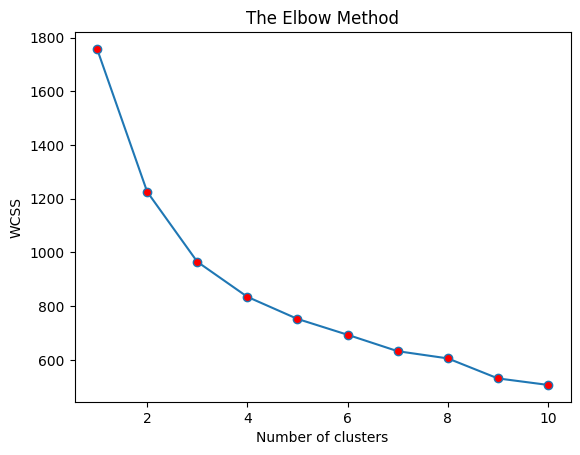

In [22]:
#finding the optimal number of clusters and circles for each cluster
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(x_pca)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss,marker='o',markerfacecolor='red')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


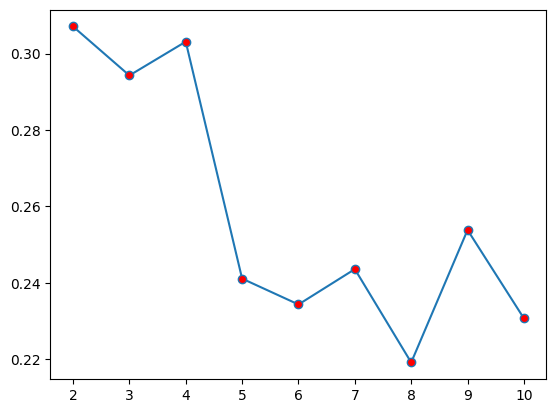

In [23]:
#checking for the optimal no of clusters using silhouette score and plotting
from sklearn.metrics import silhouette_score
sil = []
kmax = 10
for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters = k).fit(x_pca)
    labels = kmeans.labels_
    sil.append(silhouette_score(x_pca, labels, metric = 'euclidean'))
plt.plot([2,3,4,5,6,7,8,9,10],sil,marker='o',markerfacecolor='red')
plt.show()

In [24]:
#implementing kmeans clustering on the pca data
kmeans = KMeans(n_clusters=3)
kmeans.fit(x_pca)
kmeans.labels_


array([0, 1, 1, 0, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 2, 1, 0, 1, 1, 1, 0,
       1, 2, 1, 0, 0, 1, 0, 2, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 2, 1,
       2, 1, 1, 1, 1, 0, 0, 1, 1, 2, 2, 0, 0, 1, 2, 0, 2, 1, 1, 0, 0, 1,
       0, 1, 2, 1, 1, 1, 0, 2, 2, 2, 1, 2, 1, 1, 0, 1, 2, 1, 0, 1, 1, 0,
       0, 1, 1, 2, 1, 0, 0, 1, 1, 0, 2, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       2, 2, 0, 0, 2, 1, 0, 1, 1, 1, 1, 1, 2, 2, 1, 1, 0, 1, 1, 0, 1, 1,
       0, 2, 2, 2, 1, 0, 1, 2, 1, 1, 0, 1, 2, 2, 1, 0, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0])

## Visualization of the dataset & clusters after applying PCA on the data  

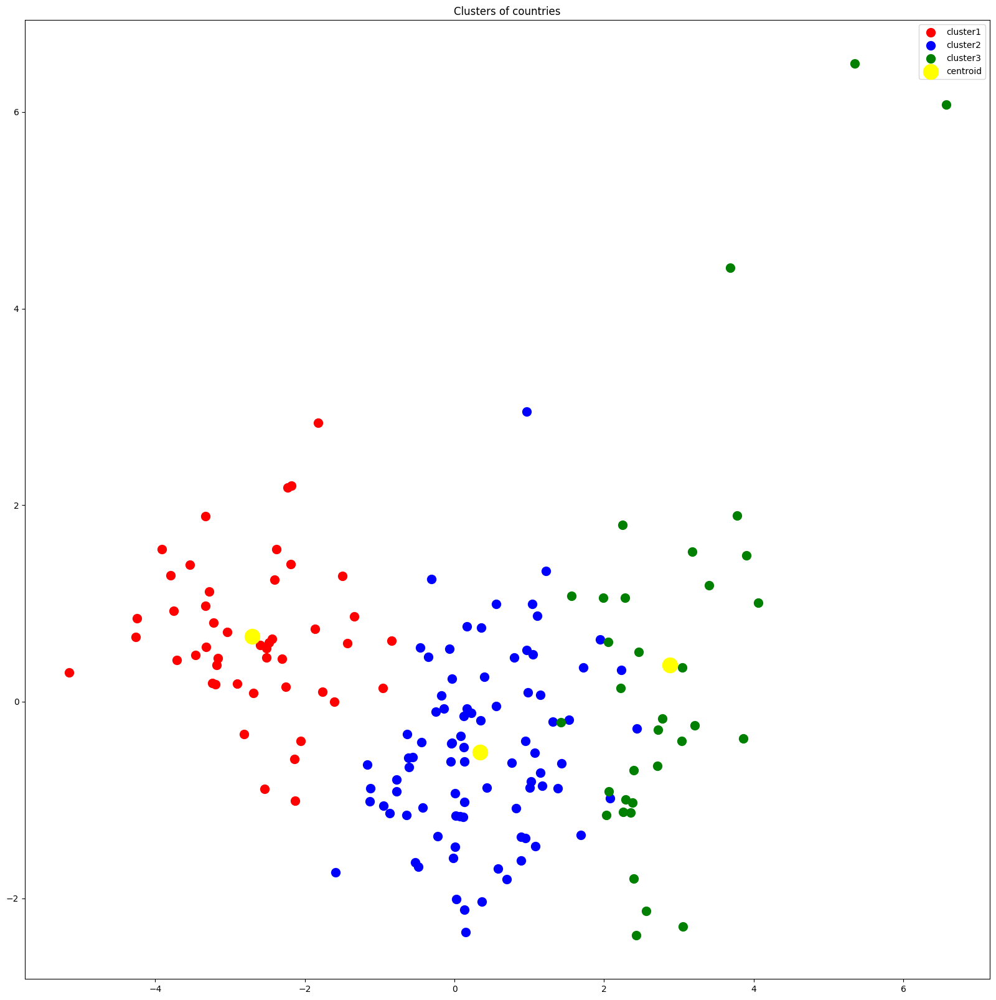

In [25]:
#plotting the clusters
plt.figure(figsize=(20,20))
plt.scatter(x_pca[kmeans.labels_==0,0],x_pca[kmeans.labels_==0,1],s=100,c='red',label='cluster1')
plt.scatter(x_pca[kmeans.labels_==1,0],x_pca[kmeans.labels_==1,1],s=100,c='blue',label='cluster2')
plt.scatter(x_pca[kmeans.labels_==2,0],x_pca[kmeans.labels_==2,1],s=100,c='green',label='cluster3')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],s=300,c='yellow',label='centroid')
plt.title('Clusters of countries')
plt.legend()
plt.show()

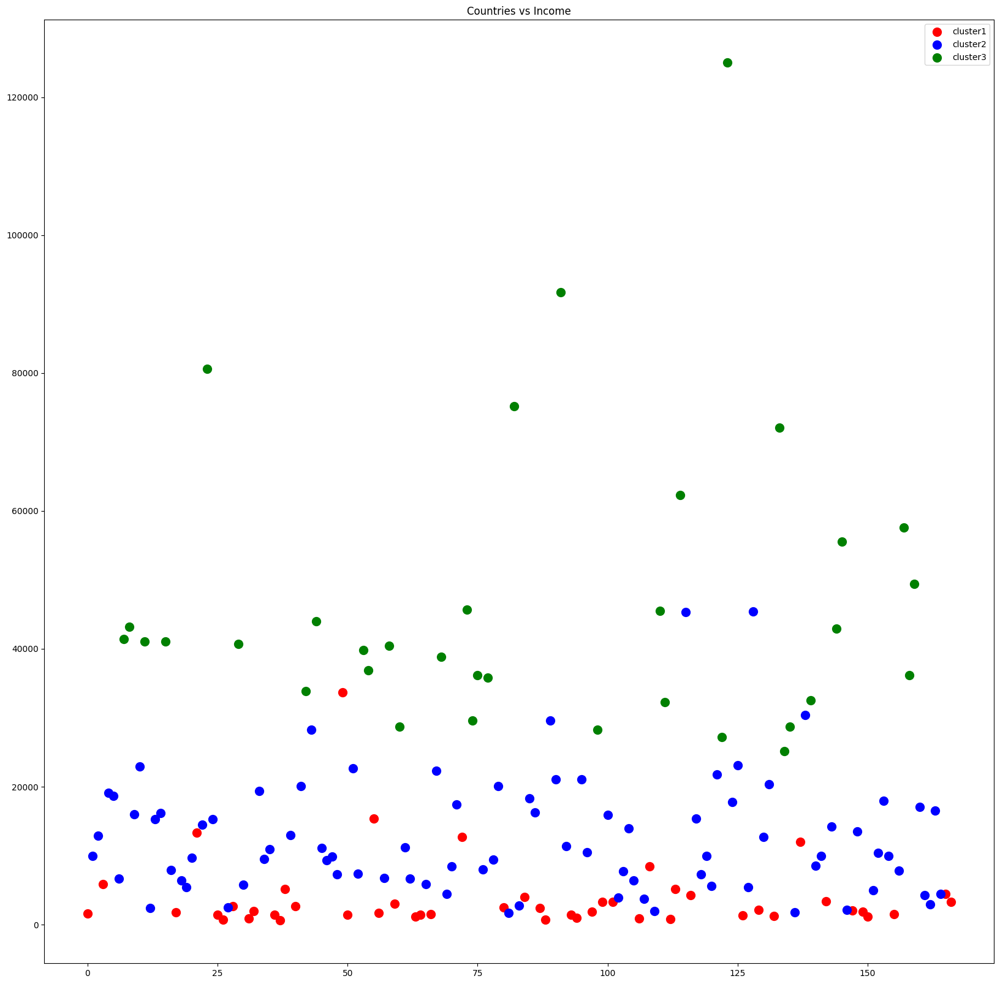

In [26]:
#finding which cluster belongs to which country and plotting it with country names
df_pca_kmeans['cluster'] = kmeans.labels_
df.head()
plt.figure(figsize=(20,20))
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==0]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==1]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==2]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['income'],s=100,c='green',label='cluster3')
plt.title('Countries vs Income')
plt.legend()
plt.show()

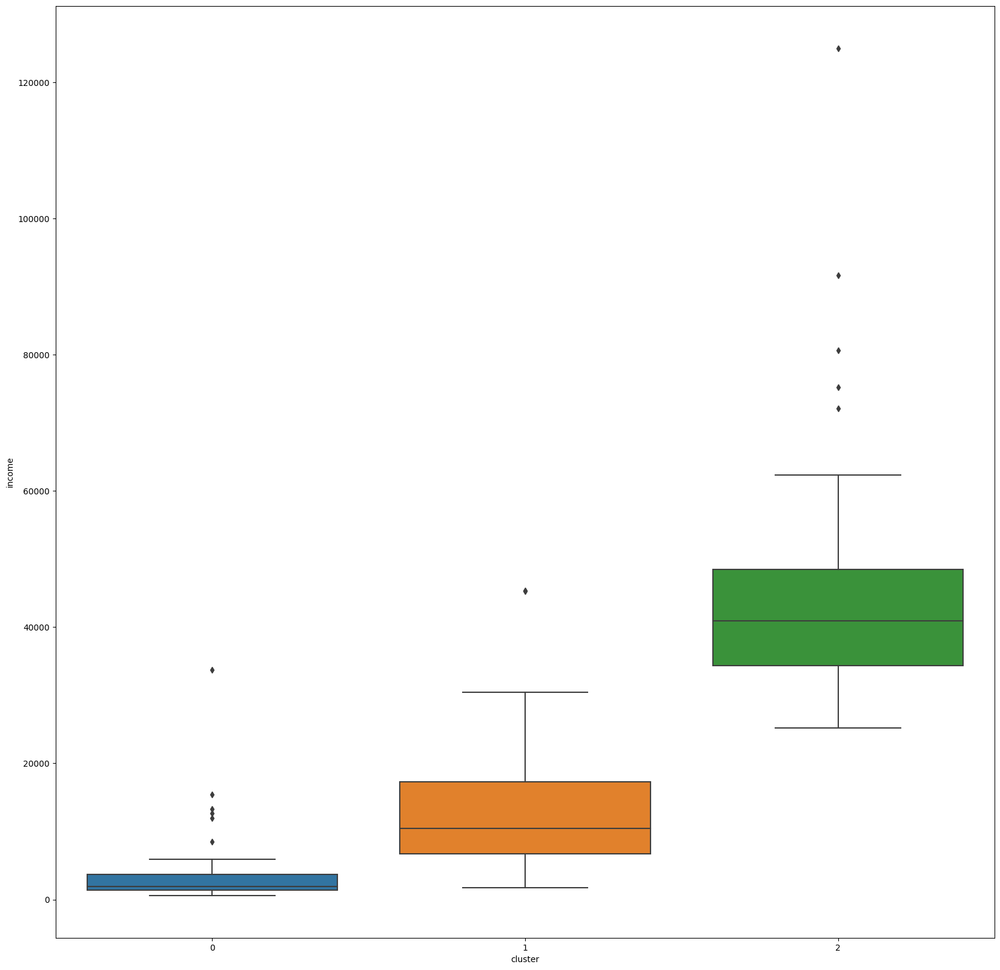

In [27]:
#plotting income vs country for each cluster using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_pca_kmeans)
plt.show()

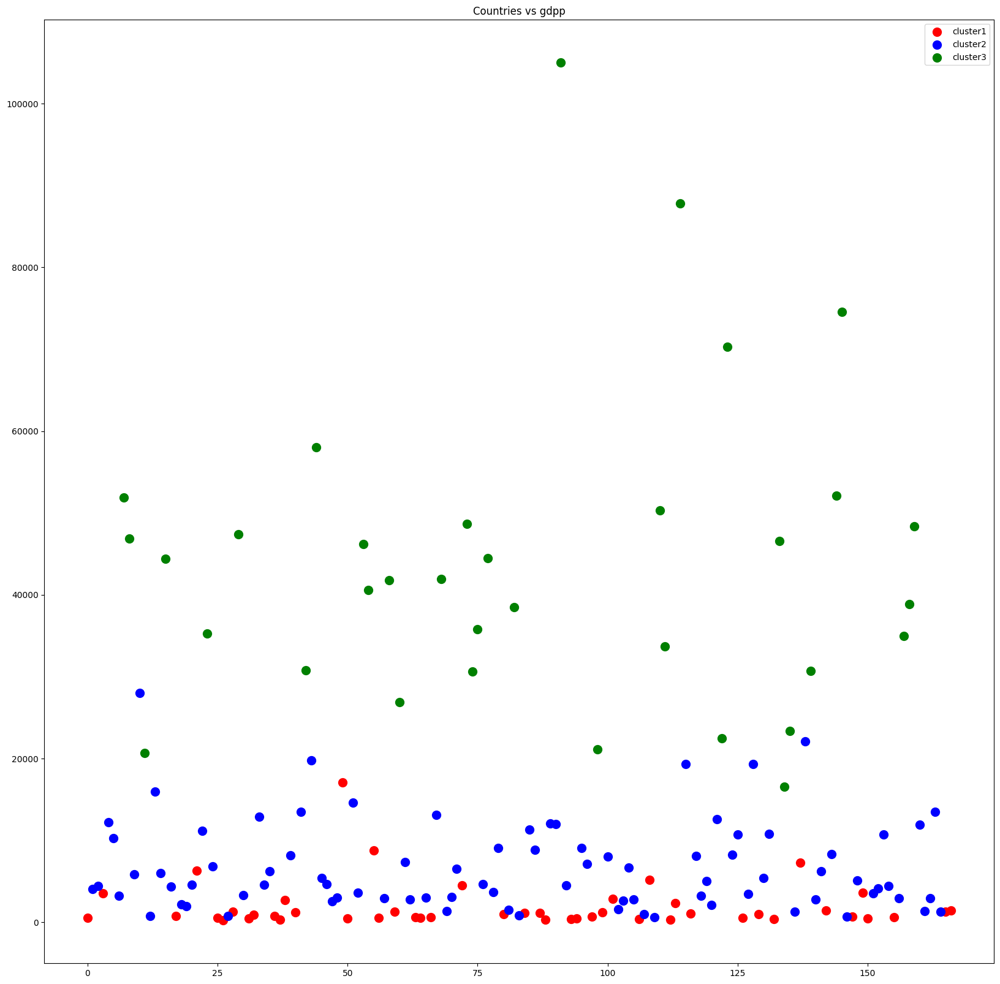

In [28]:
#plotting the clusters with the gdpp and country names
plt.figure(figsize=(20,20))
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==0]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==1]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==2]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['gdpp'],s=100,c='green',label='cluster3')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

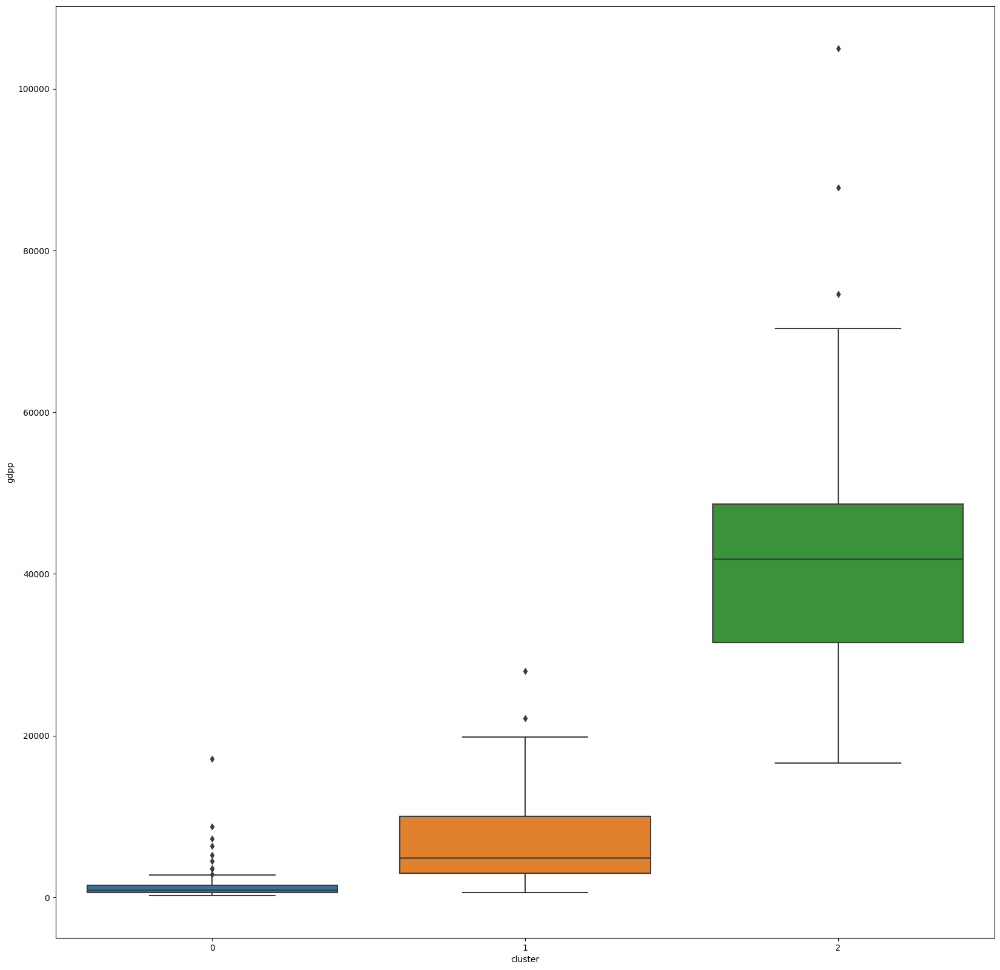

In [29]:
#plotting the clusters with the gdpp and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_pca_kmeans)
plt.show()

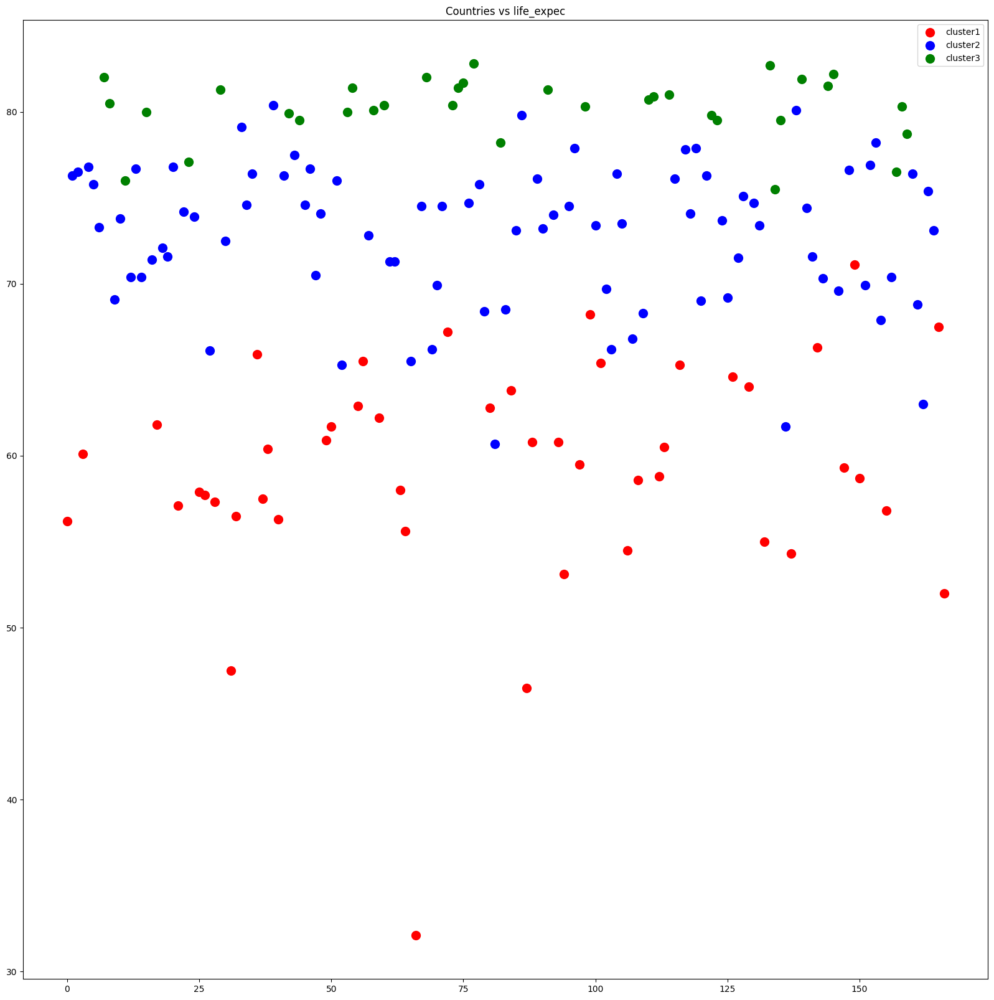

In [30]:
#plotting the clusters with the life expectancy and country names
plt.figure(figsize=(20,20))
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==0]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==1]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==2]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()

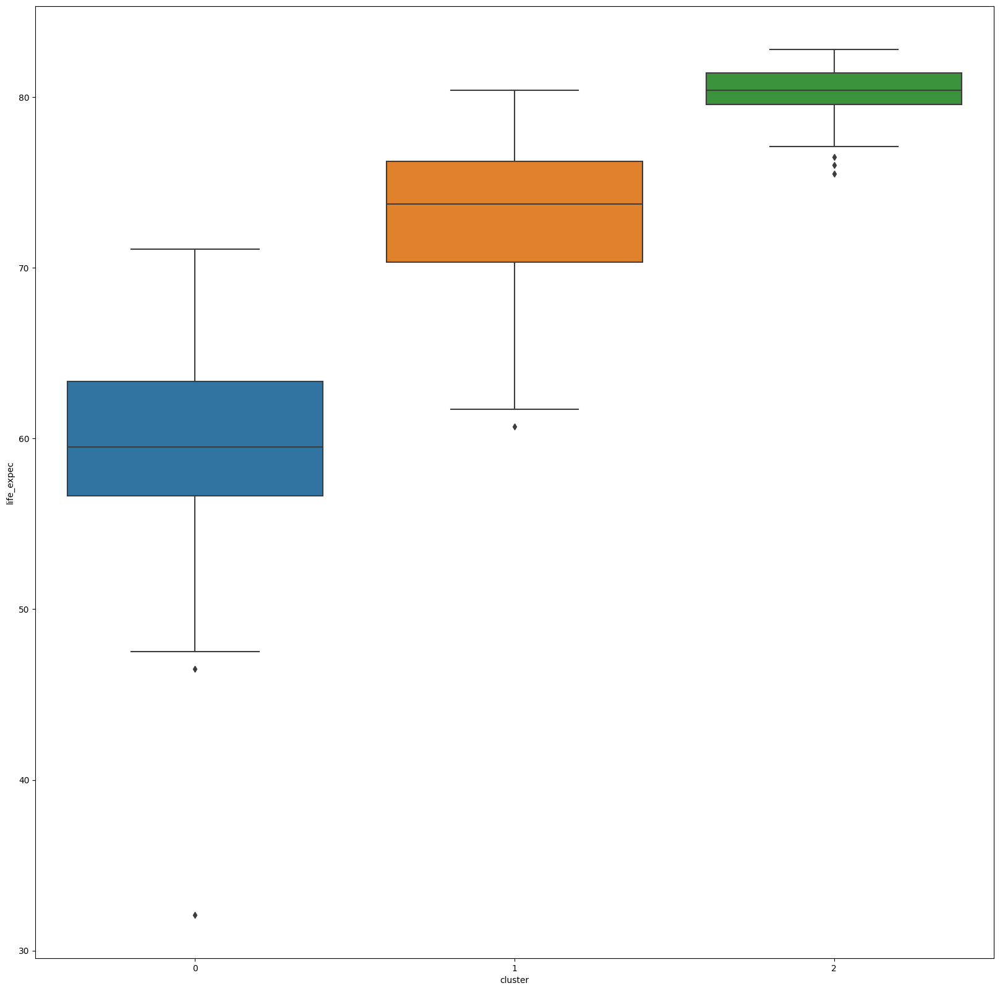

In [31]:
#plotting the clusters with the life expectancy and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_pca_kmeans)
plt.show()

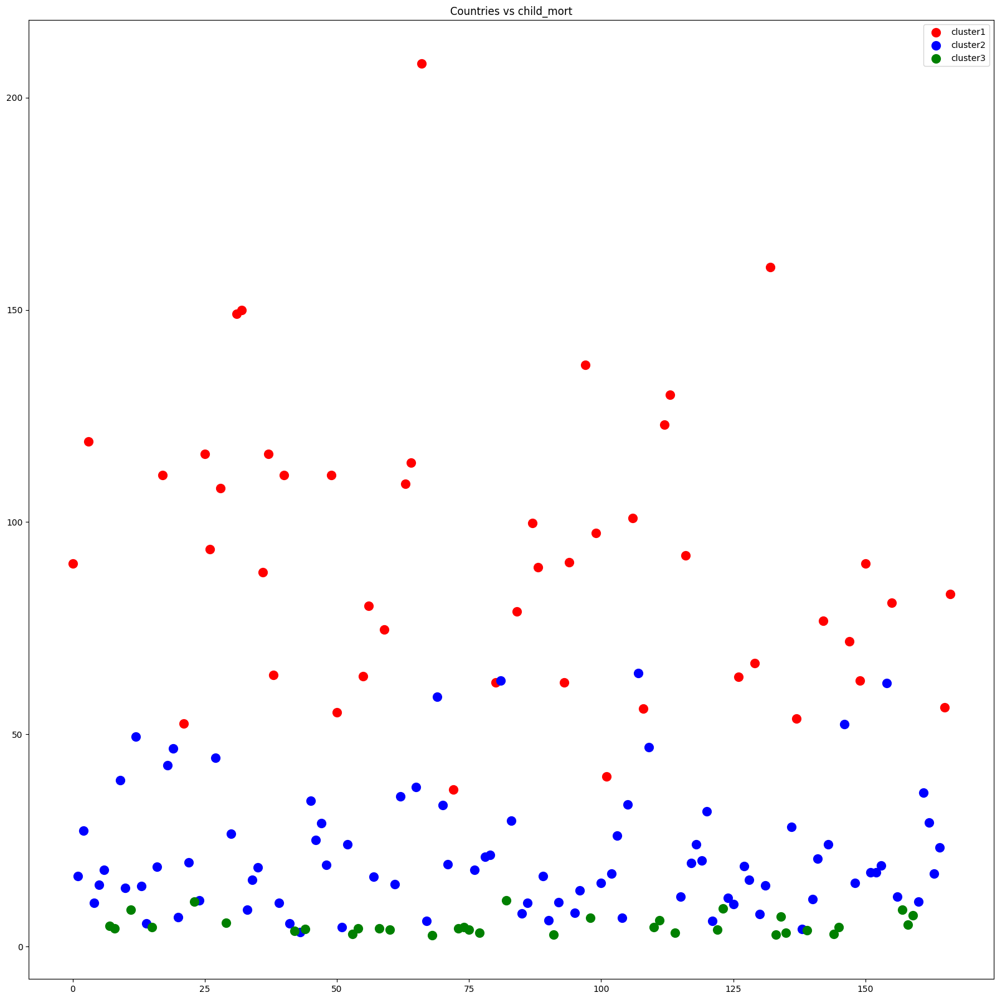

In [32]:
#plotting the clusters with the child mortality and country names
plt.figure(figsize=(20,20))
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==0]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==1]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==2]['country'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
plt.title('Countries vs child_mort')
plt.legend()
plt.show()

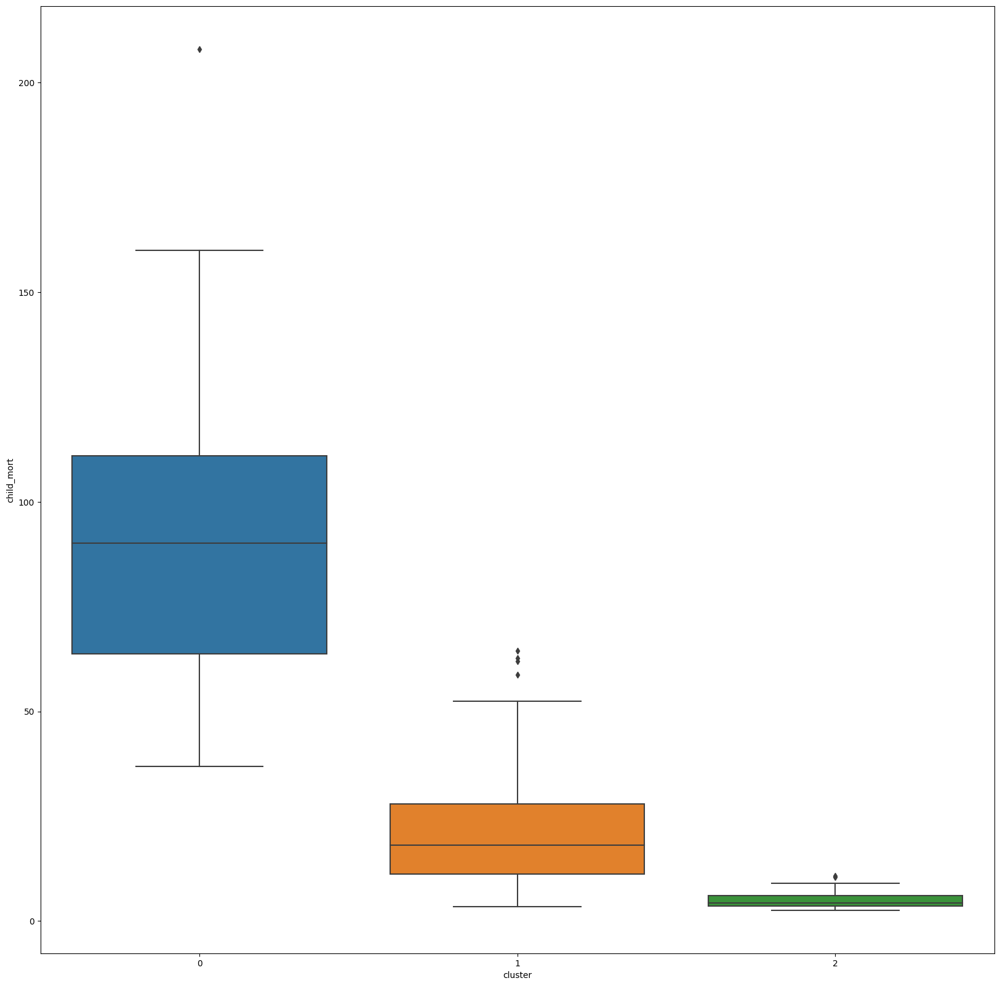

In [33]:
#plotting the clusters with the child mortality and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='child_mort',data=df_pca_kmeans)
plt.show()

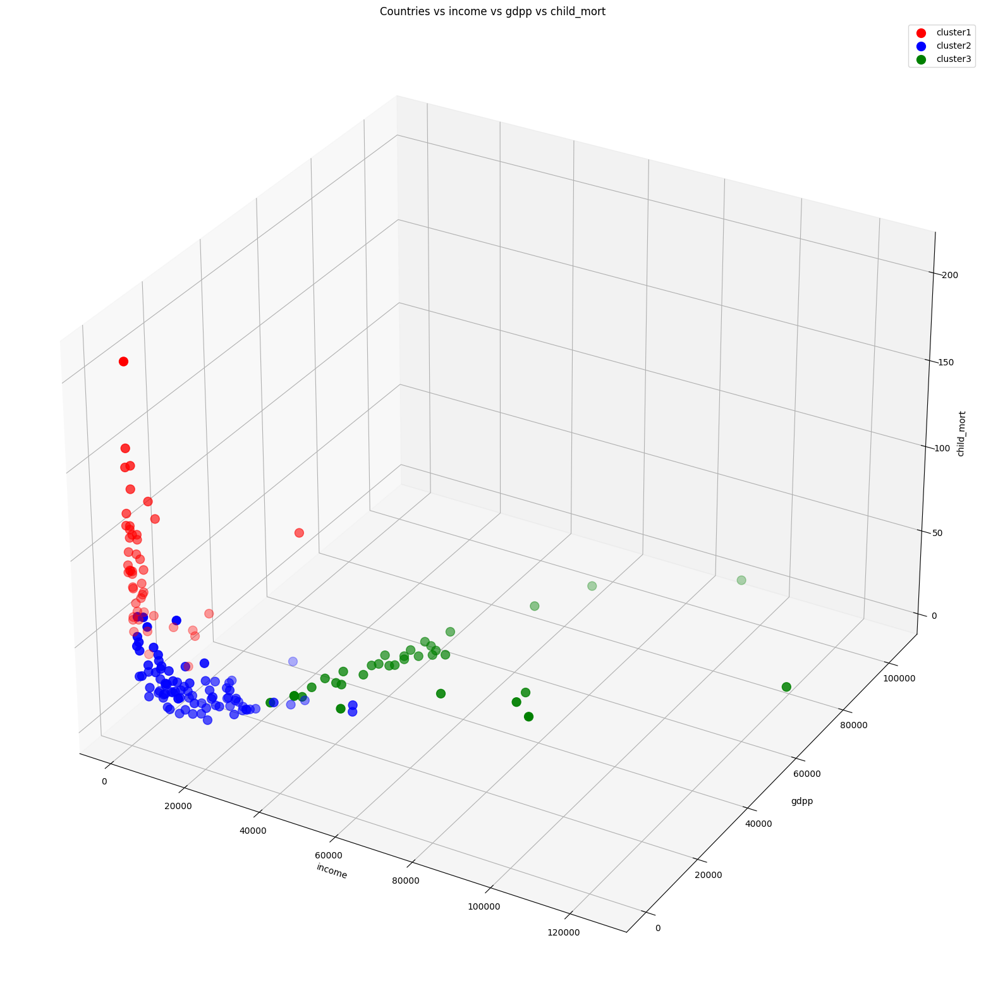

In [34]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==0]['income'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['gdpp'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==1]['income'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['gdpp'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==2]['income'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['gdpp'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

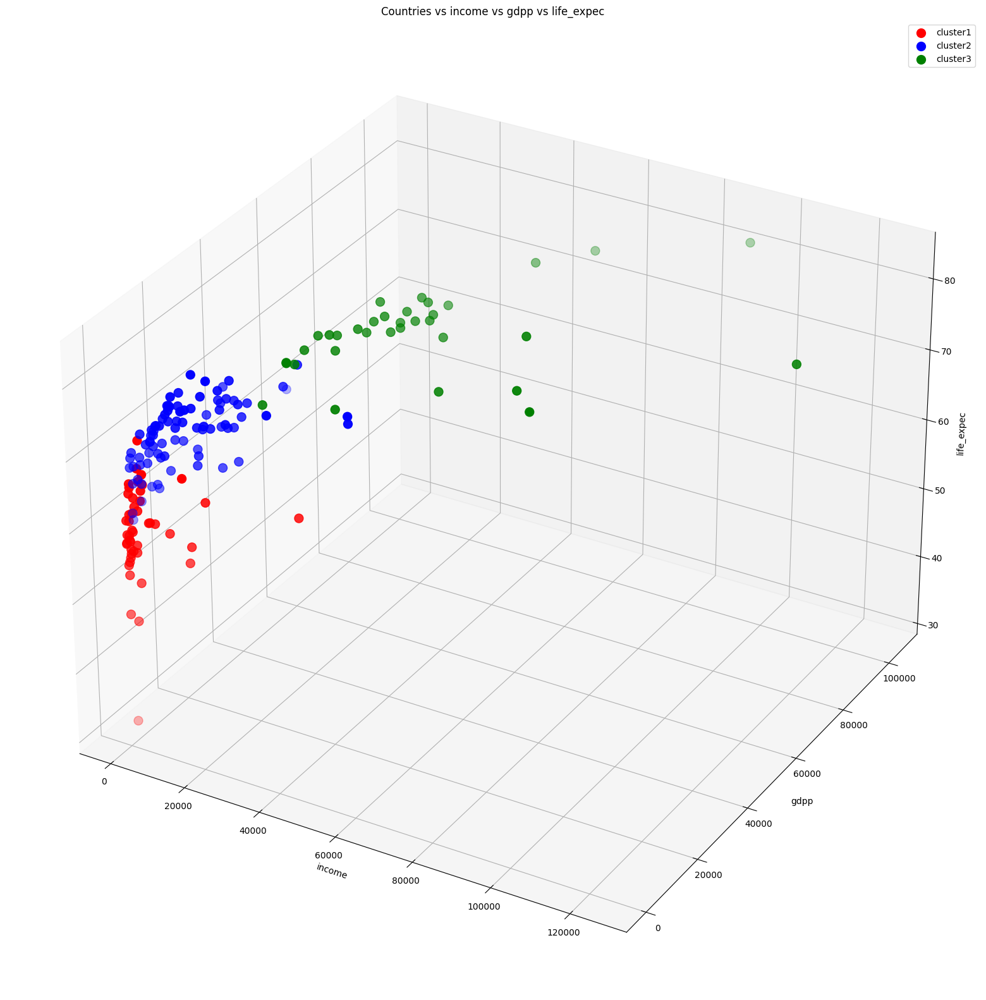

In [35]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==0]['income'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['gdpp'],df_pca_kmeans[df_pca_kmeans['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==1]['income'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['gdpp'],df_pca_kmeans[df_pca_kmeans['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_pca_kmeans[df_pca_kmeans['cluster']==2]['income'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['gdpp'],df_pca_kmeans[df_pca_kmeans['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [36]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_pca_kmeans, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

From above plots we can clearly see that cluster 3 are developed countries and cluster 2 are developing countries. We can also see that cluster 1 are under developed countries.So we can say that countries in cluster 3 needs least help and cluster 1 needs most help.

In [37]:
#preparing the plot_kmeans_data to plot in the world map
plot_kmeans_data = df_pca_kmeans['cluster']
#adding the country names to the plot_kmeans_data
plot_kmeans_data = pd.concat([plot_kmeans_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_kmeans_data['cluster'] = plot_kmeans_data['cluster'].replace({1:'Help Needed',0:'May Need Help',2:'Least Help Needed'})
plot_kmeans_data.head()

,cluster,country
0,May Need Help,Afghanistan
1,Help Needed,Albania
2,Help Needed,Algeria
3,May Need Help,Angola
4,Help Needed,Antigua and Barbuda


In [38]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_kmeans_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()


Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" represents the countries which "needed least help"

Countries in color "Green" represents the countries which "may need help"

#**Applying Hierarchial clustering on the PCA implemented dataset**

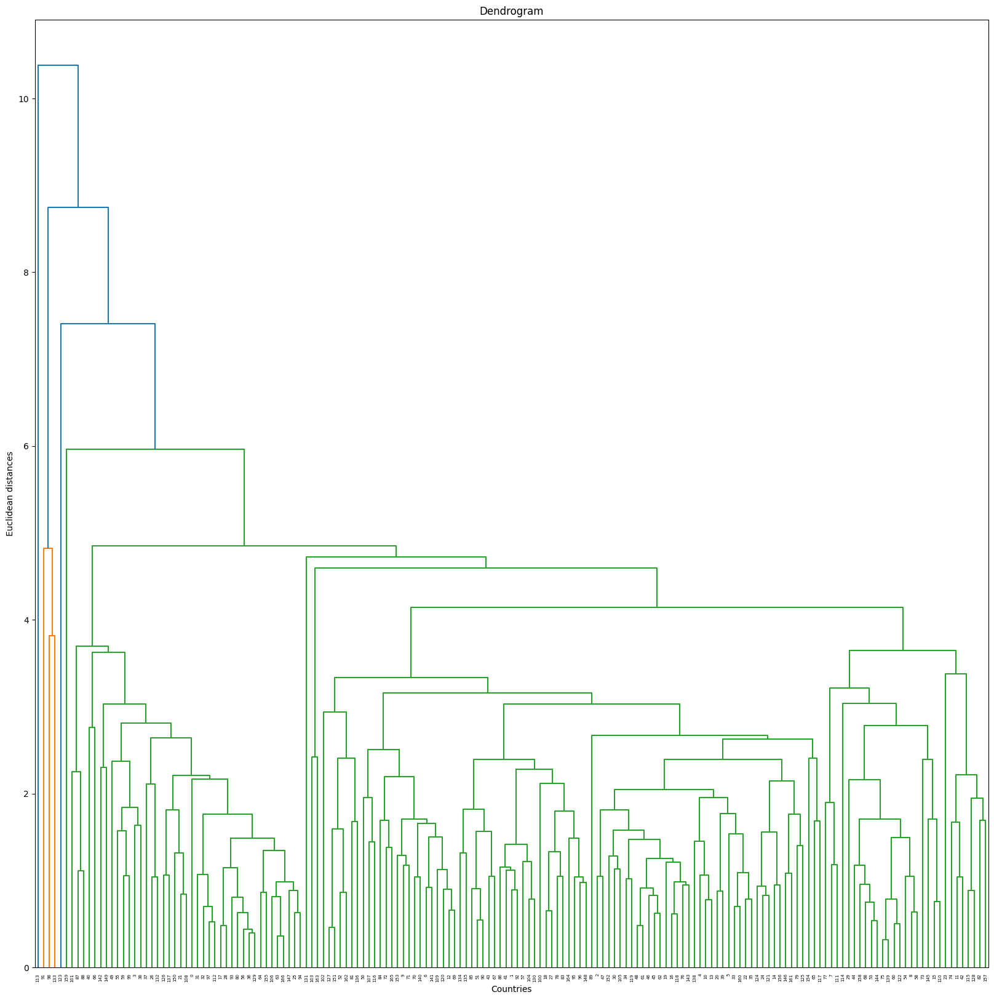

In [39]:
#implementing the hierarchical clustering on the pca data from sklearn
from sklearn.cluster import AgglomerativeClustering
#plotting the dendrogram to find the optimal number of clusters
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(20,20))
dendrogram = sch.dendrogram(sch.linkage(x_pca, method = 'average'))
plt.title('Dendrogram')
plt.xlabel('Countries')
plt.ylabel('Euclidean distances')
plt.show()

In [40]:
#fitting the hierarchical clustering on the pca data
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'l1', linkage = 'complete')
y_hc = hc.fit_predict(x_pca)
y_hc

array([2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2,
       2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2,
       0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 2, 0, 2, 2, 2, 2, 2,
       2, 2, 0, 2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2,
       2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       0, 0, 2, 1, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 0, 2, 2, 2,
       2, 0, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2], dtype=int64)

In [41]:
#replacing 1 with 2 
y_hc = np.where(y_hc==2,1,y_hc)
y_hc

array([1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

##Visualization of the dataset after Hierarchial clustering




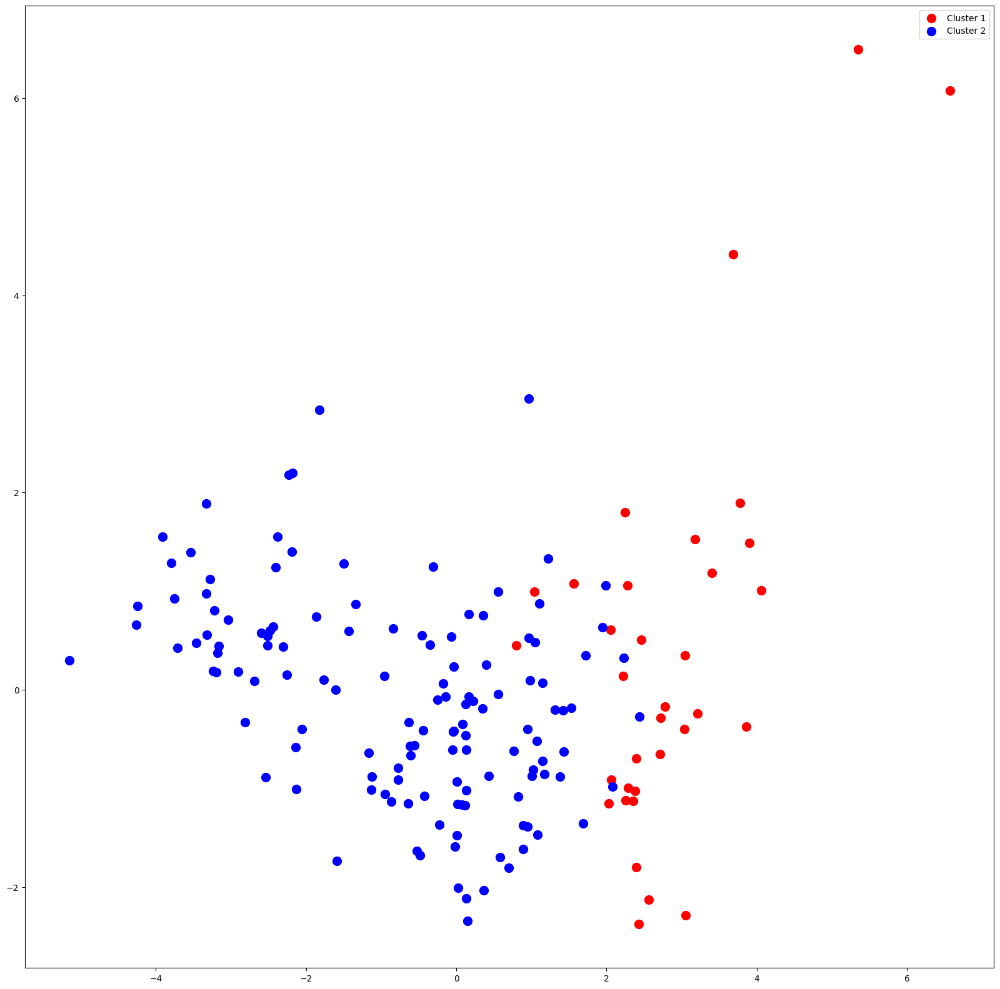

In [42]:
#plotting the clusters
plt.figure(figsize=(20,20))
plt.scatter(x_pca[y_hc == 0, 0], x_pca[y_hc == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(x_pca[y_hc == 1, 0], x_pca[y_hc == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.legend()
plt.show()



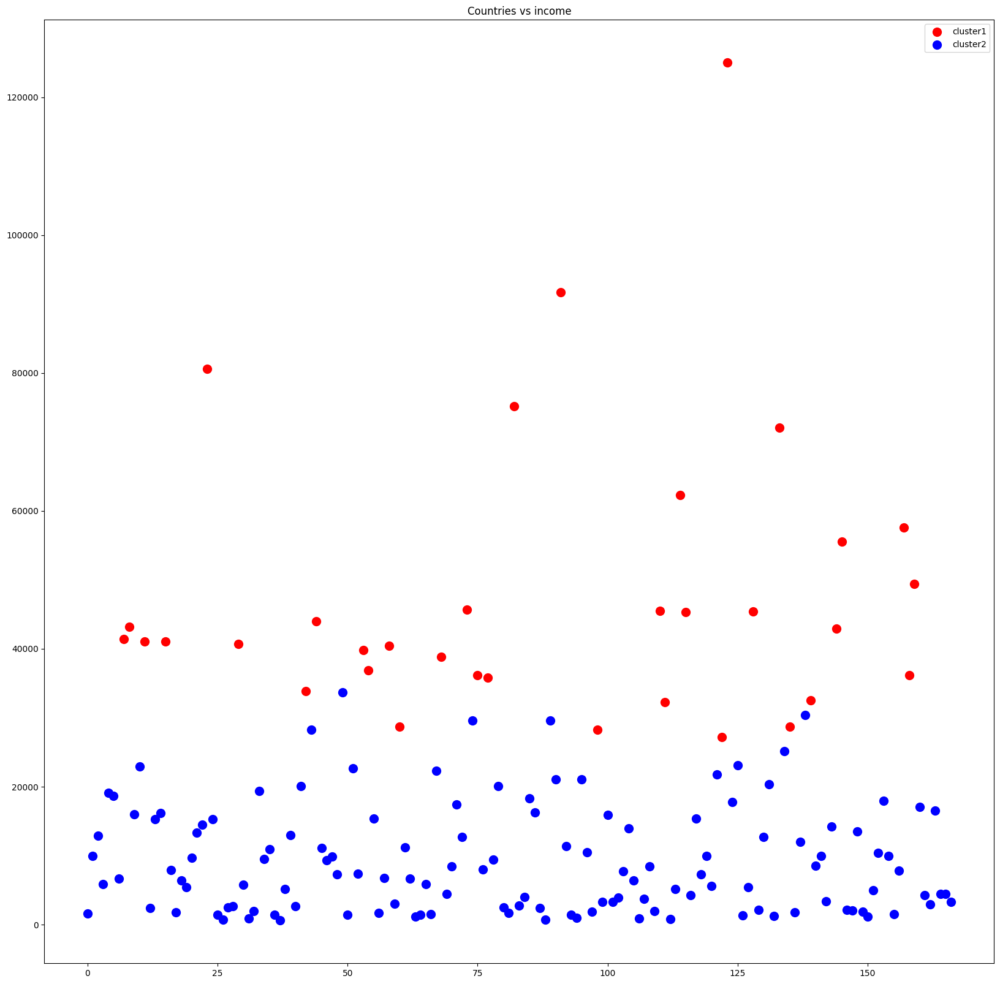

In [43]:
#plotting the clusters with the income and country names
df_pca_hierarchal['cluster'] = y_hc
plt.figure(figsize=(20,20))
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['income'],s=100,c='blue',label='cluster2')
plt.title('Countries vs income')
plt.legend()
plt.show()

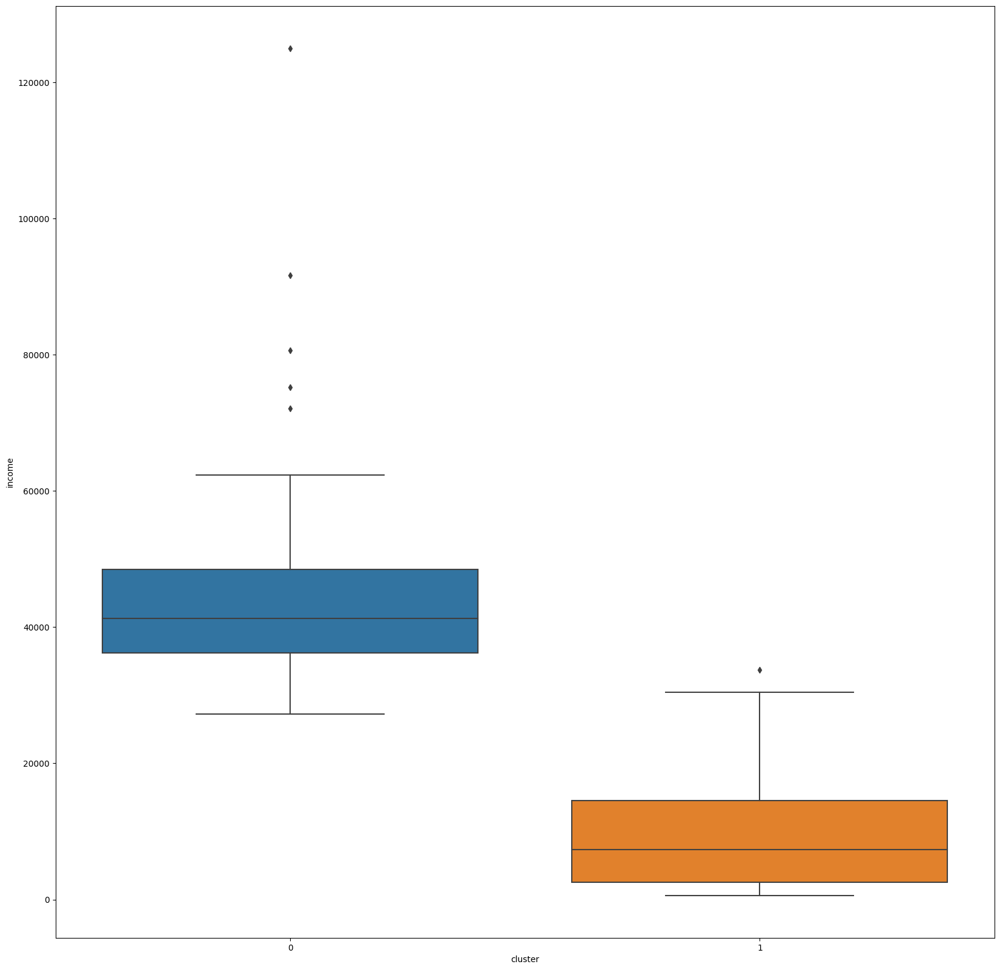

In [44]:
#plotting the clusters with the income and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_pca_hierarchal)
plt.show()

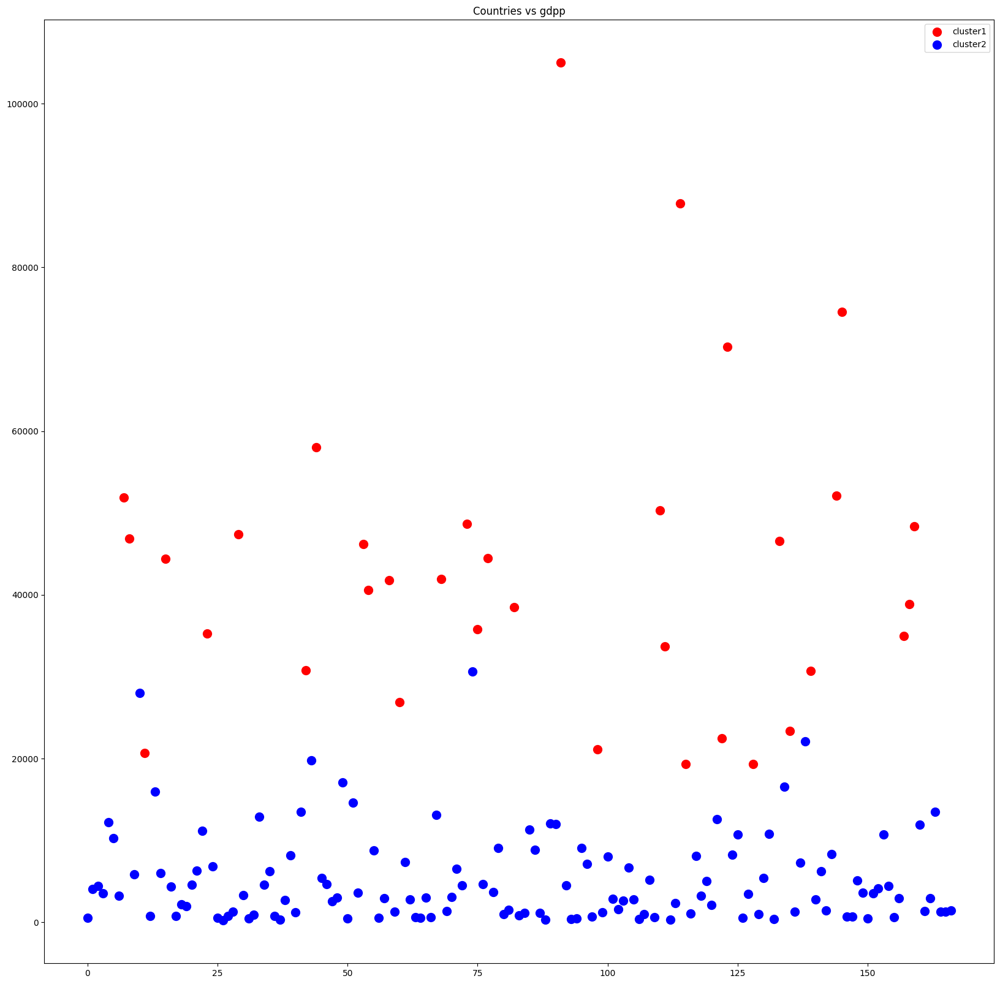

In [45]:
#plotting the clusters with the gdpp and country names
plt.figure(figsize=(20,20))
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

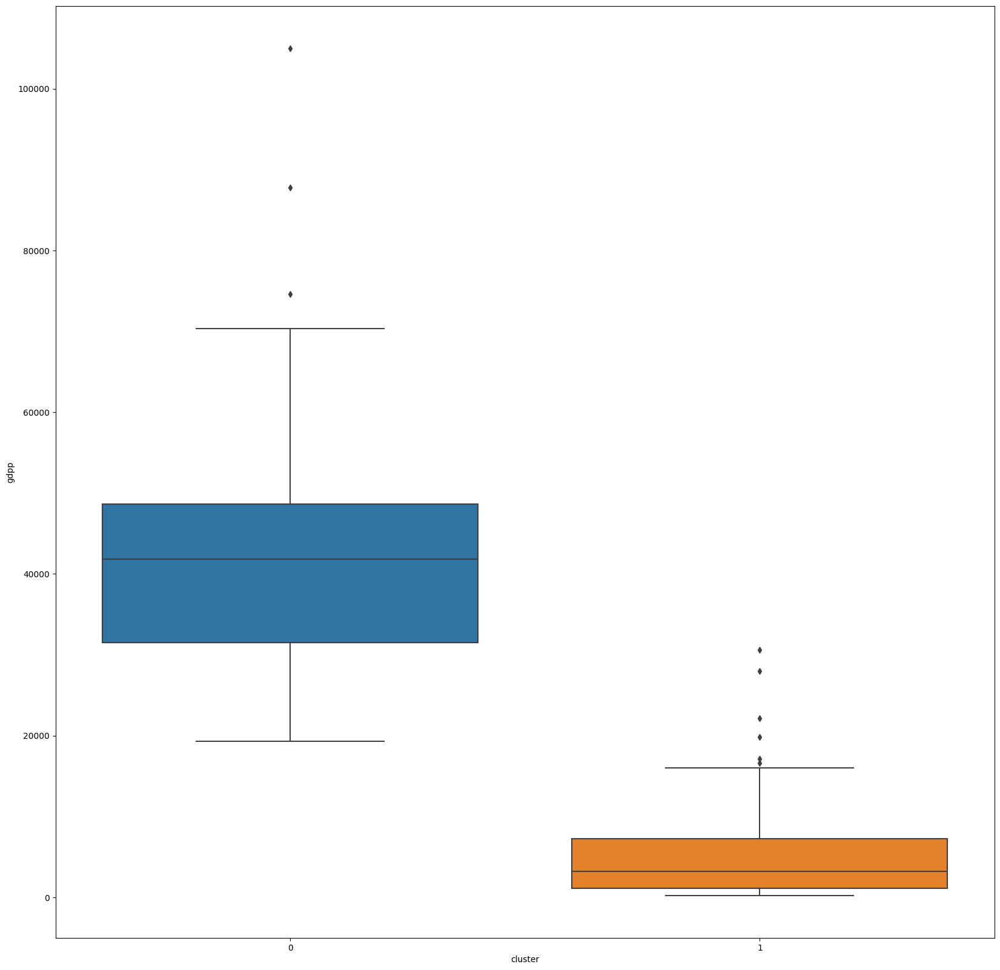

In [46]:
#plotting the clusters with the gdpp and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_pca_hierarchal)
plt.show()

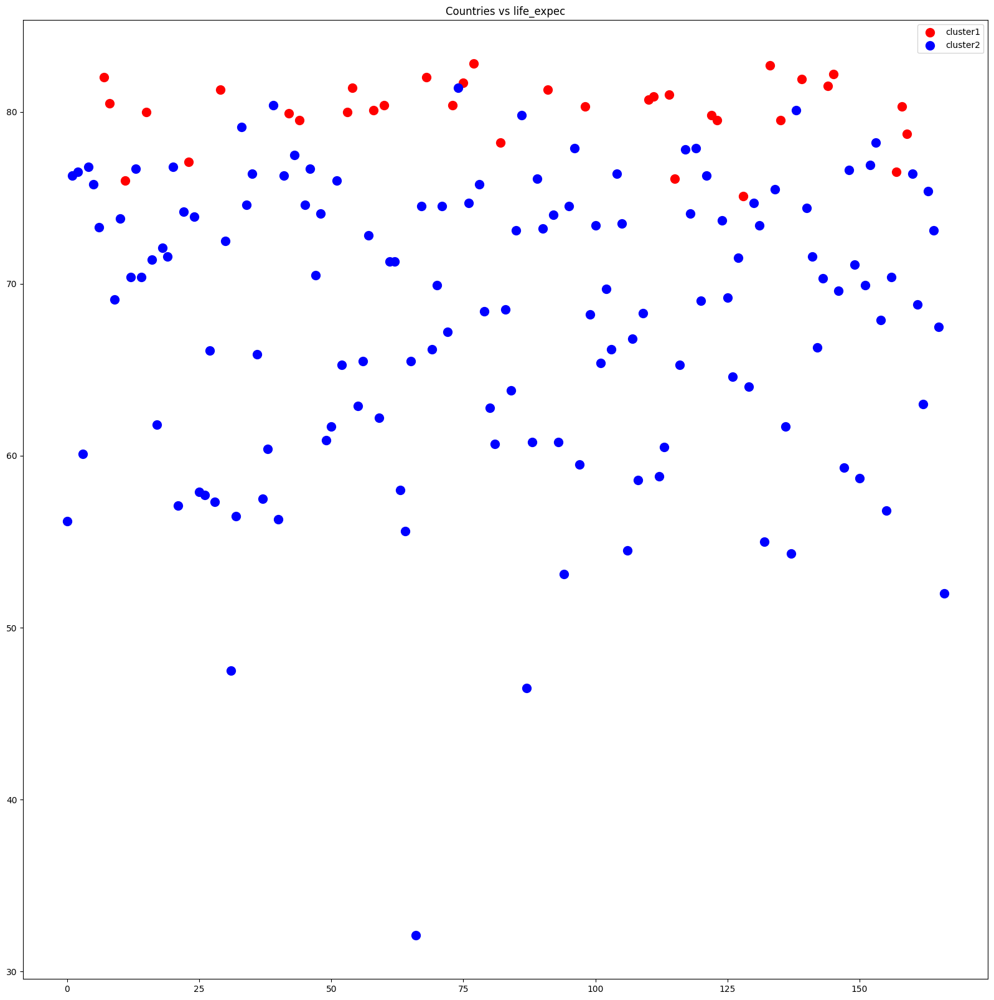

In [47]:
#plotting the clusters with the life expectancy and country names
plt.figure(figsize=(20,20))
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()

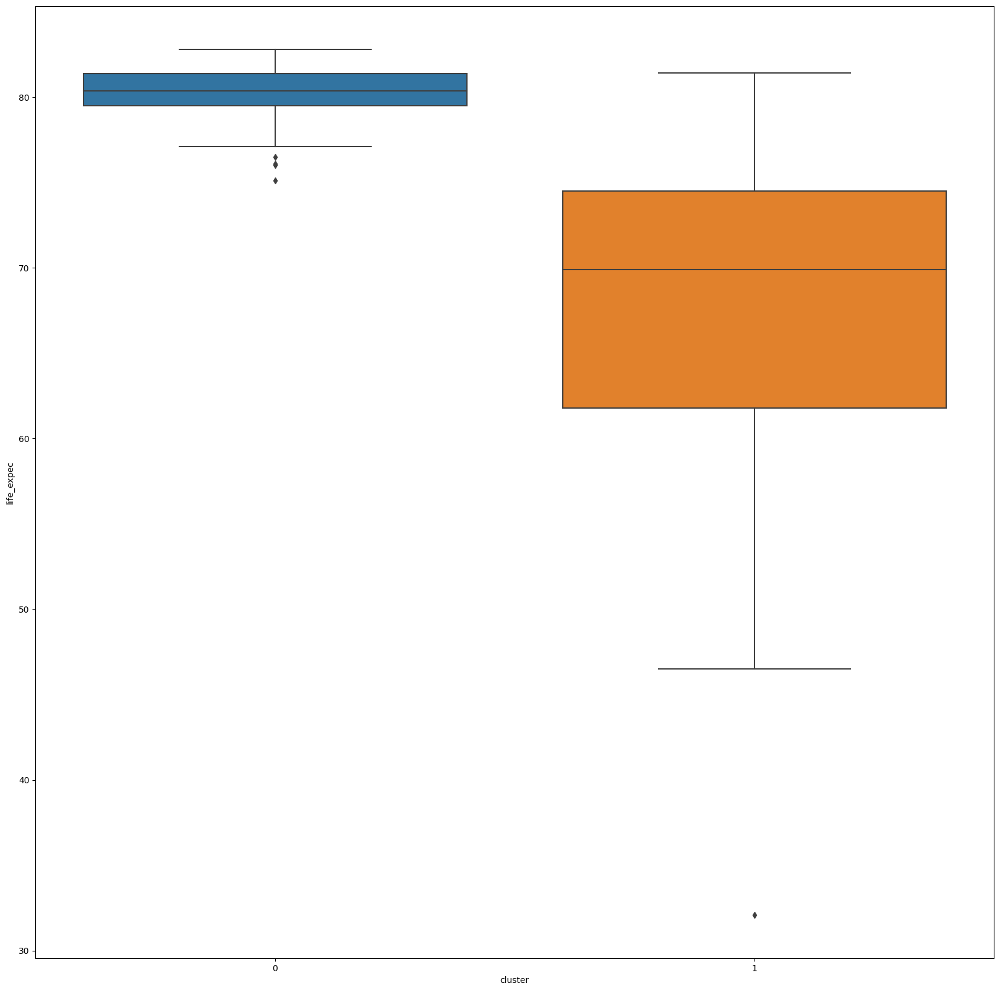

In [48]:
#plotting the clusters with the life expectancy and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_pca_hierarchal)
plt.show()

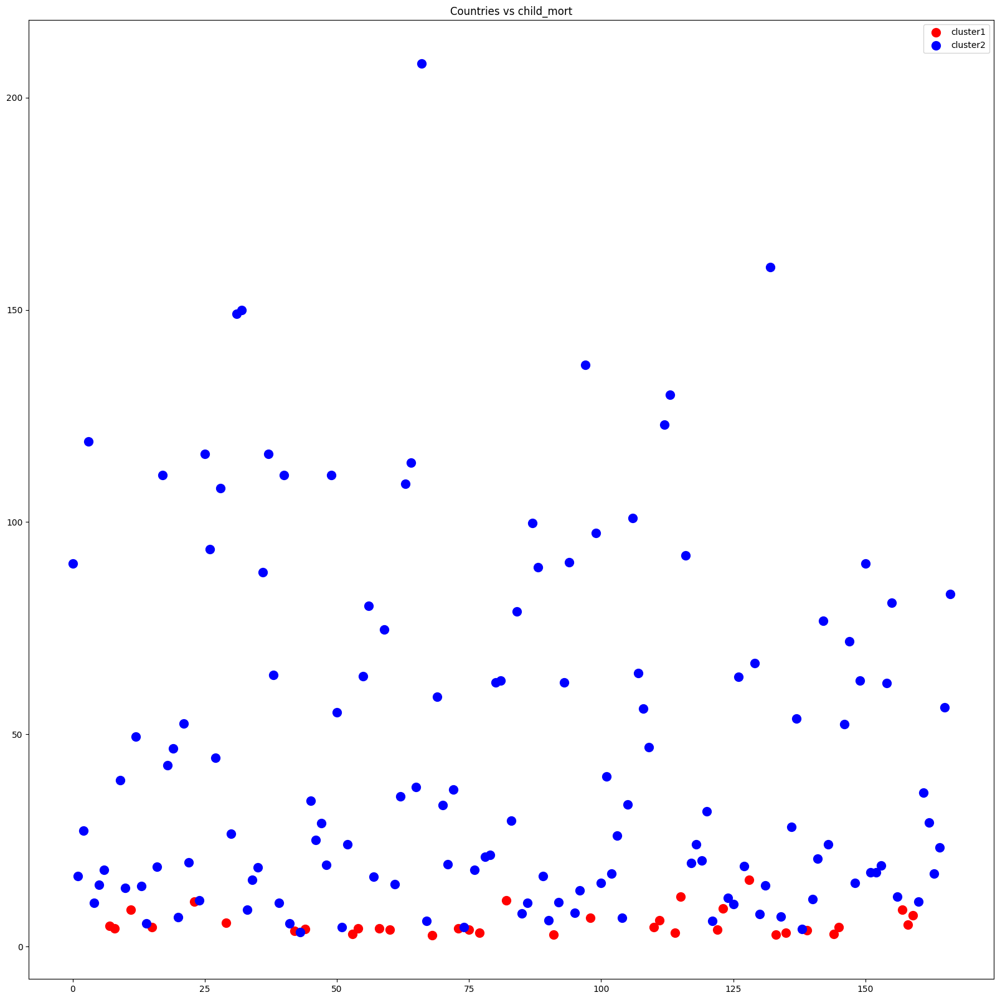

In [49]:
#plotting the clusters with the child mortality and country names
plt.figure(figsize=(20,20))
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['country'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
plt.title('Countries vs child_mort')
plt.legend()
plt.show()


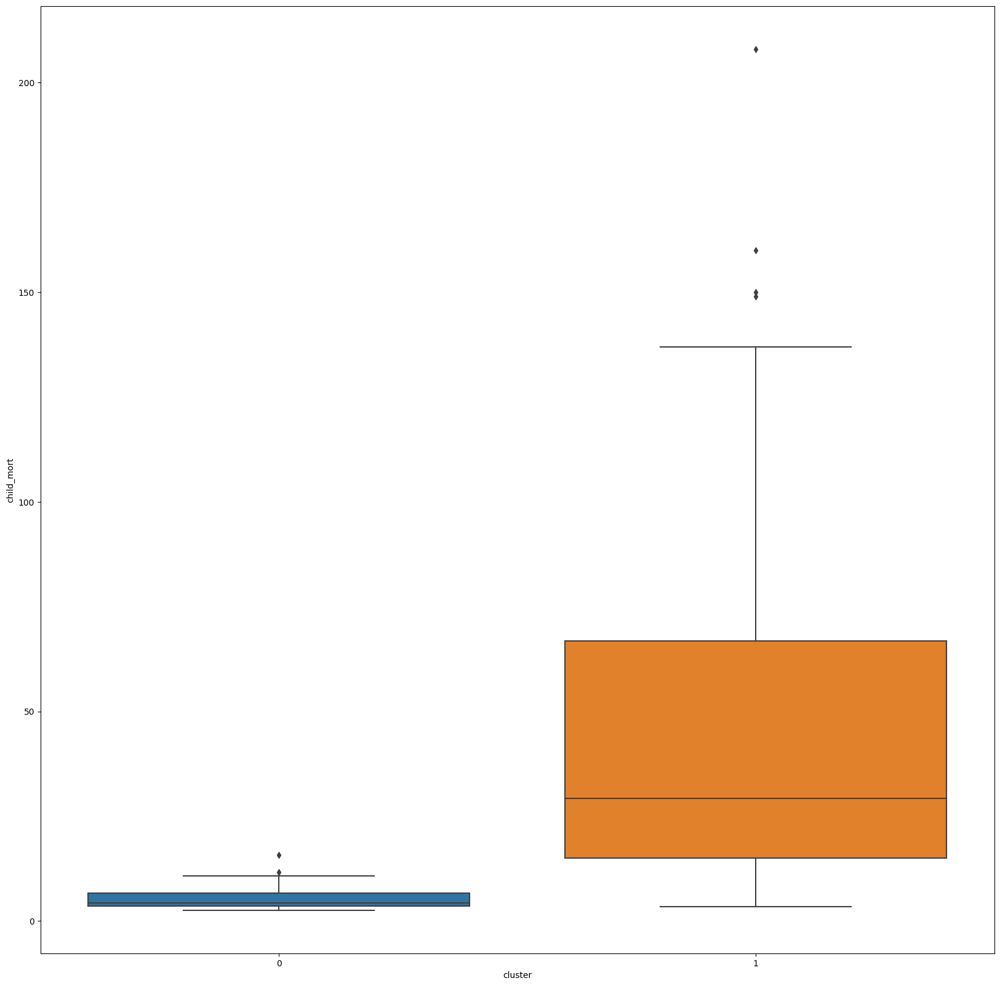

In [50]:
#plotting the clusters with the child mortality and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='child_mort',data=df_pca_hierarchal)
plt.show()

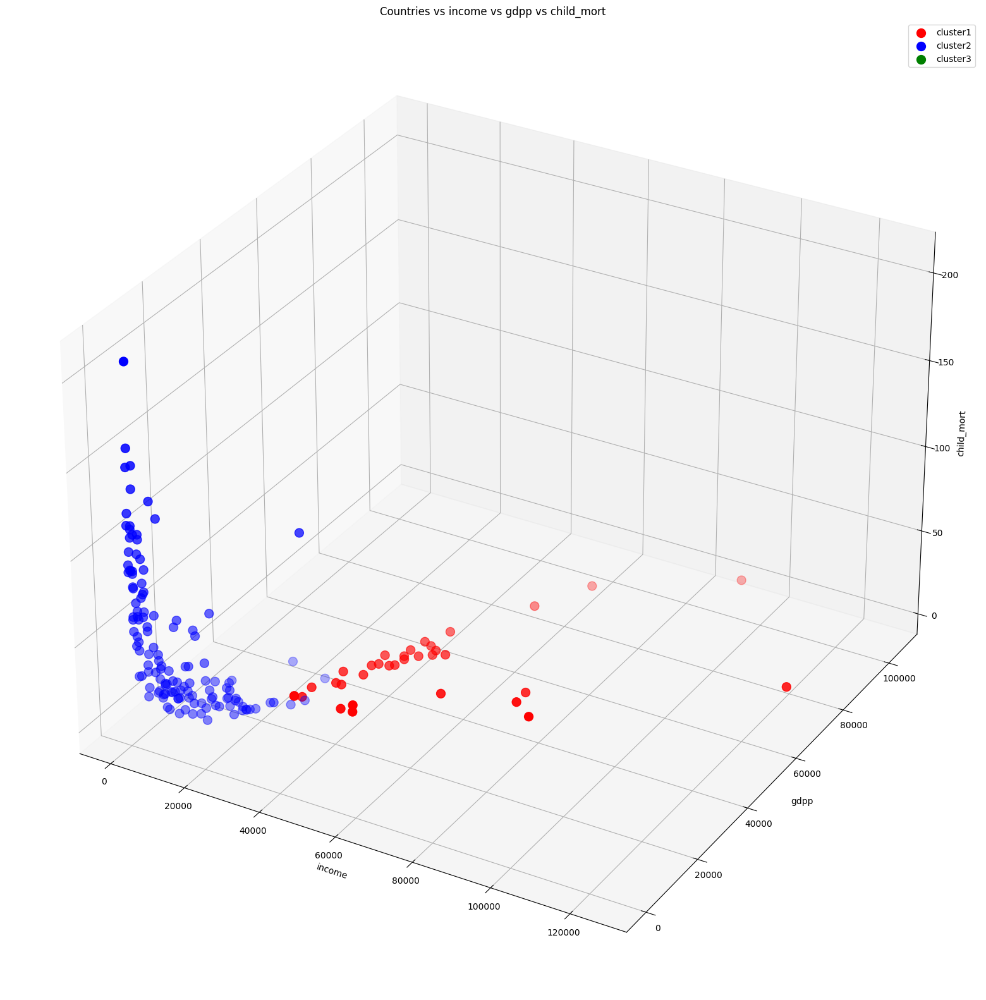

In [51]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['income'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['gdpp'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['income'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['gdpp'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==2]['income'],df_pca_hierarchal[df_pca_hierarchal['cluster']==2]['gdpp'],df_pca_hierarchal[df_pca_hierarchal['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

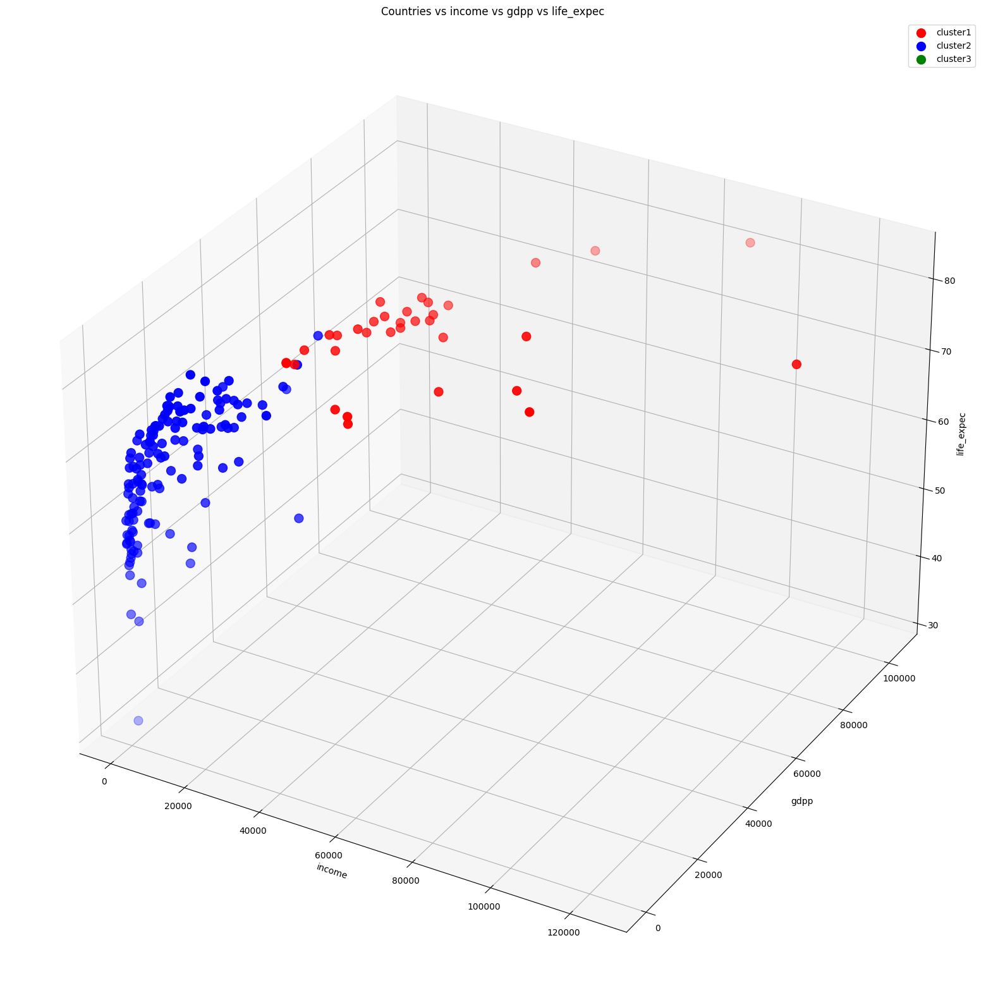

In [52]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['income'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['gdpp'],df_pca_hierarchal[df_pca_hierarchal['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['income'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['gdpp'],df_pca_hierarchal[df_pca_hierarchal['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_pca_hierarchal[df_pca_hierarchal['cluster']==2]['income'],df_pca_hierarchal[df_pca_hierarchal['cluster']==2]['gdpp'],df_pca_hierarchal[df_pca_hierarchal['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [53]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_pca_hierarchal, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

In [54]:
#preparing the plot_hierarchal_data to plot in the world map
plot_hierarchal_data = df_pca_hierarchal['cluster']
#adding the country names to the plot_hierarchal_data
plot_hierarchal_data = pd.concat([plot_hierarchal_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_hierarchal_data['cluster'] = plot_hierarchal_data['cluster'].replace({1:'Help Needed',0:'Least Help Needed'})
plot_hierarchal_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,Help Needed,Albania
2,Help Needed,Algeria
3,Help Needed,Angola
4,Help Needed,Antigua and Barbuda


In [55]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_hierarchal_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" represents the countries which "needed least help"


#**Applying DBSCAN on the PCA implemented dataset**

In [56]:
#implementing dbscan on the pca data
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=1.5, min_samples=2)
dbscan.fit(x_pca)
dbscan.labels_

array([-1,  0,  0,  1,  0,  0,  0,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        1,  0,  0,  0,  1,  0, -1,  0,  1,  1,  0,  1, -1,  0,  1,  1,  0,
        0,  0,  1,  1,  1,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0, -1,  1,
        0,  3,  0,  0,  1,  1,  0,  0,  1,  0,  0,  0,  1,  1,  0, -1,  0,
        0,  0,  0,  0,  4, -1,  0,  0,  0, -1,  0,  0,  1, -1, -1,  0,  0,
        0,  0,  5,  5,  0,  0, -1,  0,  1,  1,  0,  0,  1, -1,  1,  0, -1,
       -1, -1,  0,  0,  1,  0,  1,  0,  0,  2,  1, -1, -1,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  1,  3,  0,  1,  0, -1,  1, -1,  0,  0,
       -1,  1,  0,  0,  0,  0, -1,  0,  0,  0,  0,  1,  0, -1,  1,  3,  0,
        0, -1,  1,  0,  0,  0, -1,  0,  0,  3, -1,  0,  4,  1],
      dtype=int64)

In [57]:
print(np.unique(dbscan.labels_))

[-1  0  1  2  3  4  5]


##Visualization of the dataset after applying DBSCAN

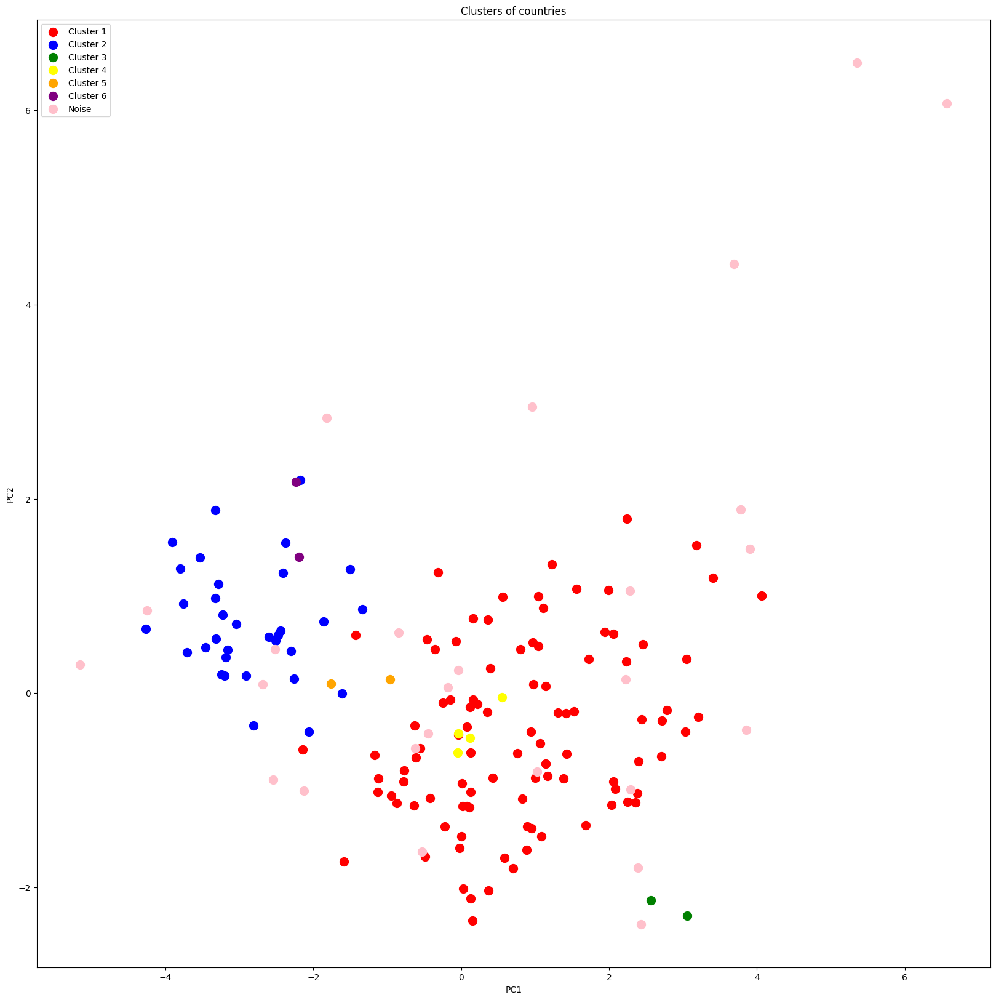

In [58]:
#plotting the clusters
plt.figure(figsize=(20,20))
plt.scatter(x_pca[dbscan.labels_ == 0, 0], x_pca[dbscan.labels_ == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(x_pca[dbscan.labels_ == 1, 0], x_pca[dbscan.labels_ == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(x_pca[dbscan.labels_ == 2, 0], x_pca[dbscan.labels_ == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(x_pca[dbscan.labels_ == 3, 0], x_pca[dbscan.labels_ == 3, 1], s = 100, c = 'yellow', label = 'Cluster 4')
plt.scatter(x_pca[dbscan.labels_ == 4, 0], x_pca[dbscan.labels_ == 4, 1], s = 100, c = 'orange', label = 'Cluster 5')
plt.scatter(x_pca[dbscan.labels_ == 5, 0], x_pca[dbscan.labels_ == 5, 1], s = 100, c = 'purple', label = 'Cluster 6')
plt.scatter(x_pca[dbscan.labels_ == -1, 0], x_pca[dbscan.labels_ == -1, 1], s = 100, c = 'pink', label = 'Noise')
plt.title('Clusters of countries')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

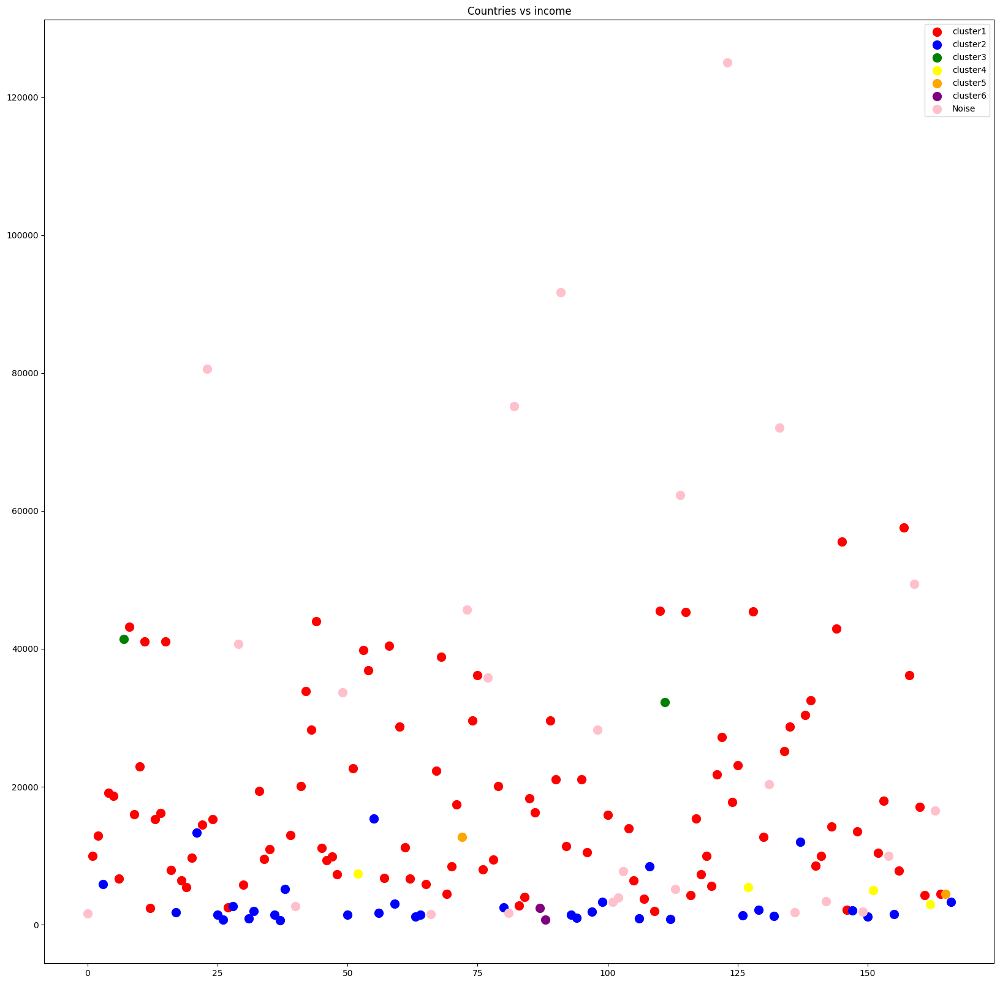

In [59]:
#plottng the clusters with the income and country names
df_pca_dbscan['cluster'] = dbscan.labels_
plt.figure(figsize=(20,20))
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==0]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==2]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['income'],s=100,c='green',label='cluster3')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==3]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==3]['income'],s=100,c='yellow',label='cluster4')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==4]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==4]['income'],s=100,c='orange',label='cluster5')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==5]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==5]['income'],s=100,c='purple',label='cluster6')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==-1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==-1]['income'],s=100,c='pink',label='Noise')
plt.title('Countries vs income')
plt.legend()
plt.show()

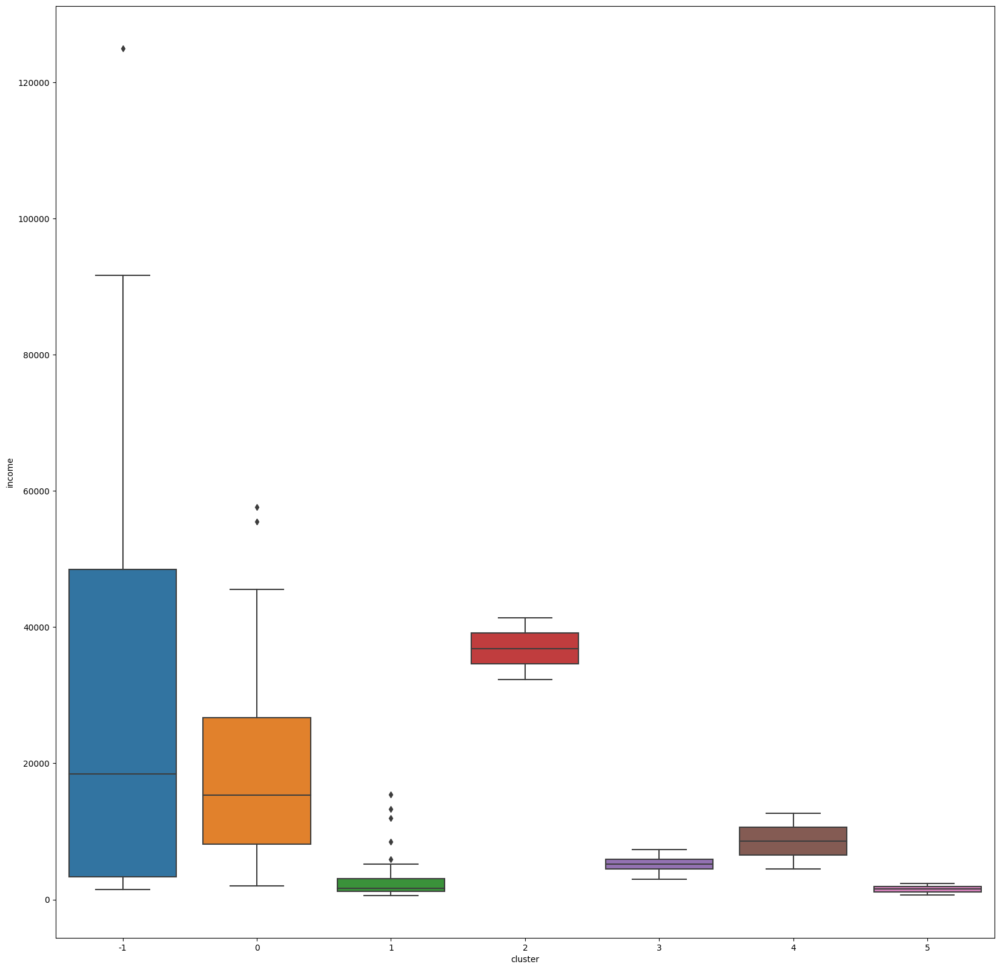

In [60]:
#plotting the clusters with the income and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_pca_dbscan)
plt.show()

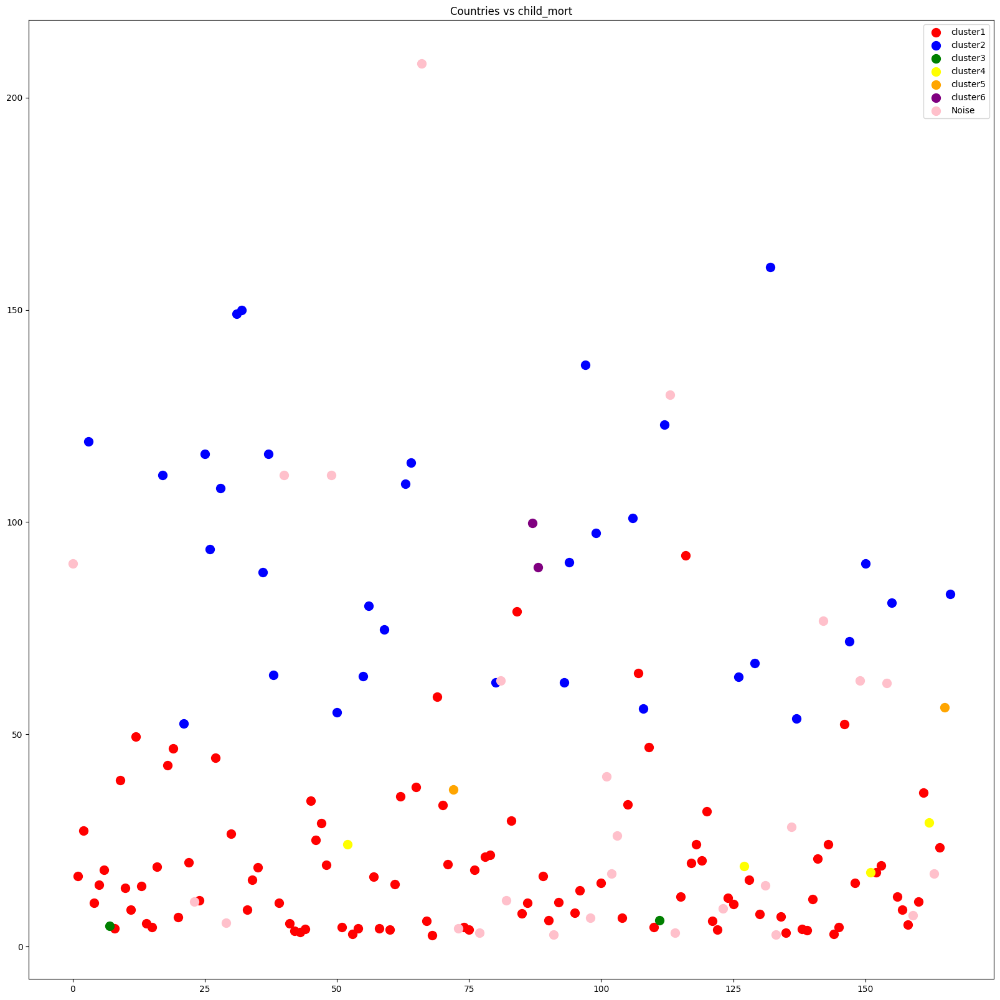

In [61]:
#plottng the clusters with the child_mort and country names
df_pca_dbscan['cluster'] = dbscan.labels_
plt.figure(figsize=(20,20))
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==0]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==2]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==3]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==3]['child_mort'],s=100,c='yellow',label='cluster4')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==4]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==4]['child_mort'],s=100,c='orange',label='cluster5')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==5]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==5]['child_mort'],s=100,c='purple',label='cluster6')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==-1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==-1]['child_mort'],s=100,c='pink',label='Noise')
plt.title('Countries vs child_mort')
plt.legend()
plt.show()

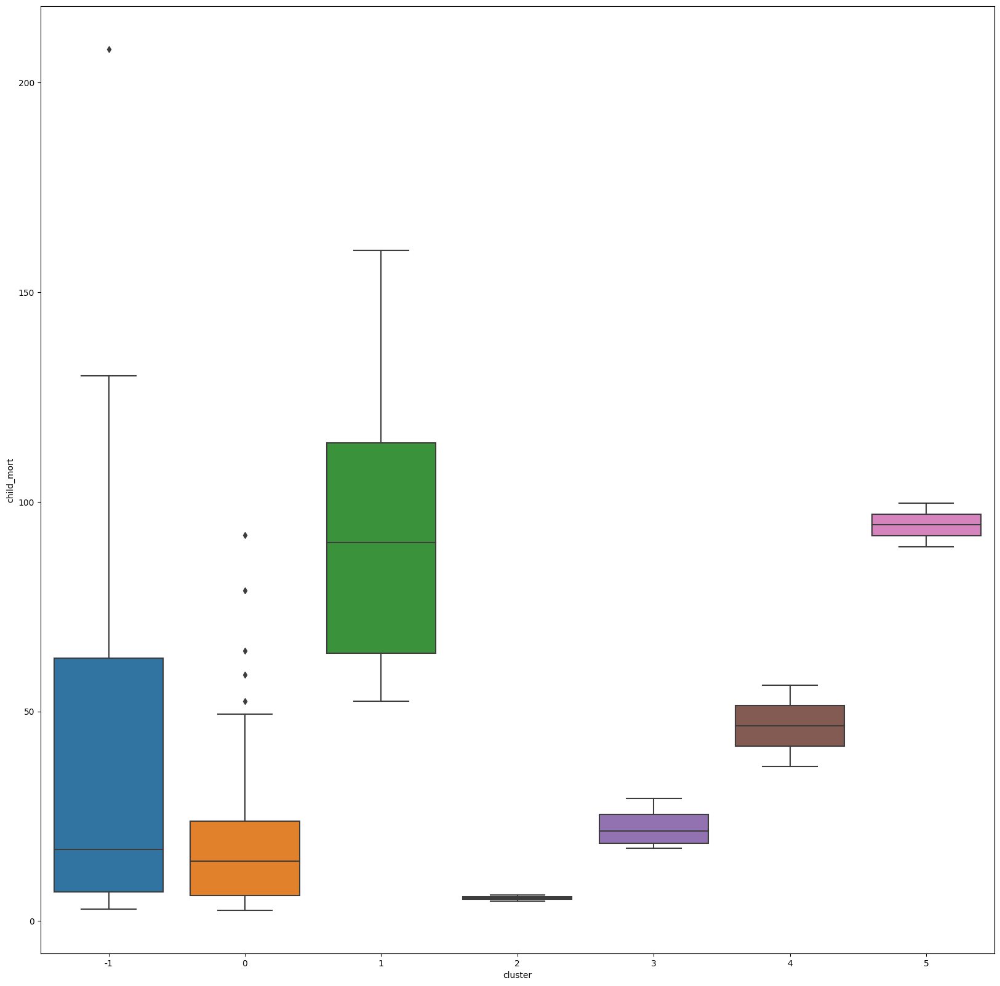

In [62]:
#plotting the clusters with the child_mort and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='child_mort',data=df_pca_dbscan)
plt.show()

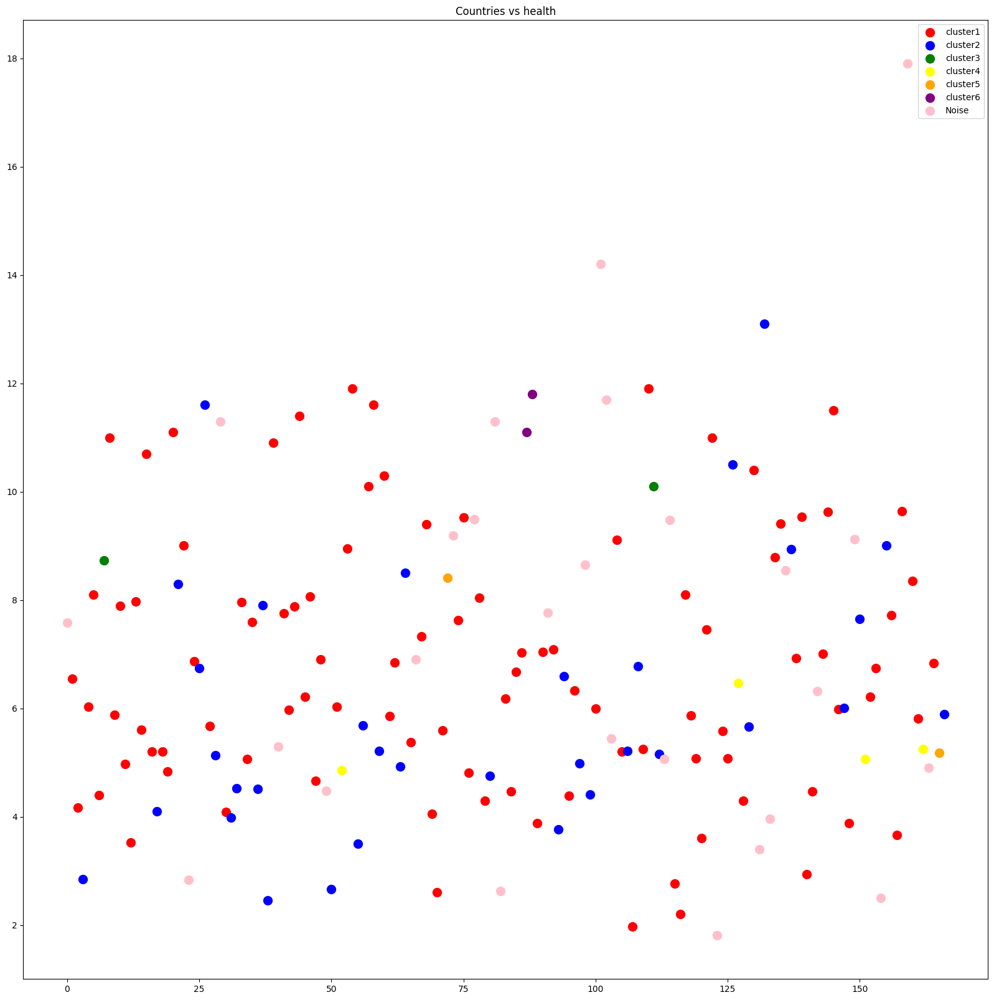

In [63]:
#plottng the clusters with the health and country names
df_pca_dbscan['cluster'] = dbscan.labels_
plt.figure(figsize=(20,20))
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==0]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['health'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['health'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==2]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['health'],s=100,c='green',label='cluster3')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==3]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==3]['health'],s=100,c='yellow',label='cluster4')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==4]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==4]['health'],s=100,c='orange',label='cluster5')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==5]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==5]['health'],s=100,c='purple',label='cluster6')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==-1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==-1]['health'],s=100,c='pink',label='Noise')
plt.title('Countries vs health')
plt.legend()
plt.show()

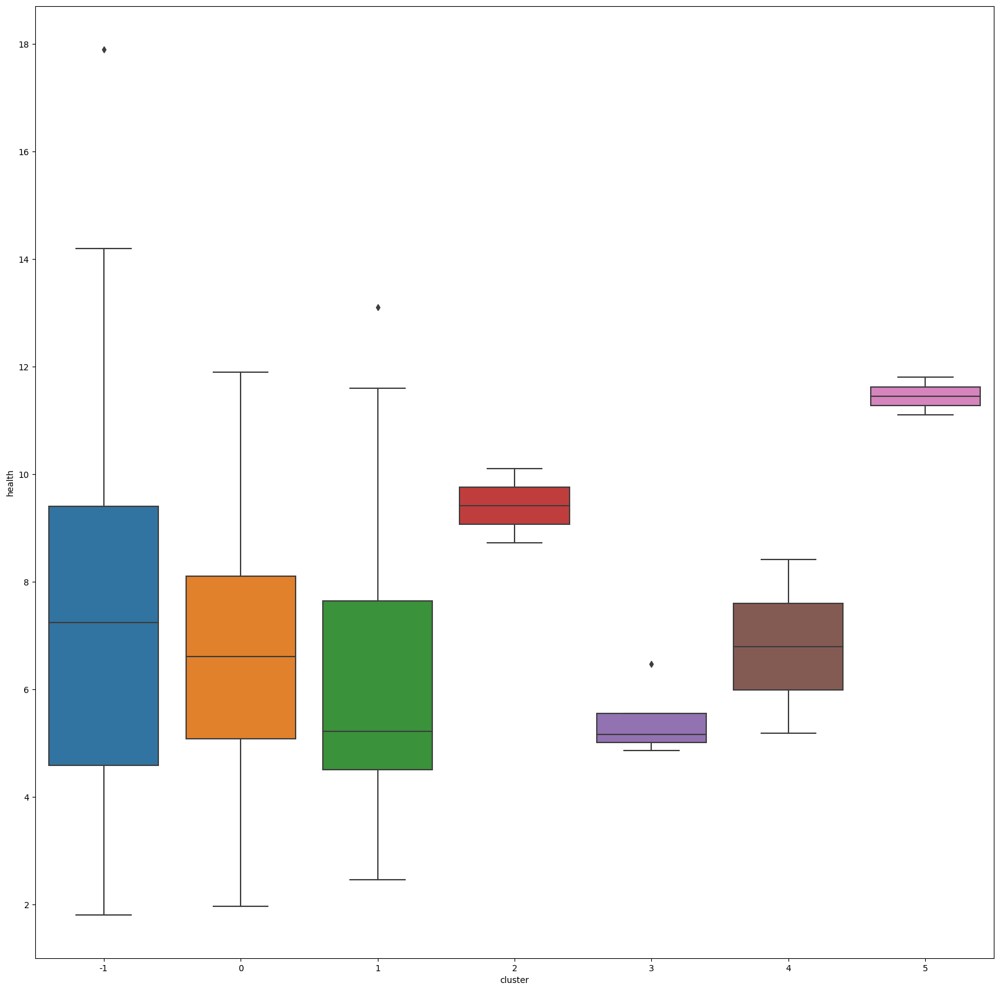

In [64]:
#plotting the clusters with the health and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='health',data=df_pca_dbscan)
plt.show()

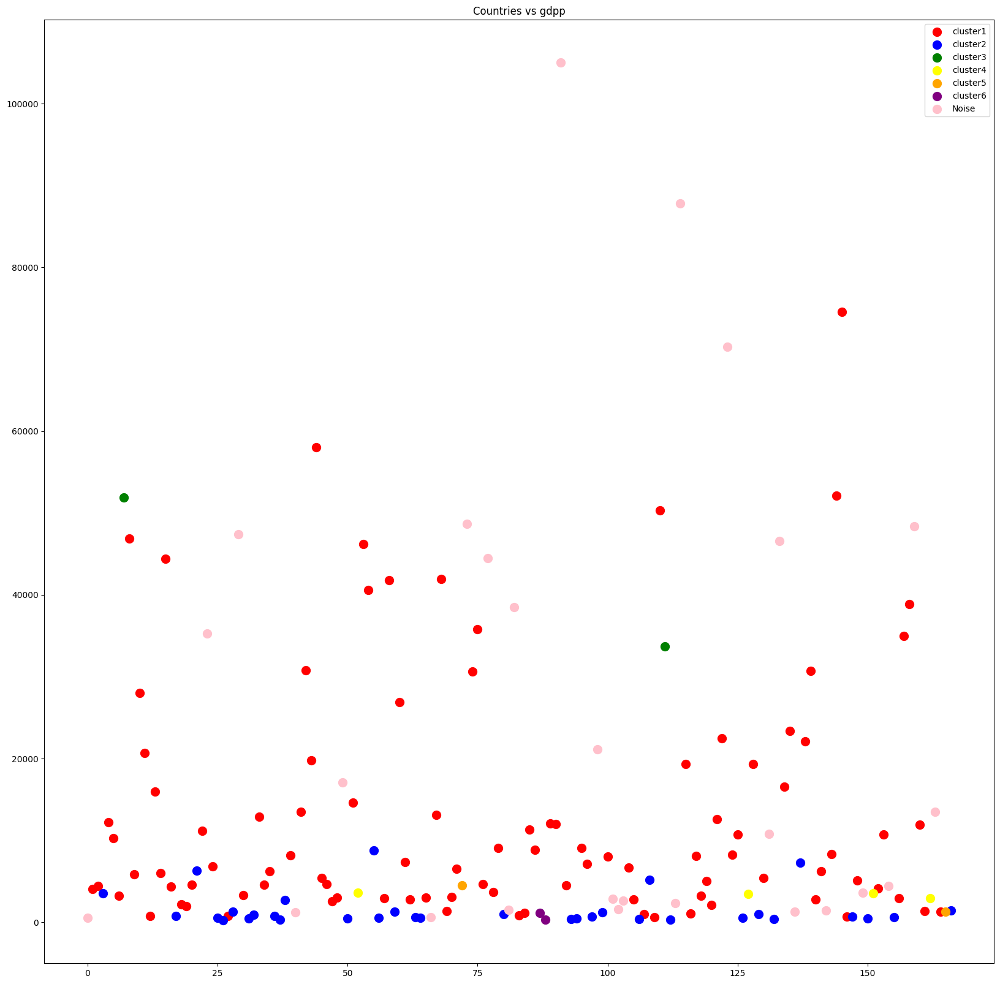

In [65]:
#plottng the clusters with the gdpp and country names
df_pca_dbscan['cluster'] = dbscan.labels_
plt.figure(figsize=(20,20))
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==0]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==2]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['gdpp'],s=100,c='green',label='cluster3')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==3]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==3]['gdpp'],s=100,c='yellow',label='cluster4')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==4]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==4]['gdpp'],s=100,c='orange',label='cluster5')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==5]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==5]['gdpp'],s=100,c='purple',label='cluster6')
plt.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==-1]['country'],df_pca_dbscan[df_pca_dbscan['cluster']==-1]['gdpp'],s=100,c='pink',label='Noise')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()


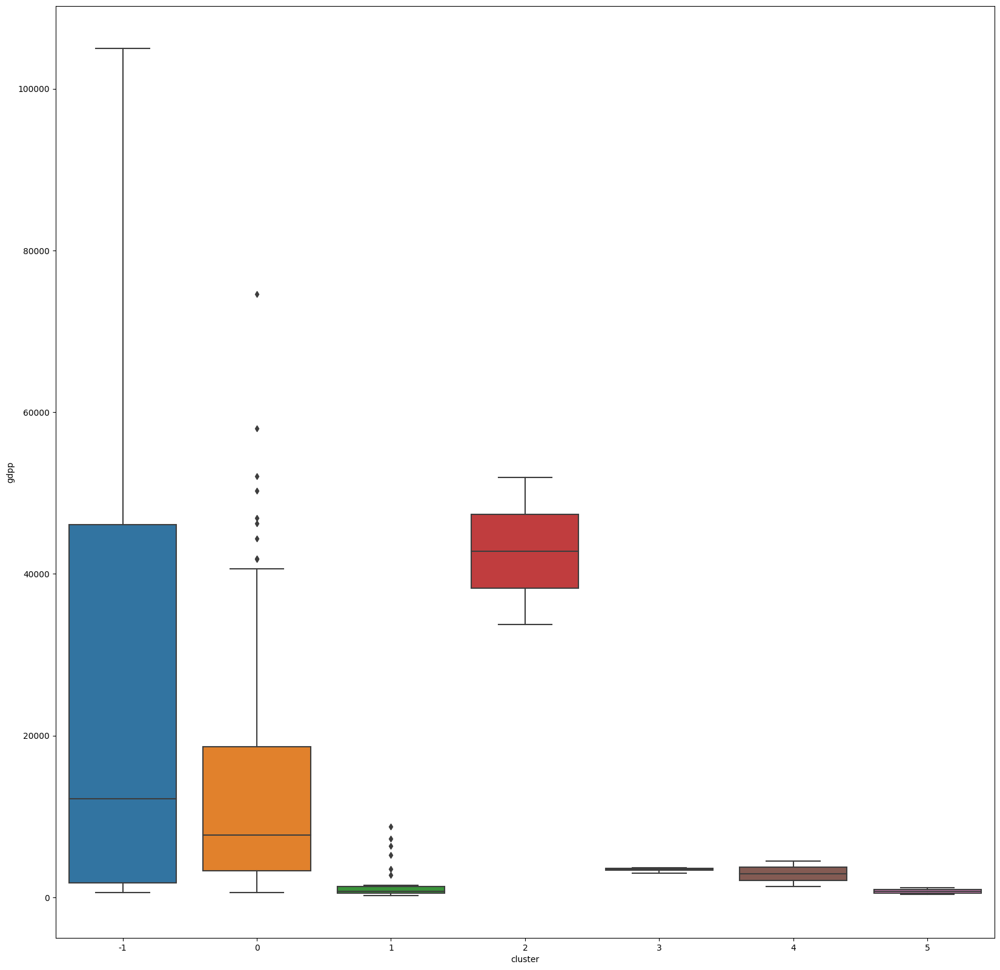

In [66]:
#plotting the clusters with the gdpp and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_pca_dbscan)
plt.show()

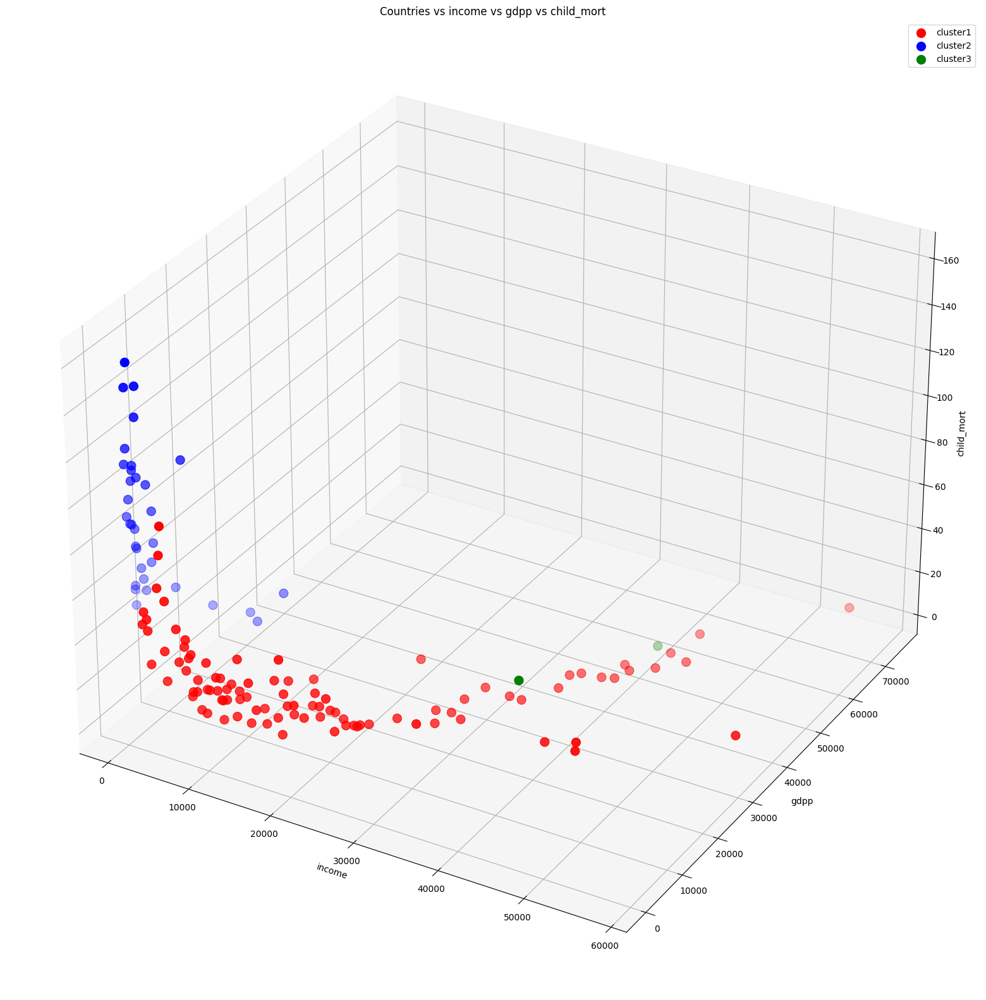

In [67]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==0]['income'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['gdpp'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==1]['income'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['gdpp'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==2]['income'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['gdpp'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

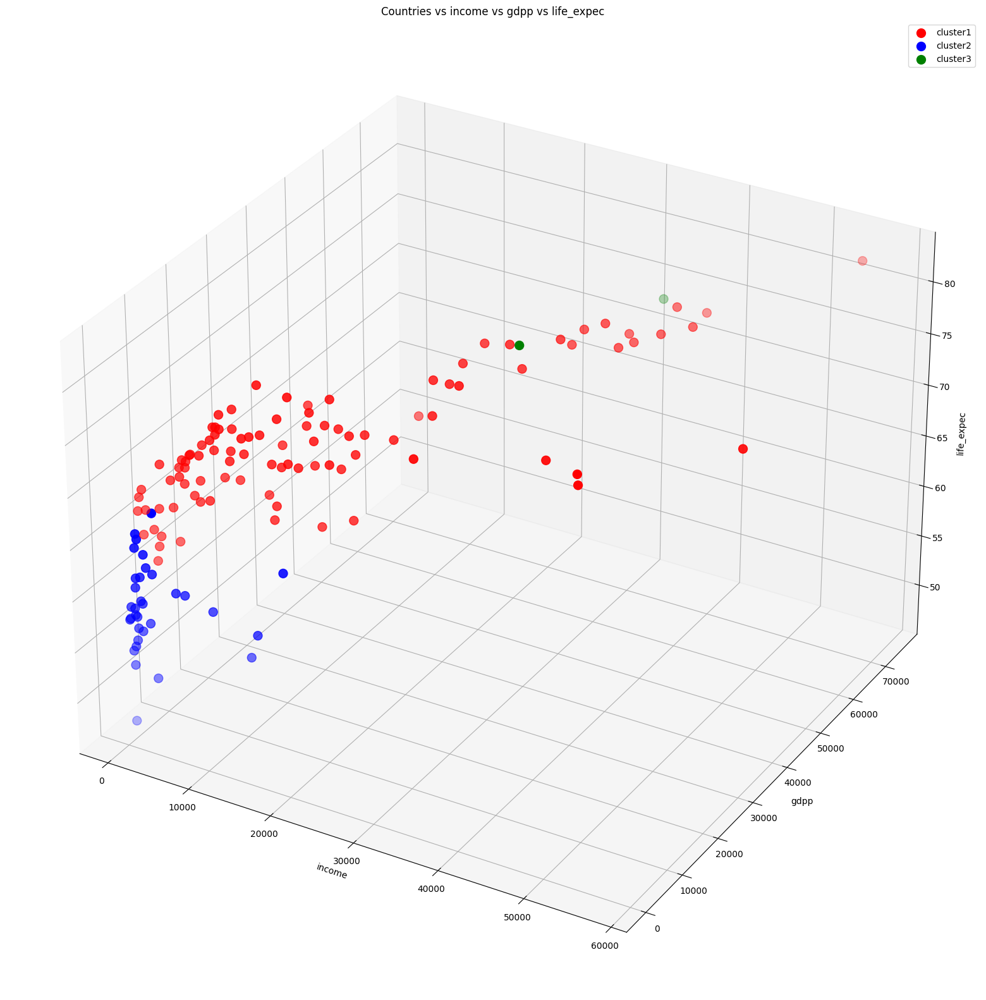

In [68]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==0]['income'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['gdpp'],df_pca_dbscan[df_pca_dbscan['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==1]['income'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['gdpp'],df_pca_dbscan[df_pca_dbscan['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_pca_dbscan[df_pca_dbscan['cluster']==2]['income'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['gdpp'],df_pca_dbscan[df_pca_dbscan['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [69]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_pca_dbscan, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

From above we can see that cluster 2,6,5 needs more help than cluster 3,4,1.

In [70]:
#preparing the data for world map plot
plot_dbscan_data = df_pca_dbscan['cluster']
#adding the country names to the plot_dbscan_data
plot_dbscan_data = pd.concat([plot_dbscan_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_dbscan_data['cluster'] = plot_dbscan_data['cluster'].replace({1:'May Need Help',0:'Least Help Needed',2:'Least Help Needed',3:'Least Help Needed',4:'May Need Help',5:'May Need Help',-1:'Noise'})
plot_dbscan_data.head()

,cluster,country
0,Noise,Afghanistan
1,Least Help Needed,Albania
2,Least Help Needed,Algeria
3,May Need Help,Angola
4,Least Help Needed,Antigua and Barbuda


In [71]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_dbscan_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Color "Red" corresponds to the countries which are classified as Noise by DBSCAN

Color "Blue" represents the countries which "needed least help"

Color "Green" represents the countries which "may need help"

#**LDA and applying K-Means on the data**

In [72]:
#implementing the lda on the data
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
y = df_lda_kmeans['region']
x = df_lda_kmeans.drop(['country','region'],axis=1)
#finding the optimal number of components for the lda
lda = LDA(n_components = None)
x_lda = lda.fit_transform(x,y)
explained_variance = lda.explained_variance_ratio_
explained_variance


array([0.6021097 , 0.22631085, 0.11350278, 0.05807668])

In [73]:
#fittting the lda on the data with 3 components
lda = LDA(n_components = 3)
x_lda = lda.fit_transform(x,y)
explained_variance = lda.explained_variance_ratio_

In [74]:
#converting the x_lda to a dataframe
x_lda = pd.DataFrame(x_lda)
x_lda.columns = ['LD1','LD2','LD3']
x_lda.head()

,LD1,LD2,LD3
0,-2.484011,-1.784605,0.965424
1,0.620542,1.523226,-0.870028
2,0.164263,-0.058553,-1.658536
3,-3.402045,0.388096,-0.243325
4,1.343210,-1.229970,-0.818527


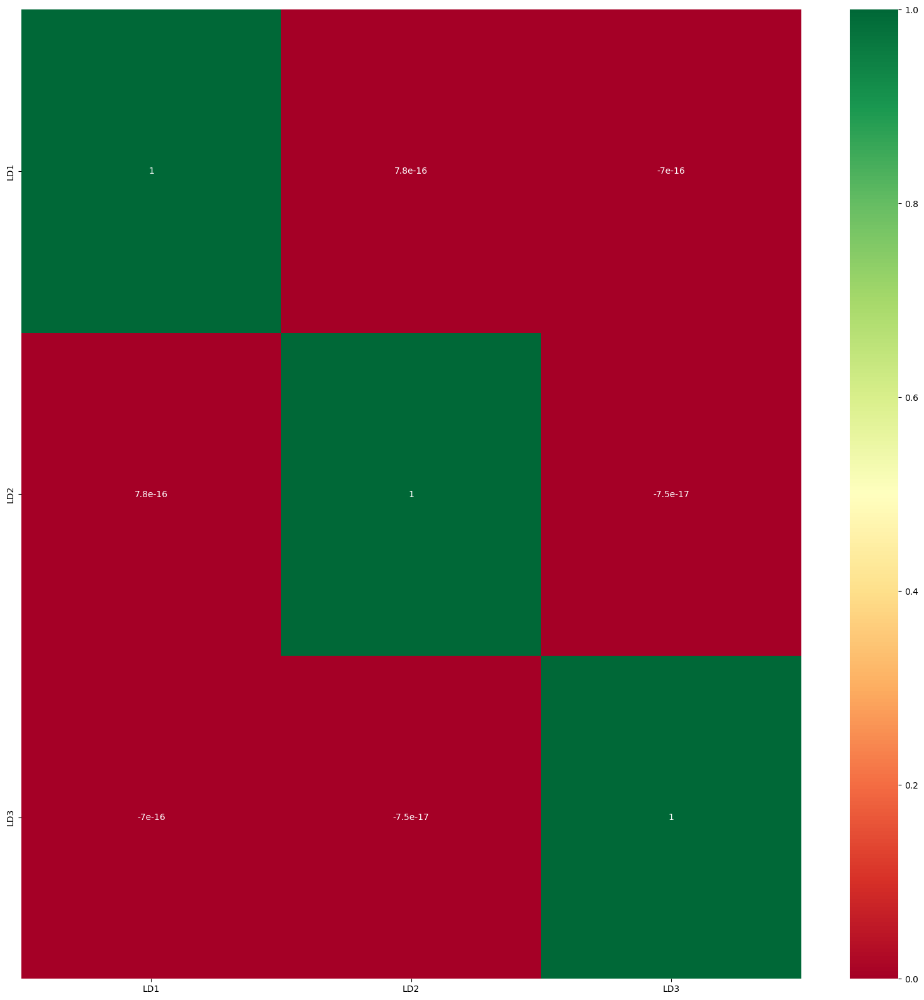

In [75]:
#plotting the corelation between the components
plt.figure(figsize=(20,20))
sns.heatmap(pd.DataFrame(x_lda).corr(),annot=True,cmap='RdYlGn')
plt.show()

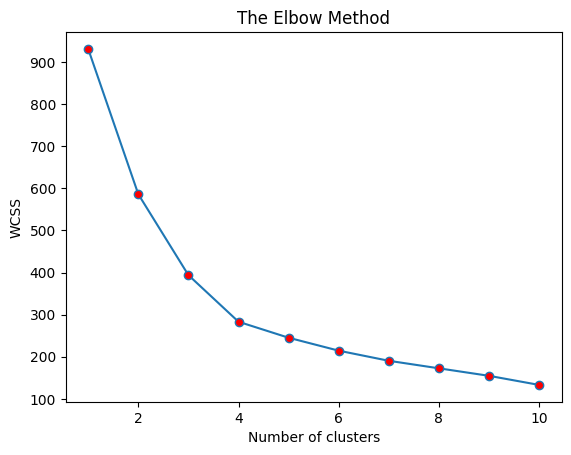

In [76]:
#implementing the kmeans on the lda data
from sklearn.cluster import KMeans
#finding the optimal number of clusters
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(x_lda)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss,marker='o',markerfacecolor='red')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

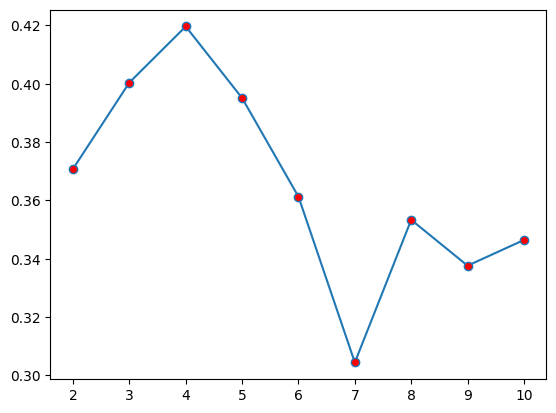

In [77]:
#plotting the silhouette score for the kmeans
from sklearn.metrics import silhouette_score
sil = []
kmax = 10
for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters = k).fit(x_lda)
    labels = kmeans.labels_
    sil.append(silhouette_score(x_lda, labels, metric = 'euclidean'))
plt.plot([2,3,4,5,6,7,8,9,10],sil,marker='o',markerfacecolor='red')
plt.show()


In [78]:
#implementing the kmeans on the lda data with 4 clusters
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)
y_kmeans = kmeans.fit_predict(x_lda)
y_kmeans

array([0, 2, 1, 0, 1, 1, 2, 1, 2, 2, 1, 2, 2, 1, 1, 2, 1, 0, 2, 1, 1, 0,
       1, 1, 1, 0, 0, 2, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 2, 2, 1,
       1, 1, 1, 1, 1, 0, 0, 2, 1, 1, 2, 0, 0, 2, 2, 0, 2, 1, 1, 0, 0, 1,
       0, 1, 1, 2, 2, 2, 0, 1, 2, 2, 1, 1, 2, 1, 0, 1, 2, 2, 2, 2, 2, 0,
       0, 1, 2, 2, 2, 0, 0, 2, 2, 0, 2, 0, 2, 0, 1, 1, 2, 1, 0, 2, 0, 2,
       2, 1, 0, 0, 1, 2, 0, 1, 1, 1, 2, 1, 2, 2, 1, 1, 0, 0, 2, 0, 2, 2,
       0, 2, 2, 2, 1, 0, 1, 2, 2, 2, 0, 1, 1, 2, 1, 0, 2, 0, 0, 1, 1, 2,
       1, 0, 1, 2, 1, 1, 1, 1, 1, 1, 2, 0, 0])

##Visualization of the dataset after applying LDA


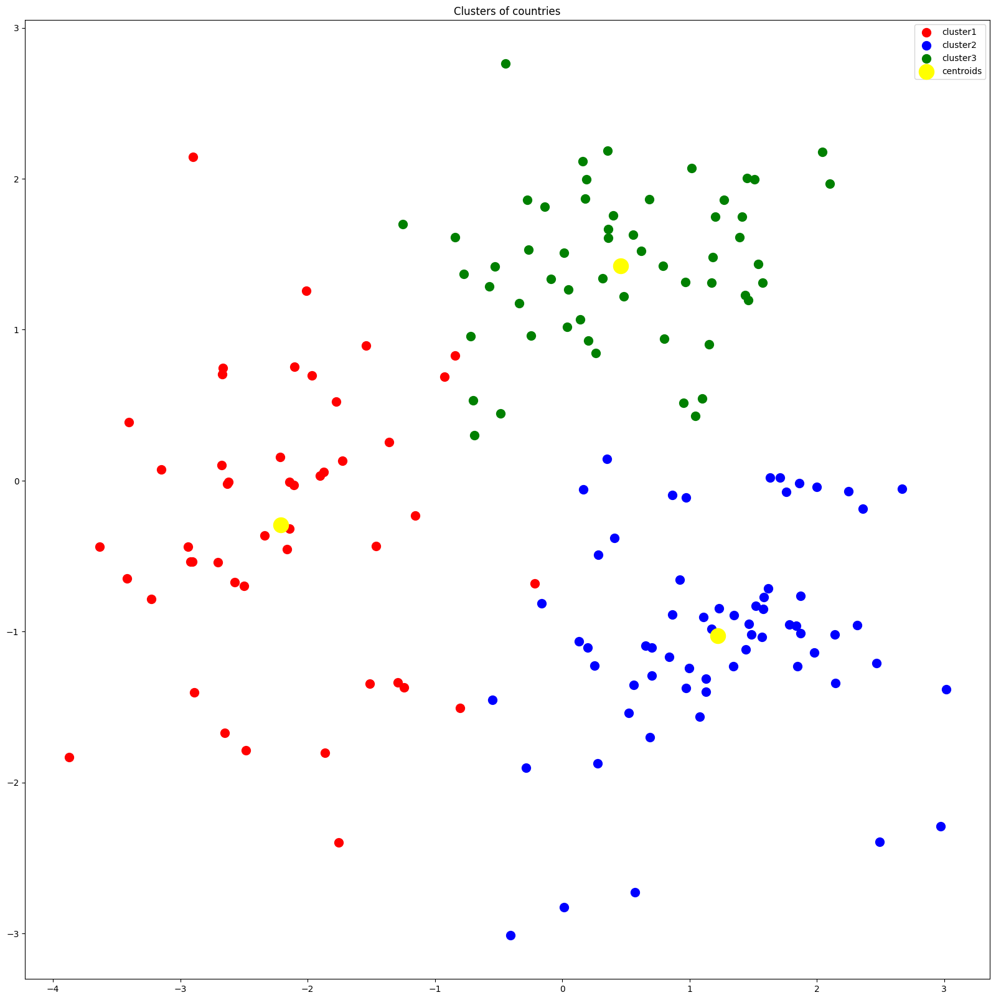

In [79]:
#plotting all clusters along with the centroids
plt.figure(figsize=(20,20))
plt.scatter(x_lda[y_kmeans==0]['LD1'],x_lda[y_kmeans==0]['LD2'],s=100,c='red',label='cluster1')
plt.scatter(x_lda[y_kmeans==1]['LD1'],x_lda[y_kmeans==1]['LD2'],s=100,c='blue',label='cluster2')
plt.scatter(x_lda[y_kmeans==2]['LD1'],x_lda[y_kmeans==2]['LD2'],s=100,c='green',label='cluster3')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],s=300,c='yellow',label='centroids')
plt.title('Clusters of countries')
plt.legend()
plt.show()

In [80]:
df_lda_kmeans['cluster'] = y_kmeans
df_lda_kmeans.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,region,sub-region,cluster
0,0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,2,12,0
1,1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,3,13,2
2,2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,0,7,1
3,3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,0,14,0
4,4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,1,4,1


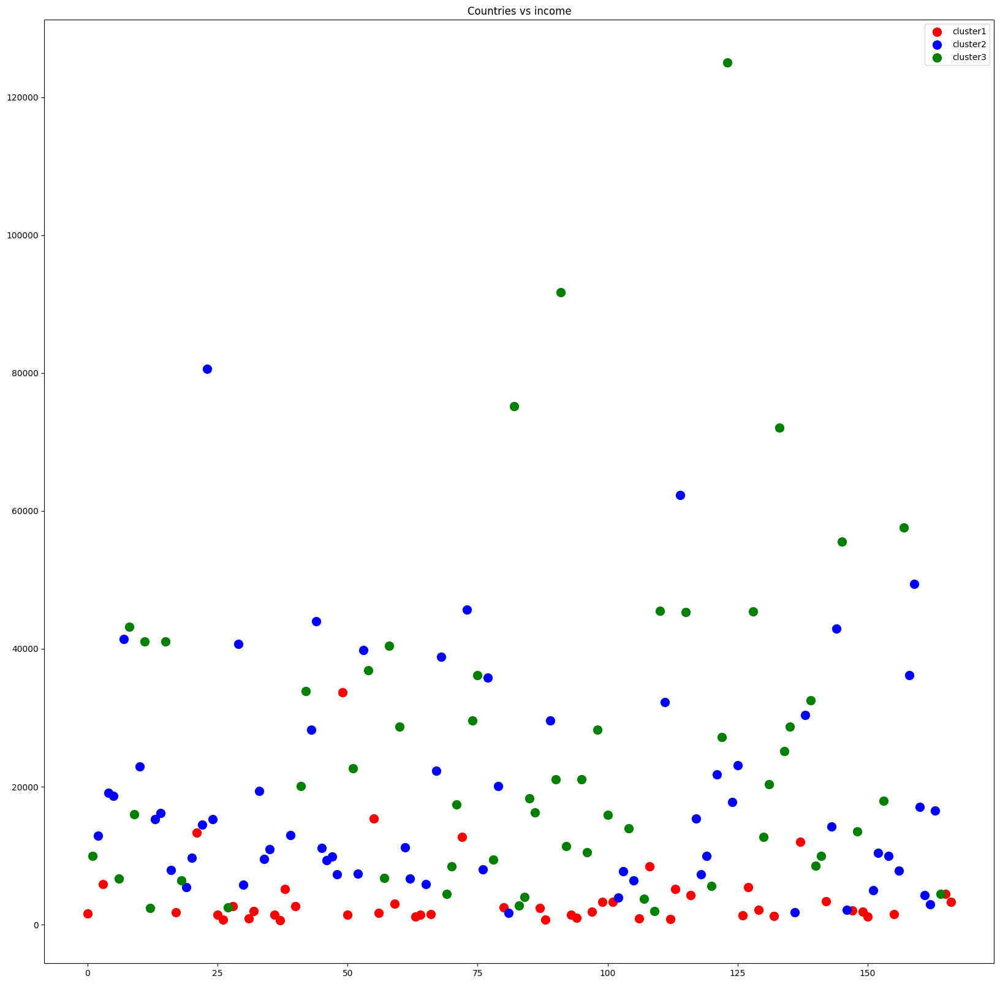

In [81]:
#plotting the clusters with the income and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==0]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==1]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==2]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['income'],s=100,c='green',label='cluster3')
plt.title('Countries vs income')
plt.legend()
plt.show()

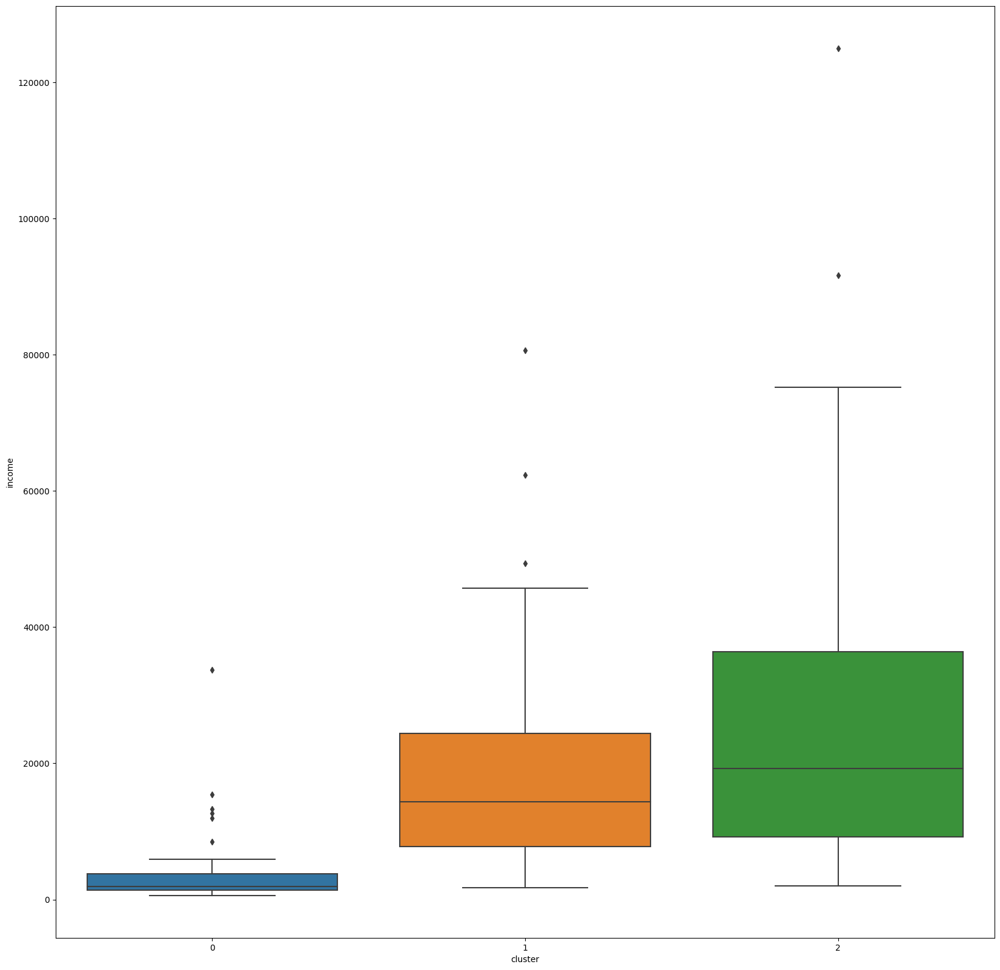

In [82]:
#plotting the clusters with the income and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_lda_kmeans)
plt.show()

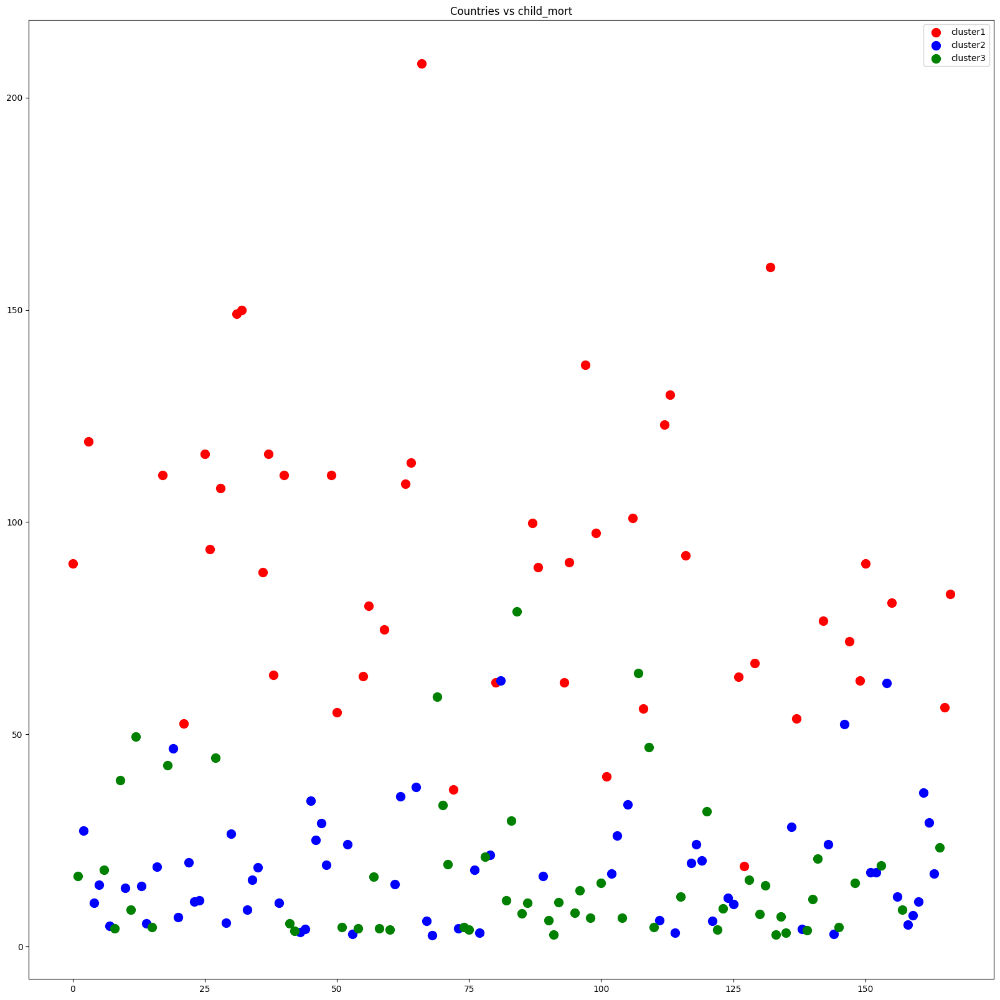

In [83]:
#plotting the clusters with the child_mort and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==0]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==1]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==2]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
plt.title('Countries vs child_mort')
plt.legend()
plt.show()

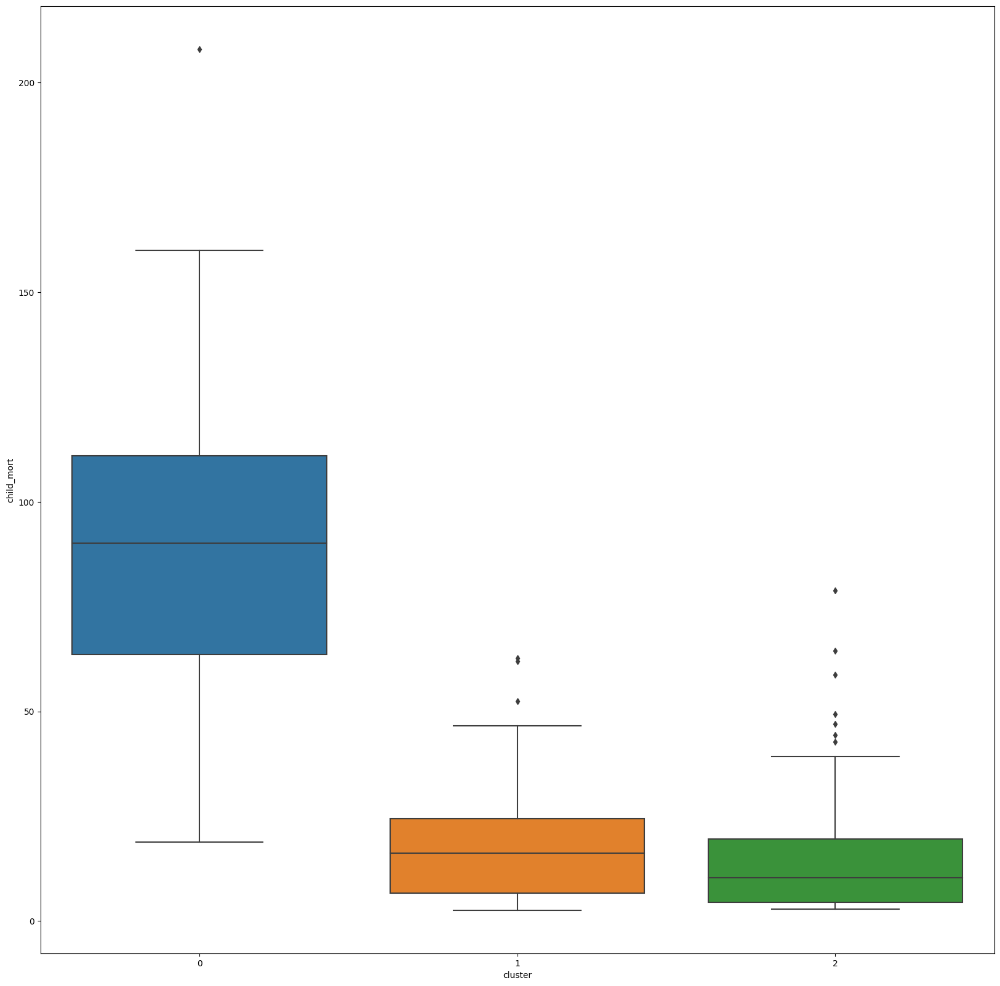

In [84]:
#plotting the clusters with the child_mort and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='child_mort',data=df_lda_kmeans)
plt.show()

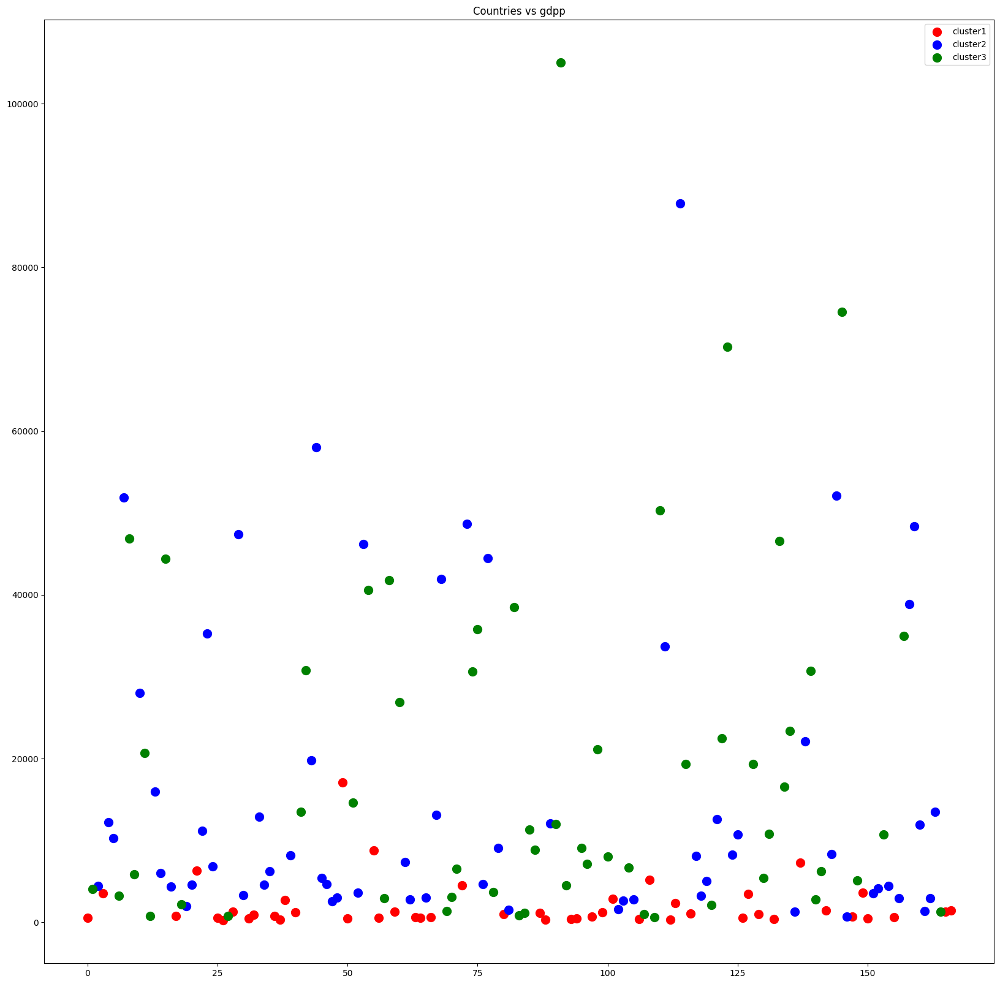

In [85]:
#plotting the clusters with the gdpp and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==0]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==1]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==2]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['gdpp'],s=100,c='green',label='cluster3')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

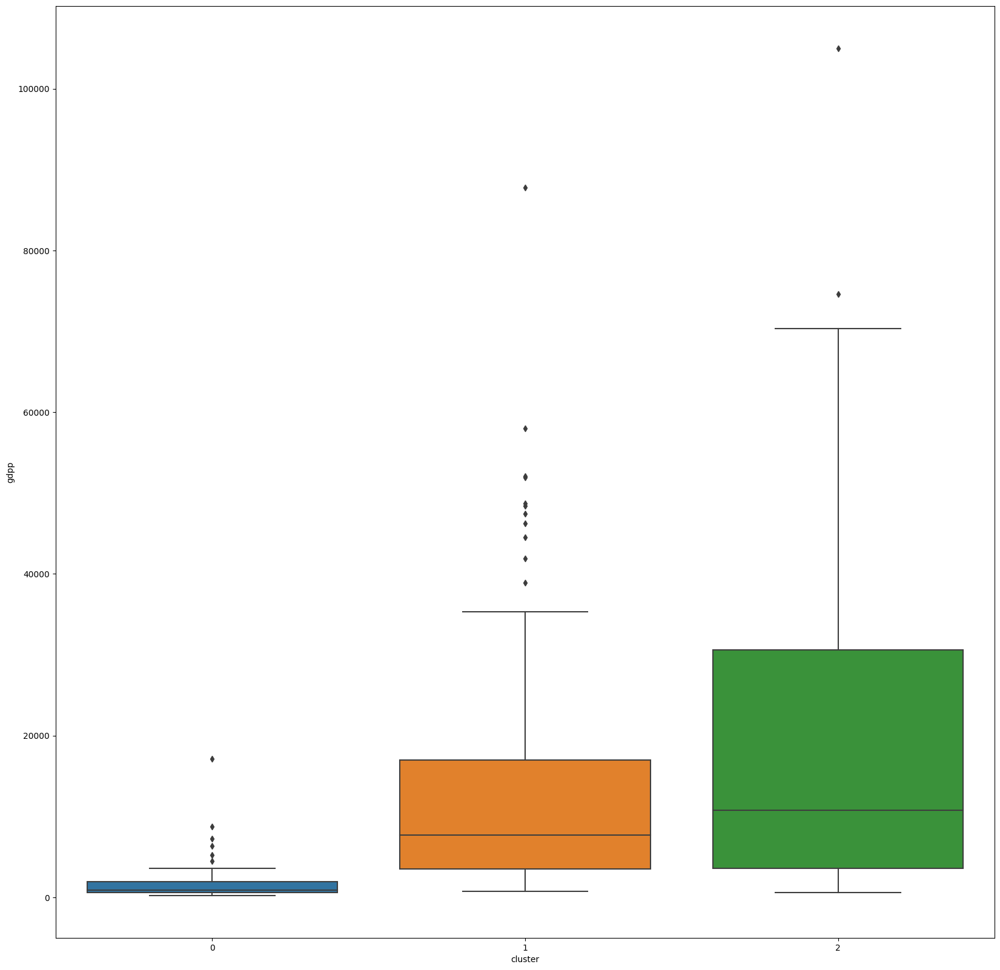

In [86]:
#plotting the clusters with the gdpp and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_lda_kmeans)
plt.show()

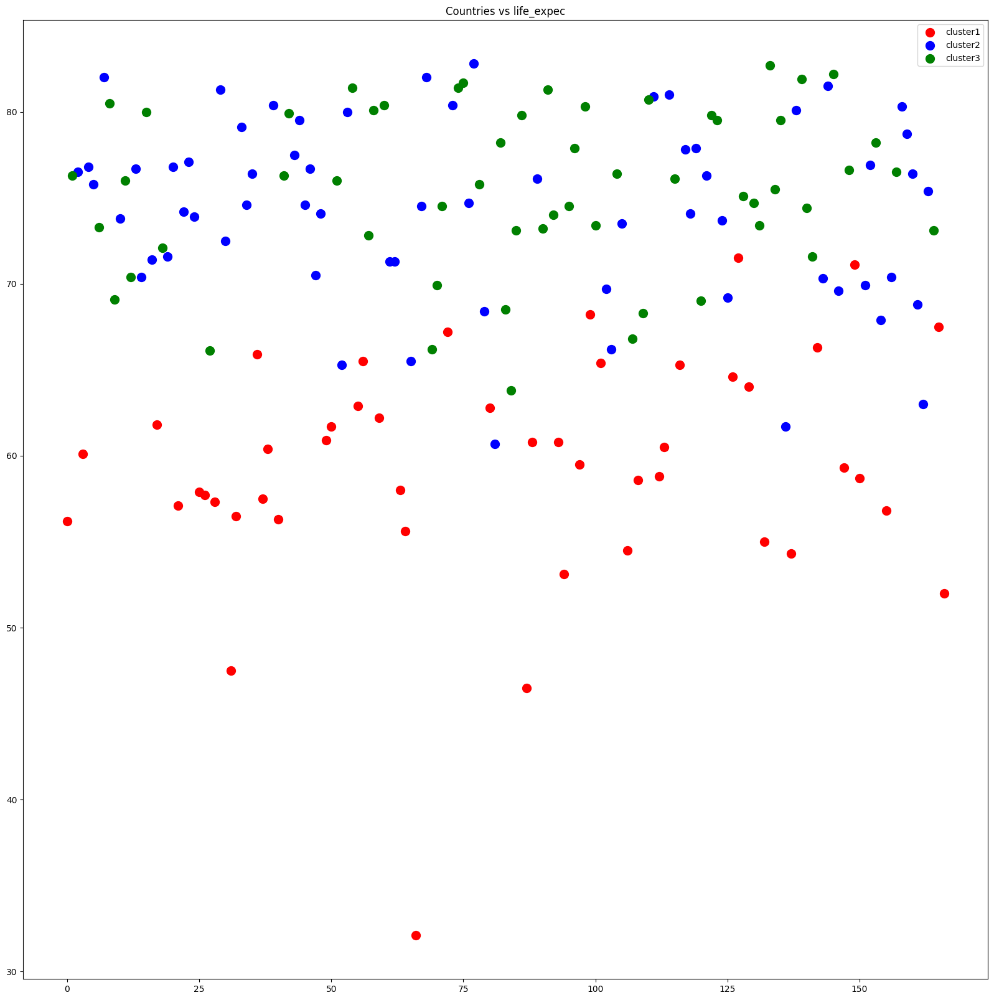

In [87]:
#plotting the clusters with the life_expec and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==0]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==1]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==2]['country'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()

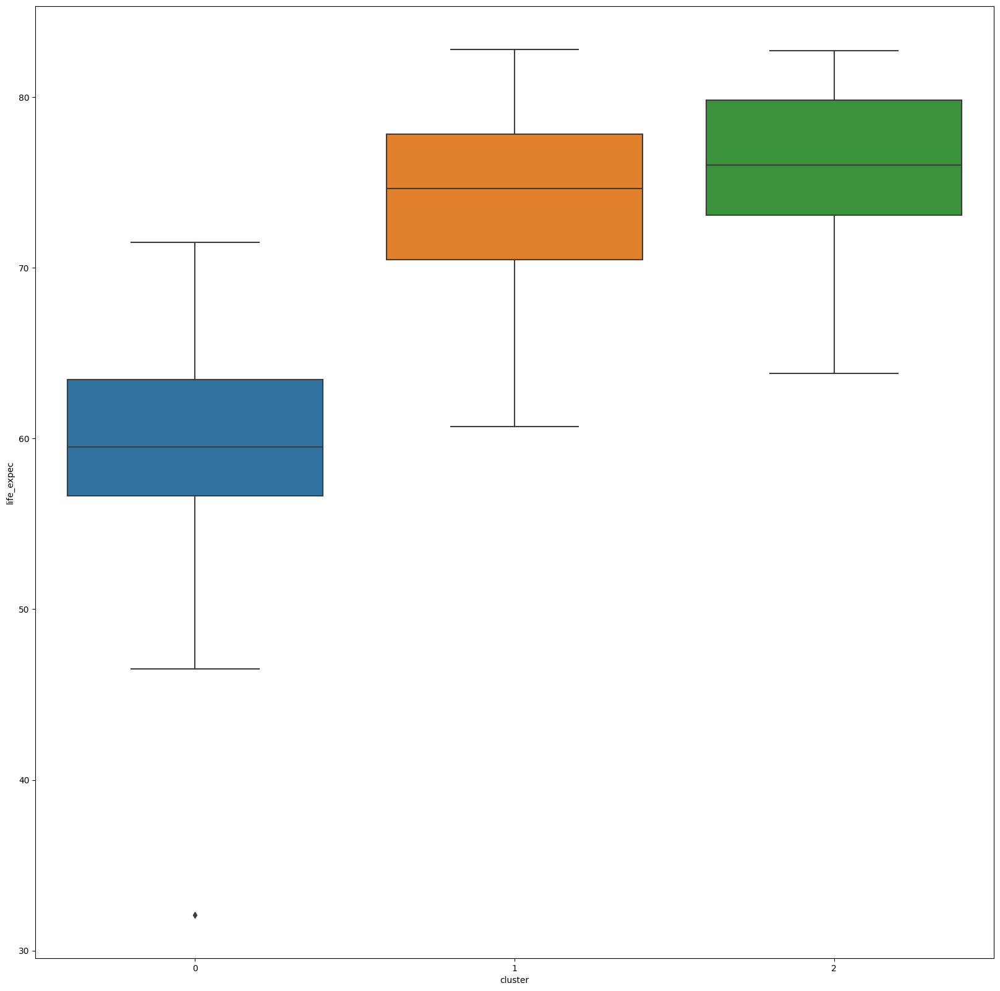

In [88]:
#plotting the clusters with the life_expec and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_lda_kmeans)
plt.show()

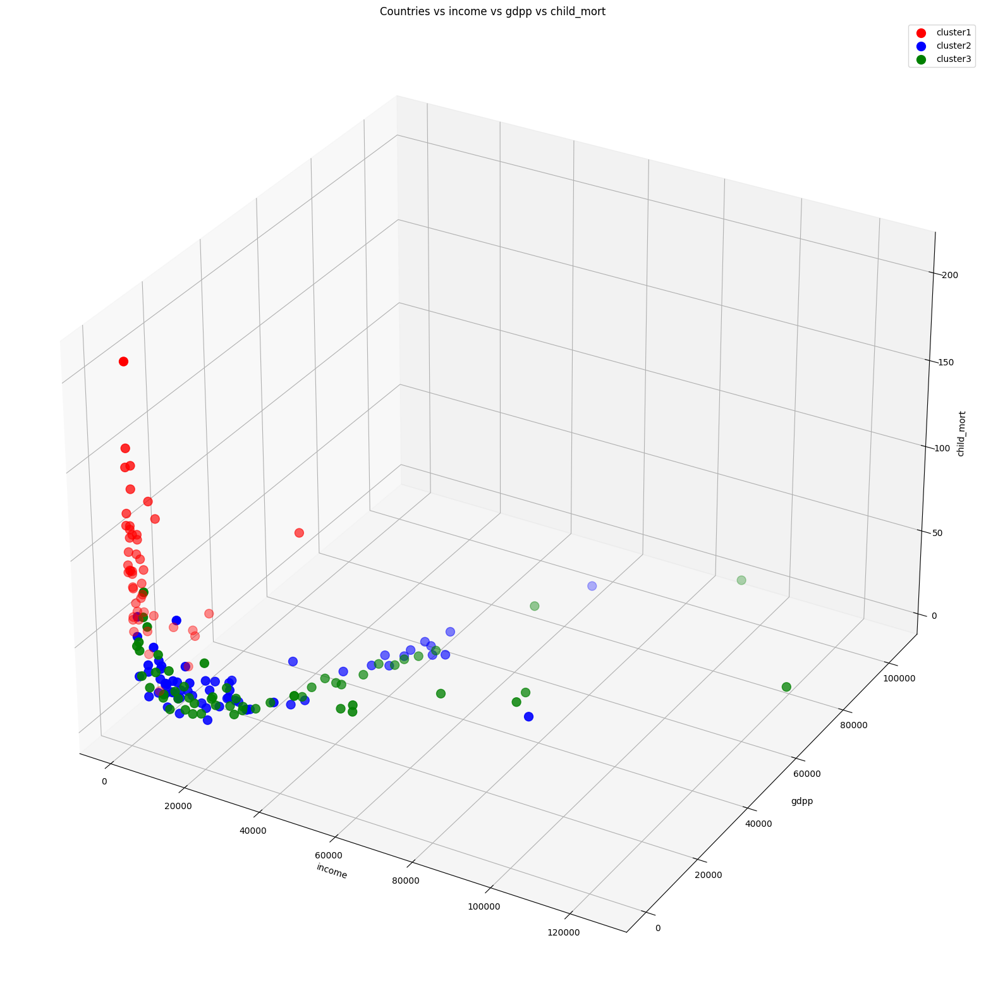

In [89]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==0]['income'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['gdpp'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==1]['income'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['gdpp'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==2]['income'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['gdpp'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

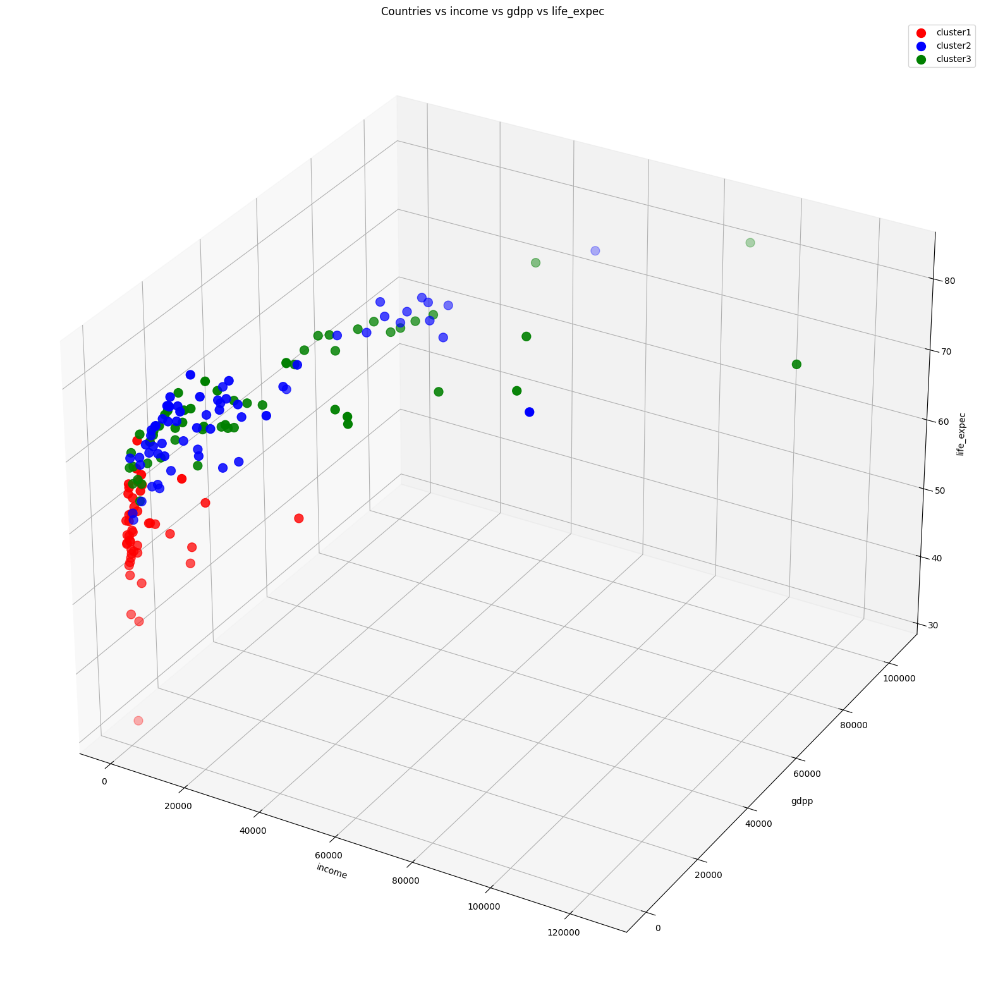

In [90]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==0]['income'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['gdpp'],df_lda_kmeans[df_lda_kmeans['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==1]['income'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['gdpp'],df_lda_kmeans[df_lda_kmeans['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_lda_kmeans[df_lda_kmeans['cluster']==2]['income'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['gdpp'],df_lda_kmeans[df_lda_kmeans['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [91]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_lda_kmeans, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

In [92]:
#preparing the plot_kmeans_data to plot in the world map
plot_kmeans_data = df_lda_kmeans['cluster']
#adding the country names to the plot_kmeans_data
plot_kmeans_data = pd.concat([plot_kmeans_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_kmeans_data['cluster'] = plot_kmeans_data['cluster'].replace({0:'Help Needed',1:'May Need Help',2:'Least Help Needed'})
plot_kmeans_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,Least Help Needed,Albania
2,May Need Help,Algeria
3,Help Needed,Angola
4,May Need Help,Antigua and Barbuda


In [93]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_kmeans_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()



Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" represents the countries which "needed least help"

Countries in color "Green" represents the countries which "may need help"

#**Applying DBSCAN on the LDA implemented dataset**

In [94]:
#implementing the dbscan on the lda data
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.9,min_samples=3)
y_dbscan = dbscan.fit_predict(x_lda)
y_dbscan

array([ 3,  0,  1,  2,  1,  1,  0, -1,  0, -1,  1,  0,  0,  1,  1,  0,  1,
        2,  0,  1,  1,  2,  1, -1,  1,  2,  3,  0,  2,  4,  1,  2,  2,  1,
        1,  1,  2,  2,  2,  1,  1,  0,  0,  1,  4,  1,  1,  1,  1,  2,  2,
        0,  1,  4,  0,  2,  2,  0,  0,  2,  0,  1,  1,  2,  2,  1,  1,  1,
        4,  0,  0,  0,  2,  4,  0,  0,  1,  1,  0,  1,  2, -1,  0,  0,  0,
        0,  0, -1, -1,  1,  0, -1,  0,  2,  2,  0,  0,  2,  0,  2,  0, -1,
        1,  1,  0,  1,  2,  0,  2,  0,  0, -1, -1, -1,  4,  0, -1,  1,  1,
        1,  0,  1,  0,  0,  1,  1,  2,  1,  0,  2,  0,  0,  2,  0,  0,  0,
       -1,  2,  1,  0,  0,  0,  1,  1,  4, -1, -1,  2,  0,  1,  2,  1,  1,
        0,  1,  3,  1,  0,  4, -1,  1,  1,  1,  1,  0,  2,  2],
      dtype=int64)

In [95]:
print(np.unique(y_dbscan))

[-1  0  1  2  3  4]


##Visualization of the dataset after applying DBSCAN 

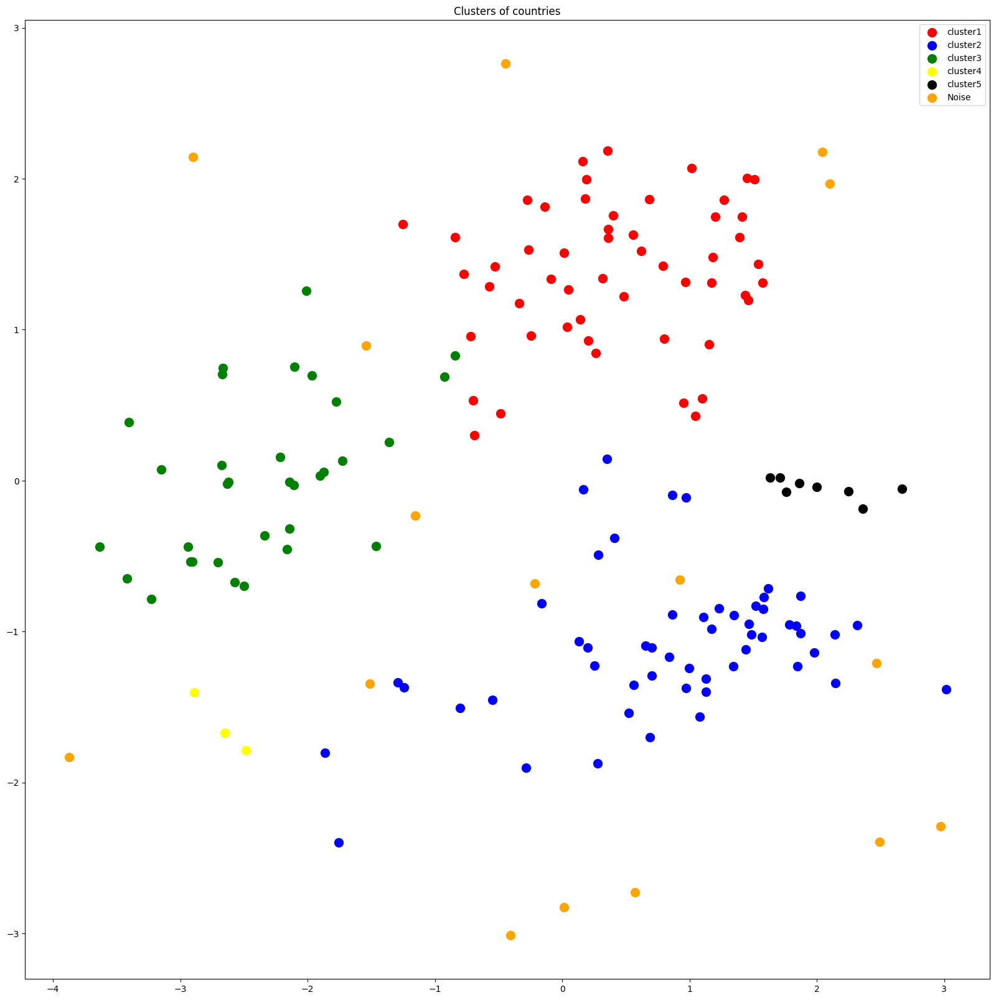

In [96]:
#plotting all clusters along with the centroids
plt.figure(figsize=(20,20))
plt.scatter(x_lda[y_dbscan==0]['LD1'],x_lda[y_dbscan==0]['LD2'],s=100,c='red',label='cluster1')
plt.scatter(x_lda[y_dbscan==1]['LD1'],x_lda[y_dbscan==1]['LD2'],s=100,c='blue',label='cluster2')
plt.scatter(x_lda[y_dbscan==2]['LD1'],x_lda[y_dbscan==2]['LD2'],s=100,c='green',label='cluster3')
plt.scatter(x_lda[y_dbscan==3]['LD1'],x_lda[y_dbscan==3]['LD2'],s=100,c='yellow',label='cluster4')
plt.scatter(x_lda[y_dbscan==4]['LD1'],x_lda[y_dbscan==4]['LD2'],s=100,c='black',label='cluster5')
plt.scatter(x_lda[y_dbscan==-1]['LD1'],x_lda[y_dbscan==-1]['LD2'],s=100,c='orange',label='Noise')
plt.title('Clusters of countries')
plt.legend()
plt.show()


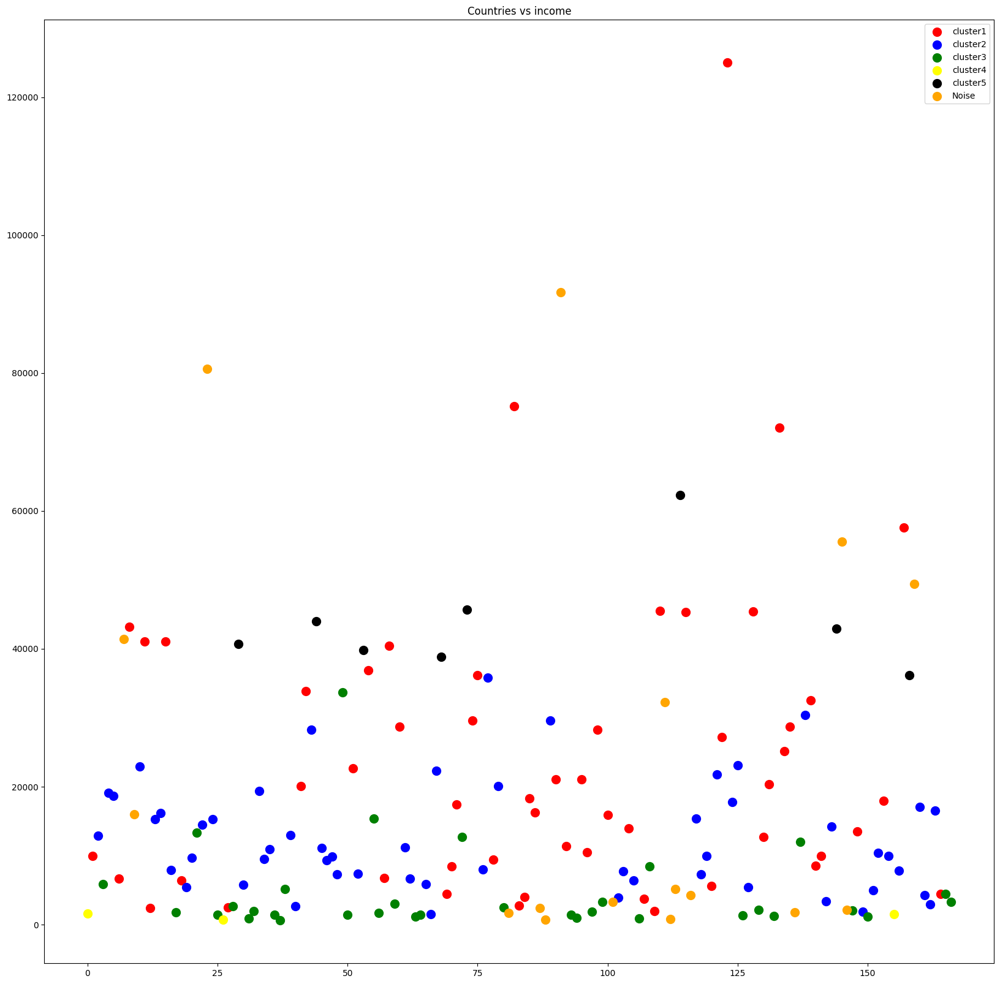

In [97]:
#plotting the clusters with the income and country names
df_lda_dbscan['cluster'] = y_dbscan
plt.figure(figsize=(20,20))
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==0]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==2]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['income'],s=100,c='green',label='cluster3')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==3]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==3]['income'],s=100,c='yellow',label='cluster4')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==4]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==4]['income'],s=100,c='black',label='cluster5')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==-1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==-1]['income'],s=100,c='orange',label='Noise')
plt.title('Countries vs income')
plt.legend()
plt.show()

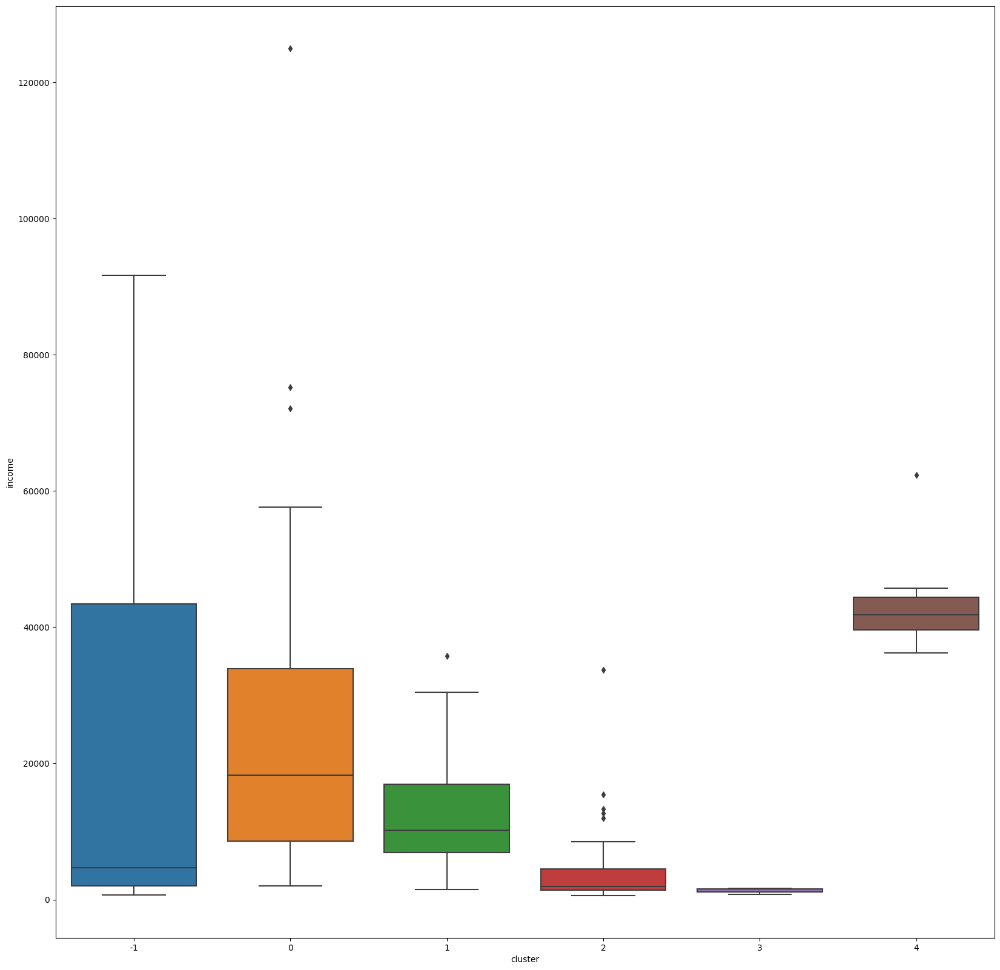

In [98]:
#plotting the clusters with the income and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_lda_dbscan)
plt.show()

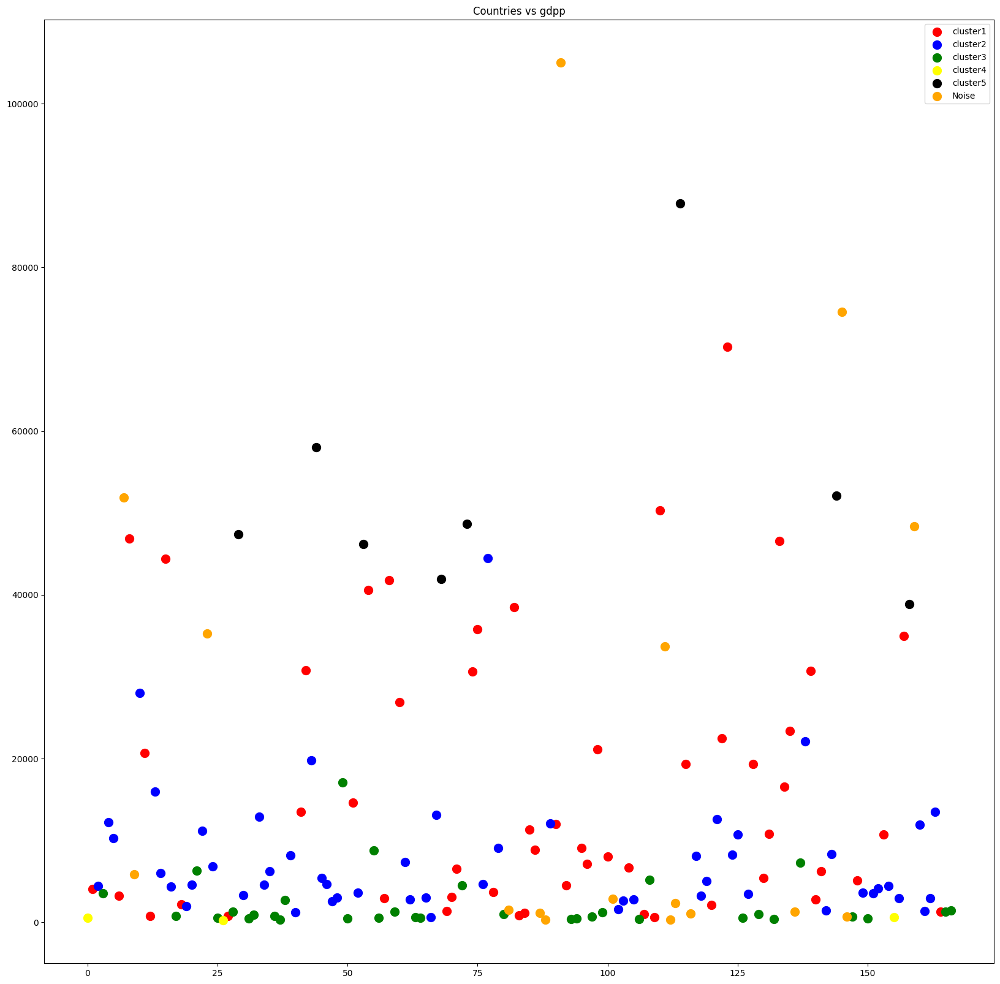

In [99]:
#plotting the clusters with the gdpp and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==0]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==2]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['gdpp'],s=100,c='green',label='cluster3')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==3]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==3]['gdpp'],s=100,c='yellow',label='cluster4')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==4]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==4]['gdpp'],s=100,c='black',label='cluster5')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==-1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==-1]['gdpp'],s=100,c='orange',label='Noise')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

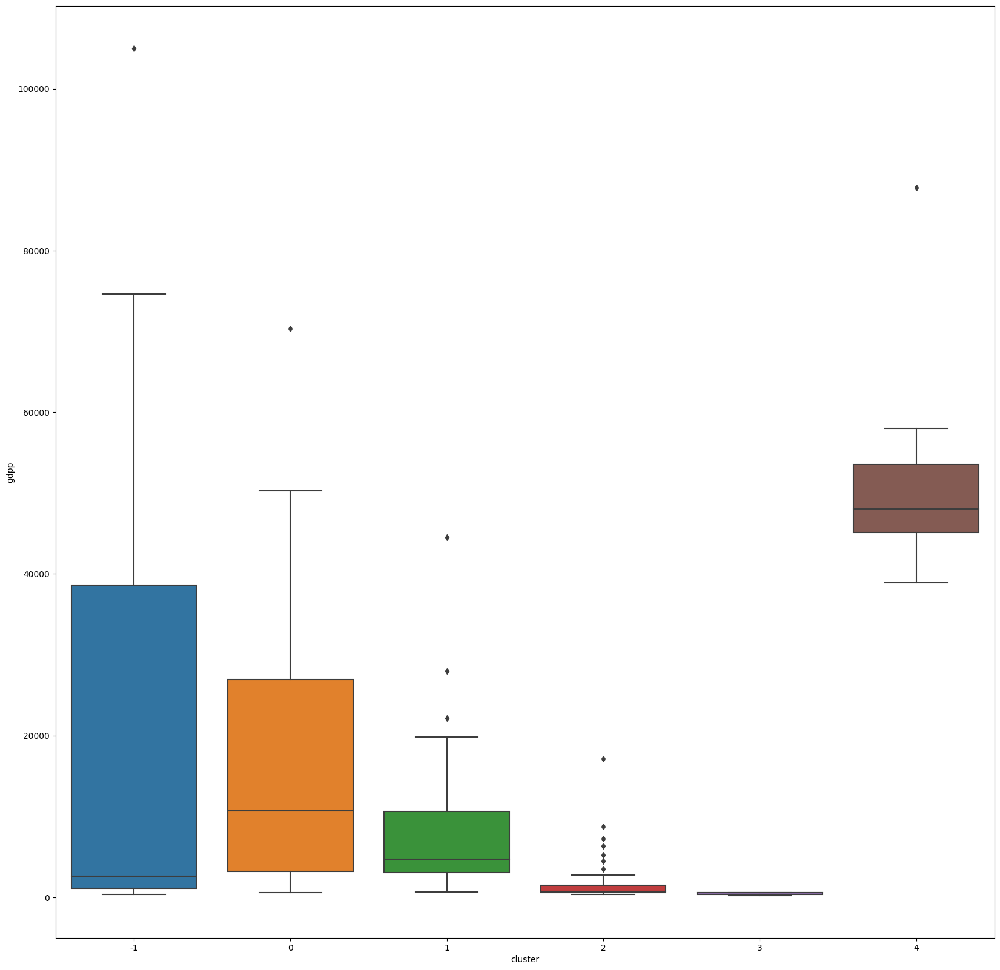

In [100]:
#plotting the clusters with the gdpp and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_lda_dbscan)
plt.show()

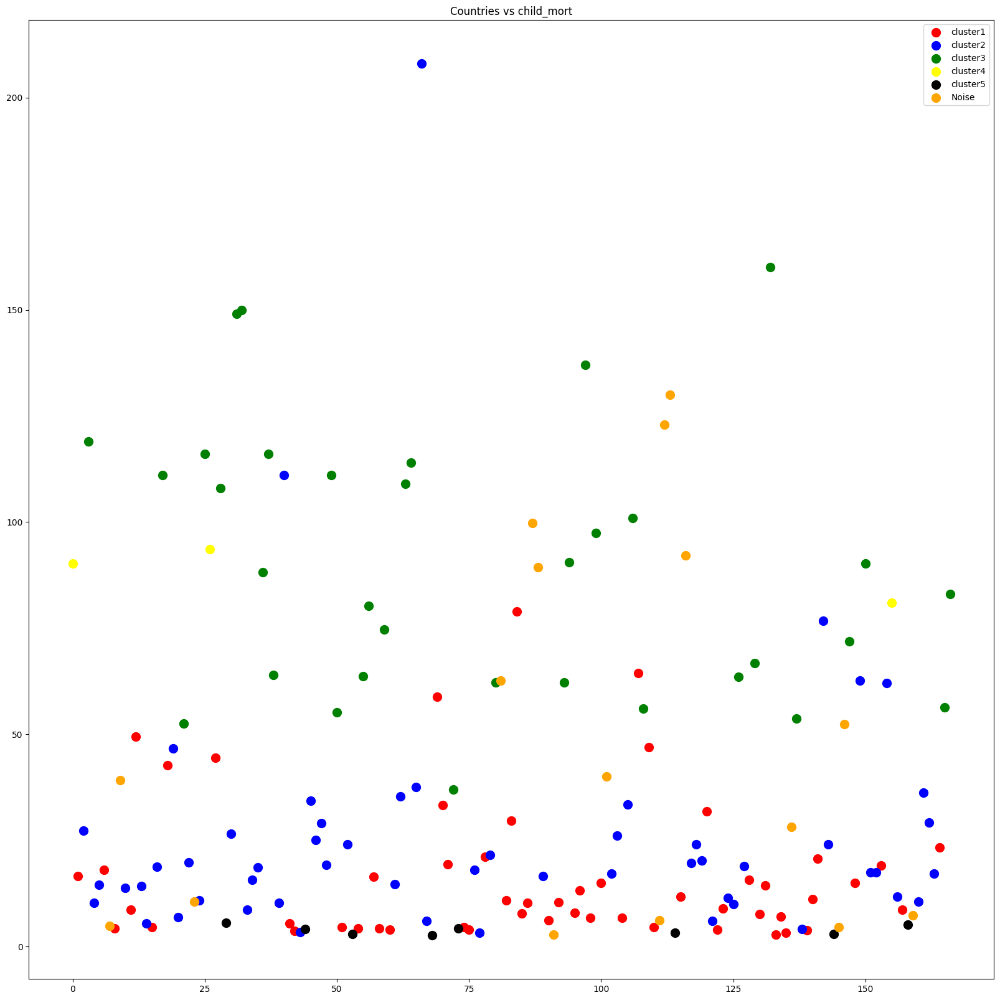

In [101]:
#plotting the clusters with the child_mort and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==0]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==2]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==3]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==3]['child_mort'],s=100,c='yellow',label='cluster4')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==4]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==4]['child_mort'],s=100,c='black',label='cluster5')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==-1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==-1]['child_mort'],s=100,c='orange',label='Noise')
plt.title('Countries vs child_mort')
plt.legend()
plt.show()

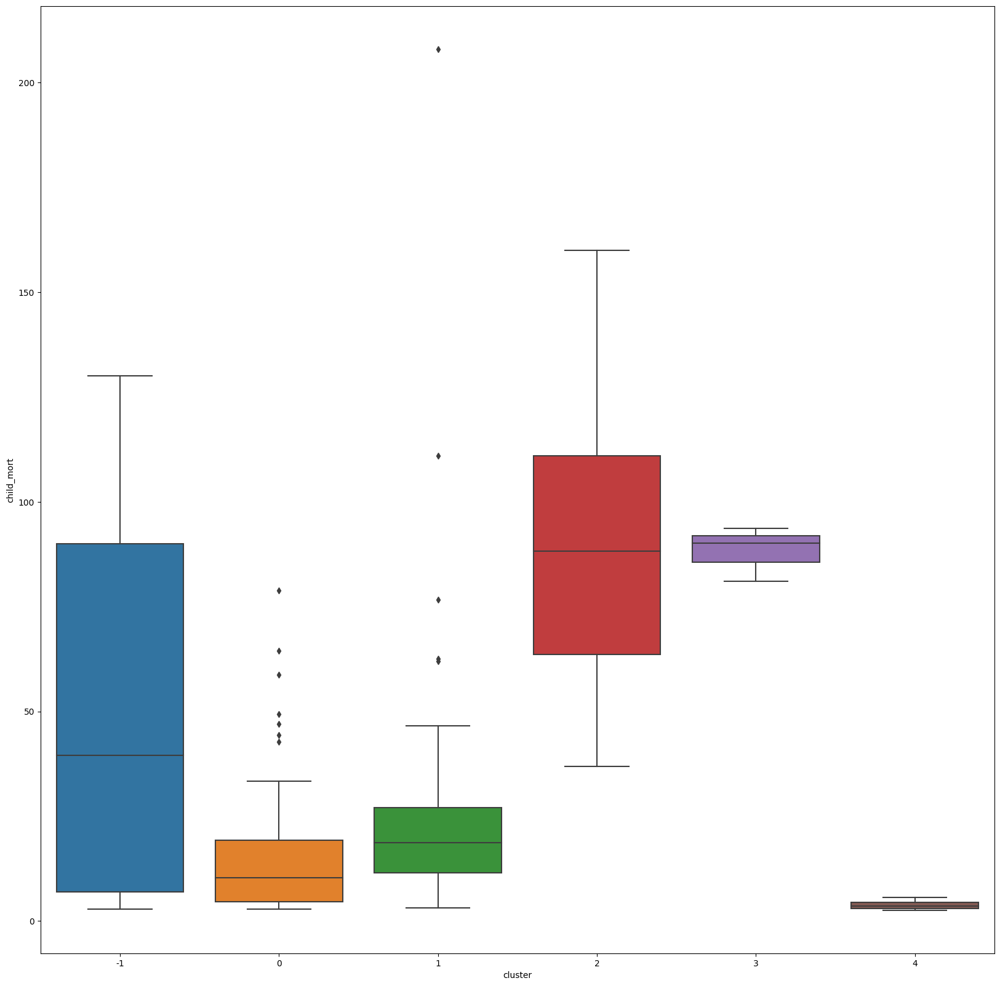

In [102]:
#plotting the clusters with the child_mort and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='child_mort',data=df_lda_dbscan)
plt.show()

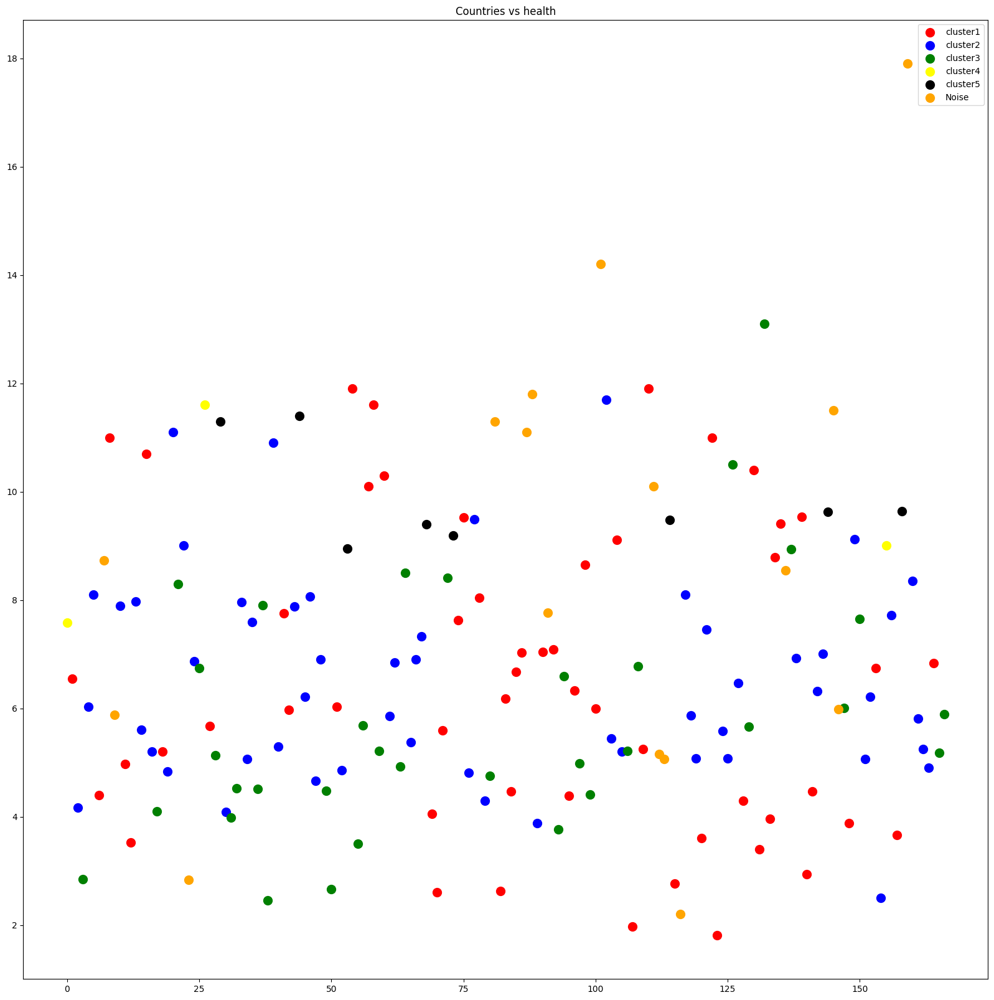

In [103]:
#plotting the clusters with the health and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==0]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['health'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['health'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==2]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['health'],s=100,c='green',label='cluster3')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==3]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==3]['health'],s=100,c='yellow',label='cluster4')
plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==4]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==4]['health'],s=100,c='black',label='cluster5')

plt.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==-1]['country'],df_lda_dbscan[df_lda_dbscan['cluster']==-1]['health'],s=100,c='orange',label='Noise')
plt.title('Countries vs health')
plt.legend()
plt.show()

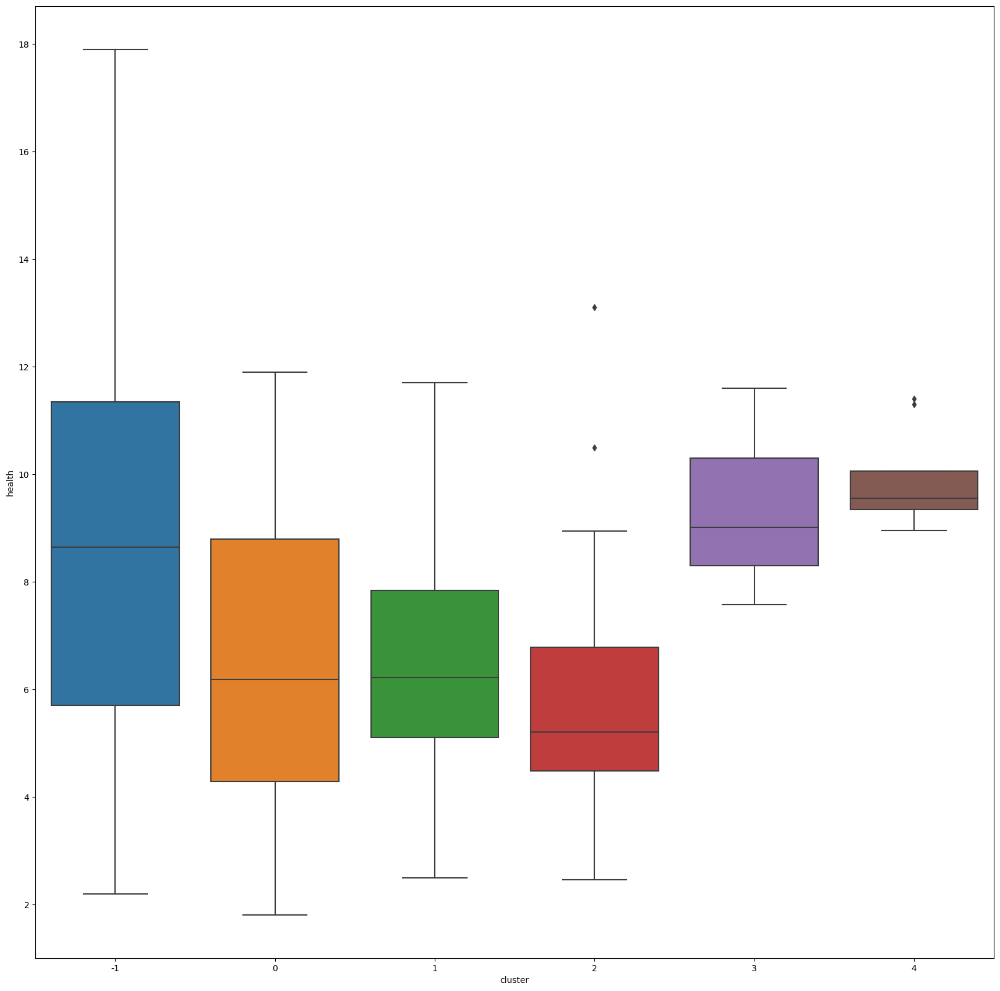

In [104]:
#plotting the clusters with the health and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='health',data=df_lda_dbscan)
plt.show()

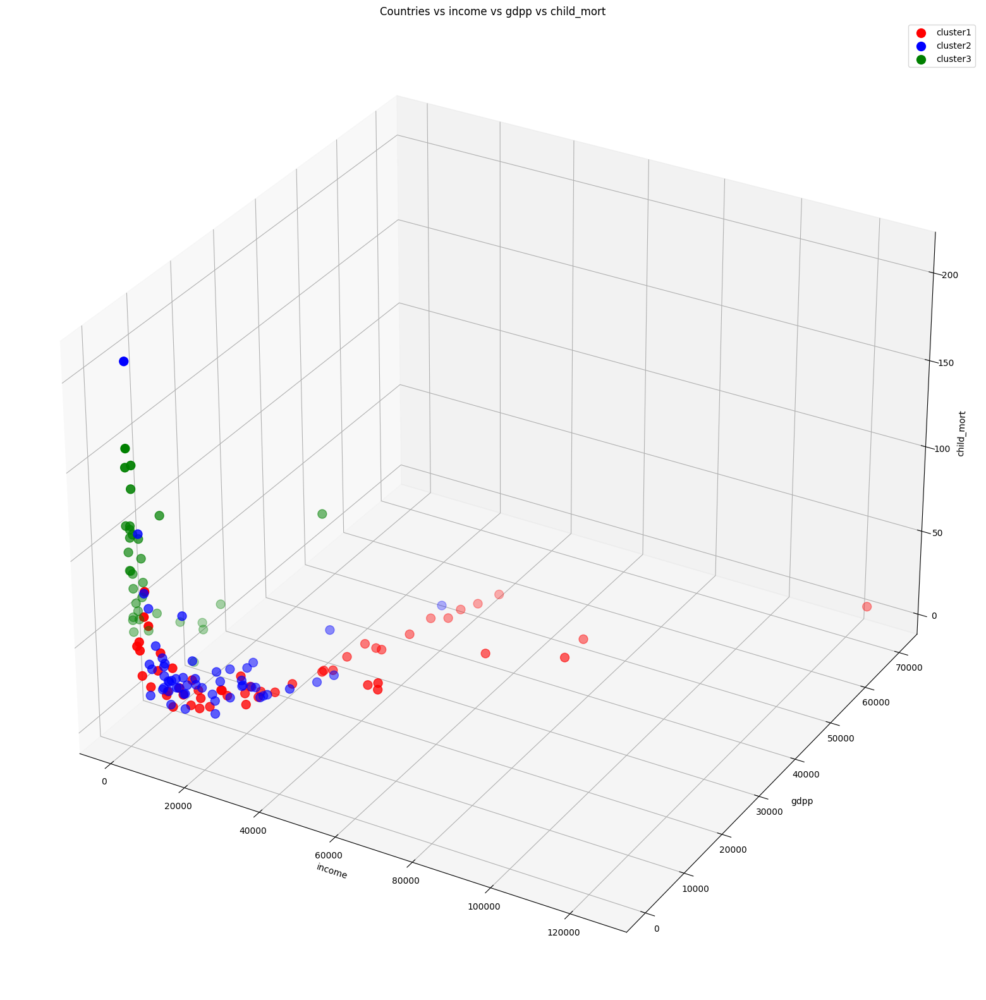

In [105]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==0]['income'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['gdpp'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==1]['income'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['gdpp'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==2]['income'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['gdpp'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

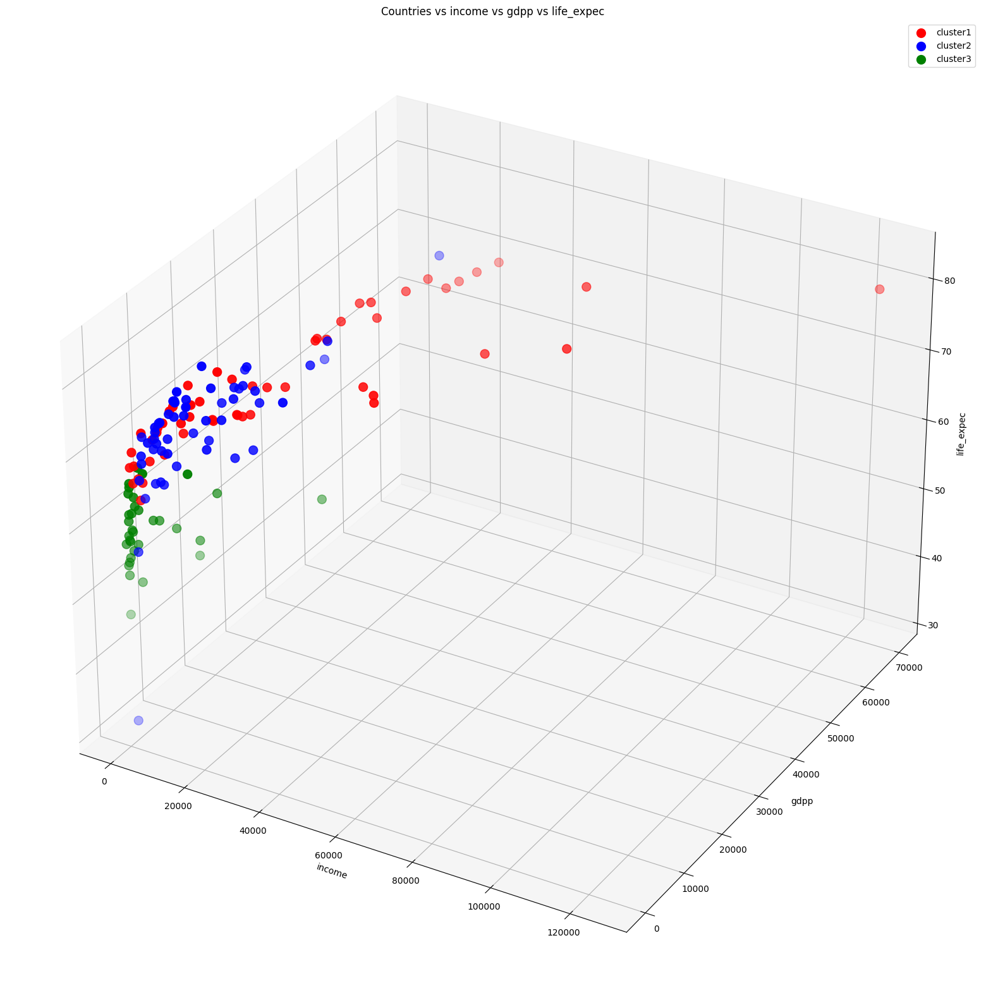

In [106]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==0]['income'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['gdpp'],df_lda_dbscan[df_lda_dbscan['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==1]['income'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['gdpp'],df_lda_dbscan[df_lda_dbscan['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_lda_dbscan[df_lda_dbscan['cluster']==2]['income'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['gdpp'],df_lda_dbscan[df_lda_dbscan['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [107]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_lda_dbscan, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

In [108]:
#preparing the data for world map plot
plot_dbscan_data = df_lda_dbscan['cluster']
#adding the country names to the plot_dbscan_data
plot_dbscan_data = pd.concat([plot_dbscan_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_dbscan_data['cluster'] = plot_dbscan_data['cluster'].replace({1:'May Need Help',0:'May Need Help',2:'Help Needed',3:'Help Needed',4:'Least Help Needed',-1:'Noise'})
plot_dbscan_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,May Need Help,Albania
2,May Need Help,Algeria
3,Help Needed,Angola
4,May Need Help,Antigua and Barbuda


In [109]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_dbscan_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green','yellow'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" represents the countries which "may need help"

Countries in color "Yellow" represents the countries which "needed least help"

Countries in color "Green" corresponds to countries which are classified as "noise" by DBSCAN


#**Applying Hierarchial clustering on the LDA implemented dataset**

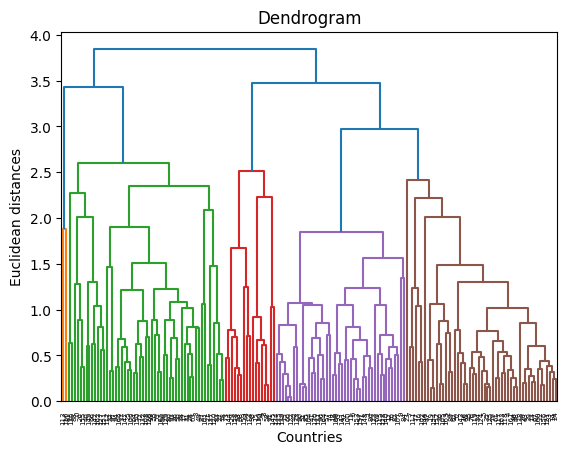

In [110]:
#implementing the hierarchical clustering on the lda data
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(x_lda,method='average'))
plt.title('Dendrogram')
plt.xlabel('Countries')
plt.ylabel('Euclidean distances')
plt.show()

In [111]:
#fitting the hierarchical clustering on the lda data
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=3,affinity='euclidean',linkage='average')
y_hc = hc.fit_predict(x_lda)
y_hc

array([0, 1, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 2, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       2, 1, 1, 1, 1, 0, 0, 1, 1, 2, 2, 0, 0, 1, 2, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 2, 1, 1, 1, 0, 2, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0,
       0, 1, 1, 2, 1, 0, 0, 1, 1, 0, 2, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       2, 1, 0, 0, 2, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 2, 2, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 1, 1, 2, 2, 1, 1, 0, 1, 1, 0, 0], dtype=int64)

##Visualization of the dataset after Hierarchial Clustering

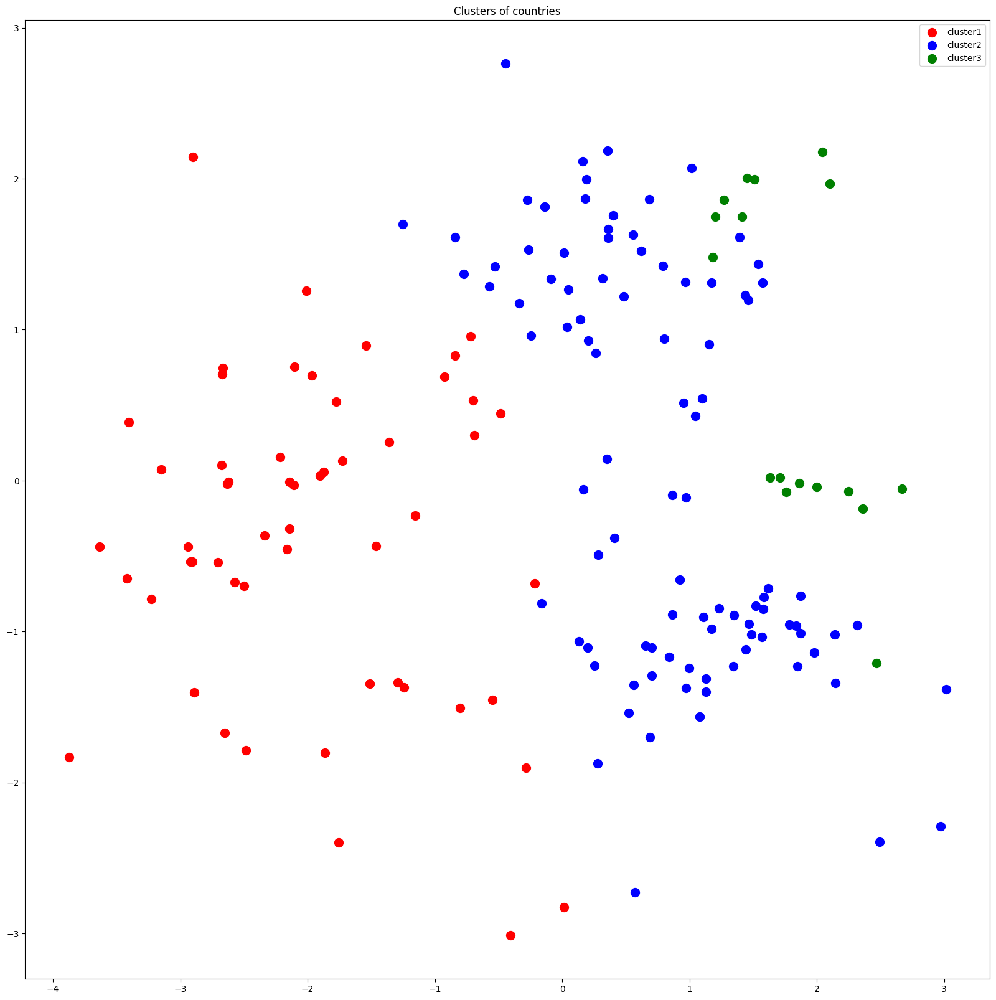

In [112]:
#plotting the clusters with the lda1 and lda2
plt.figure(figsize=(20,20))
plt.scatter(x_lda[y_hc==0]['LD1'],x_lda[y_hc==0]['LD2'],s=100,c='red',label='cluster1')
plt.scatter(x_lda[y_hc==1]['LD1'],x_lda[y_hc==1]['LD2'],s=100,c='blue',label='cluster2')
plt.scatter(x_lda[y_hc==2]['LD1'],x_lda[y_hc==2]['LD2'],s=100,c='green',label='cluster3')
plt.title('Clusters of countries')
plt.legend()
plt.show()

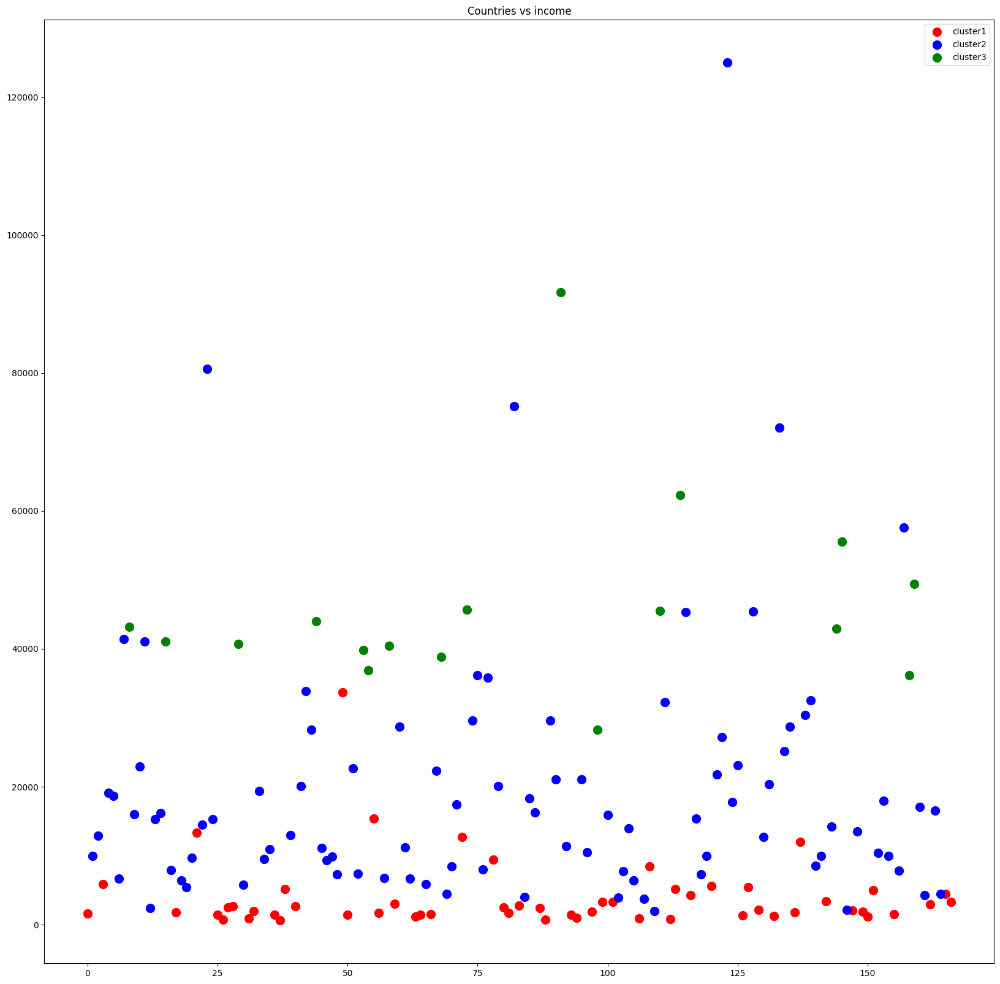

In [113]:
#plotting the clusters with the income and country names
df_lda_hierarchal['cluster'] = y_hc
plt.figure(figsize=(20,20))
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['income'],s=100,c='green',label='cluster3')
plt.title('Countries vs income')
plt.legend()
plt.show()

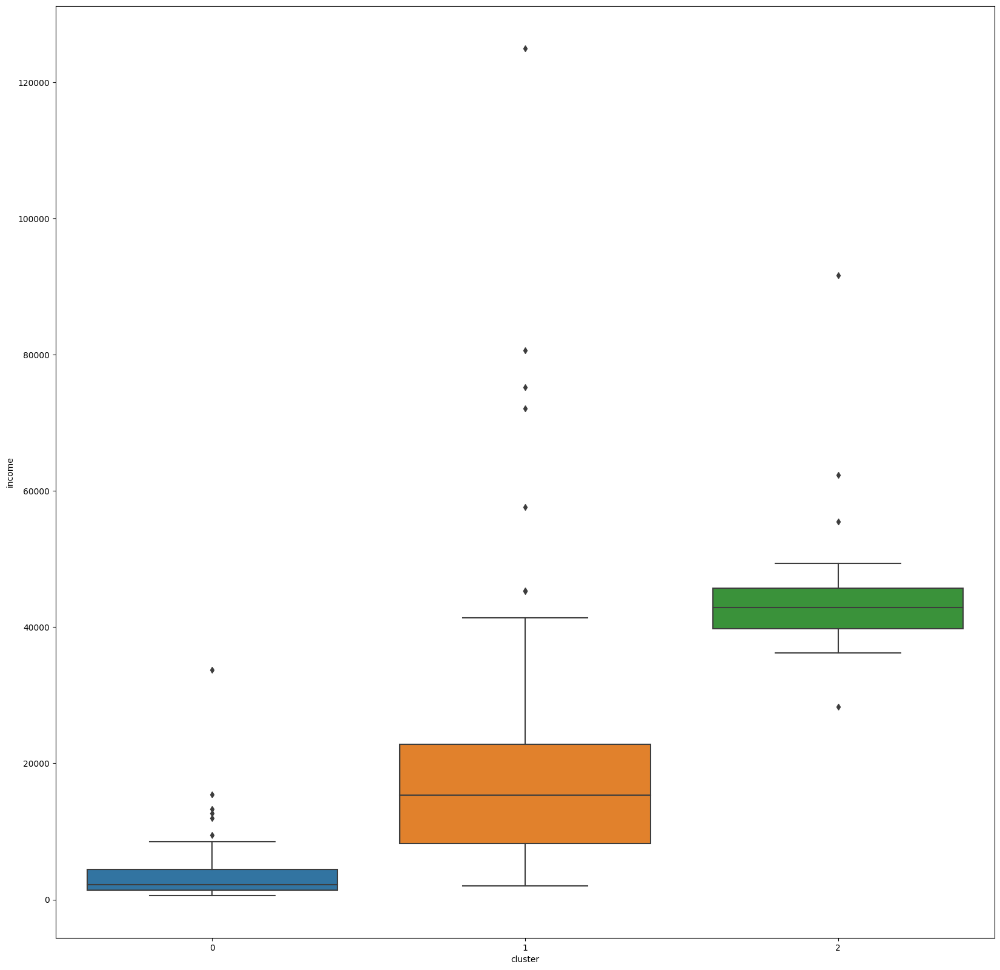

In [114]:
#plotting the clusters with the income and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_lda_hierarchal)
plt.show()

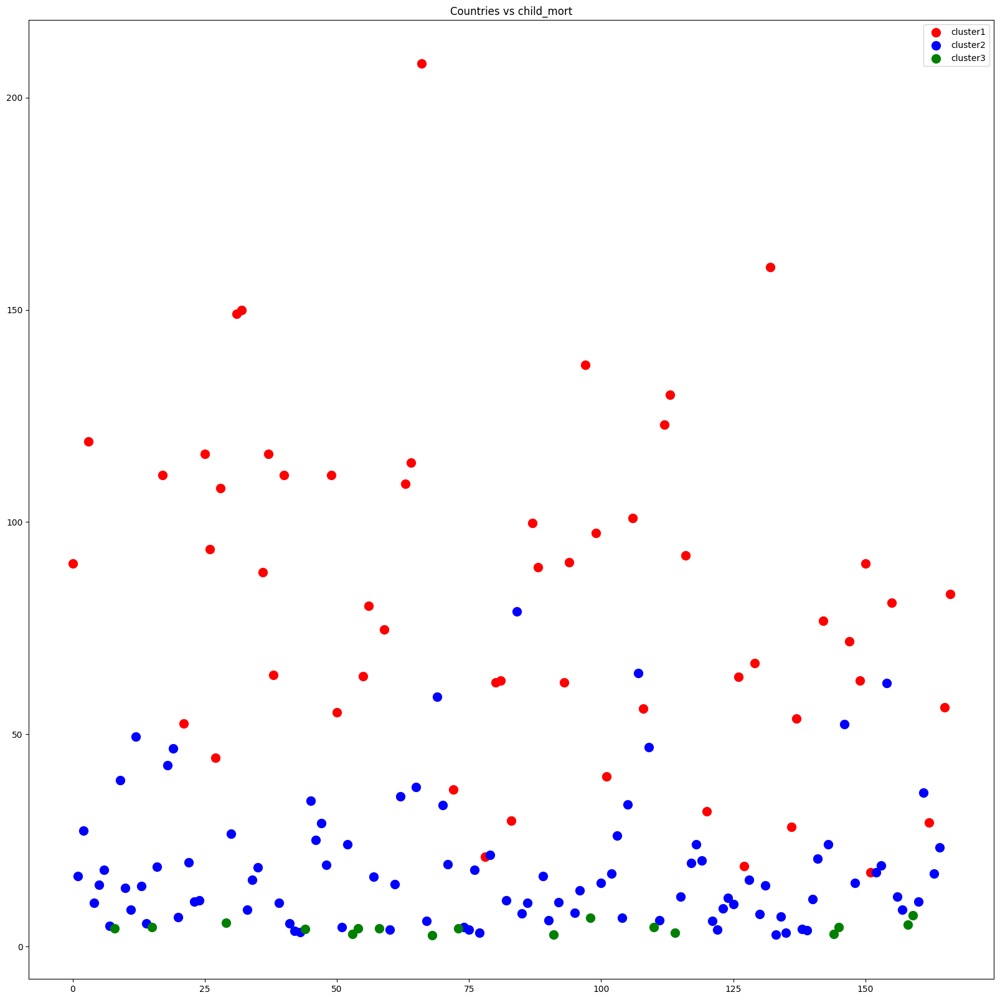

In [115]:
#plotting the clusters with the child_mort and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
plt.title('Countries vs child_mort')
plt.legend()
plt.show()


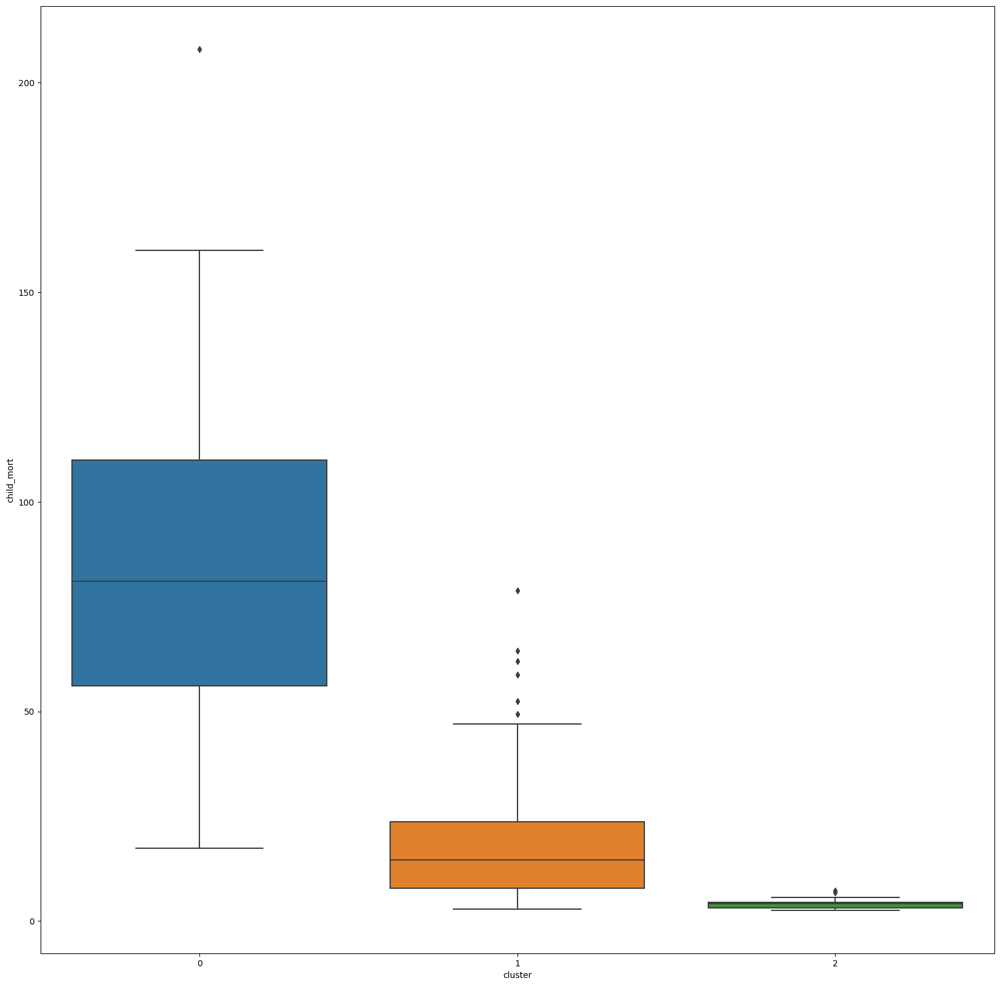

In [116]:
#plotting the clusters with the child_mort and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='child_mort',data=df_lda_hierarchal)
plt.show()

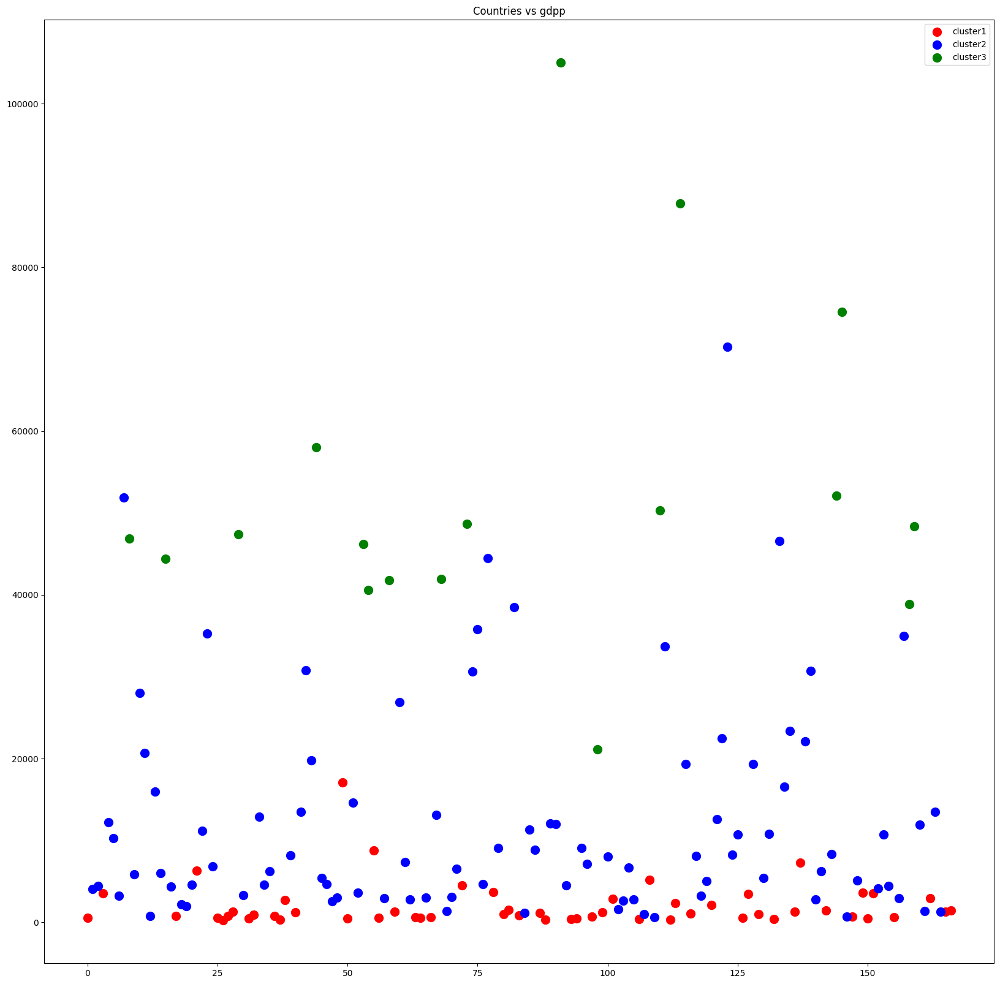

In [117]:
#plotting the clusters with the gdpp and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['gdpp'],s=100,c='green',label='cluster3')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

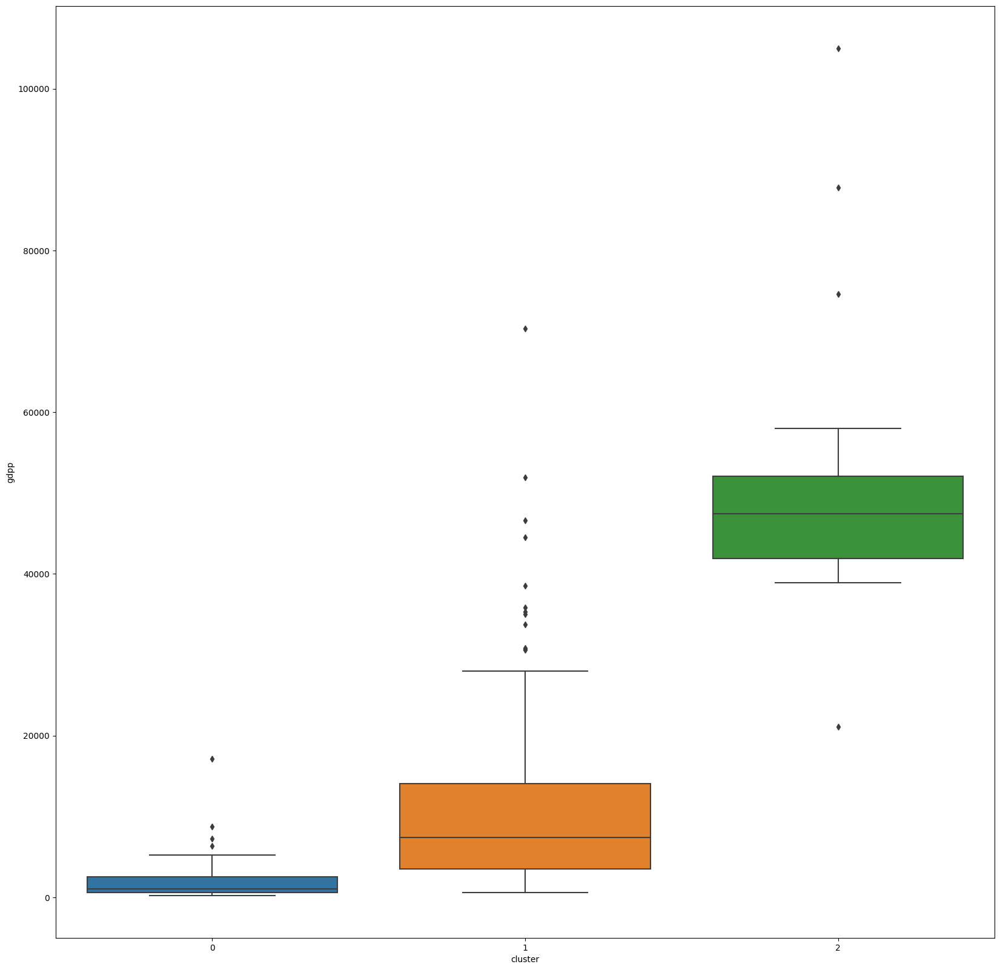

In [118]:
#plotting the clusters with the gdpp and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_lda_hierarchal)
plt.show()

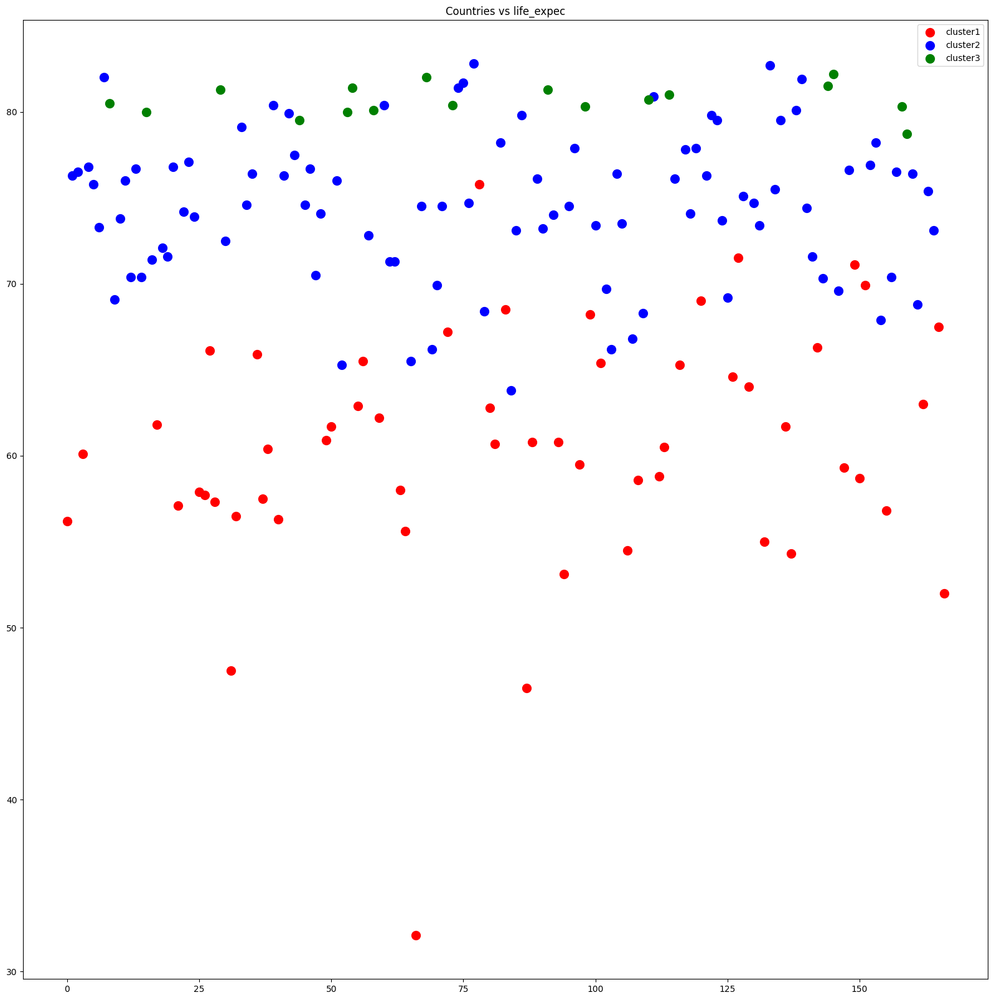

In [119]:
#plotting the clusters with the life_expec and country names
plt.figure(figsize=(20,20))
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
plt.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['country'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()

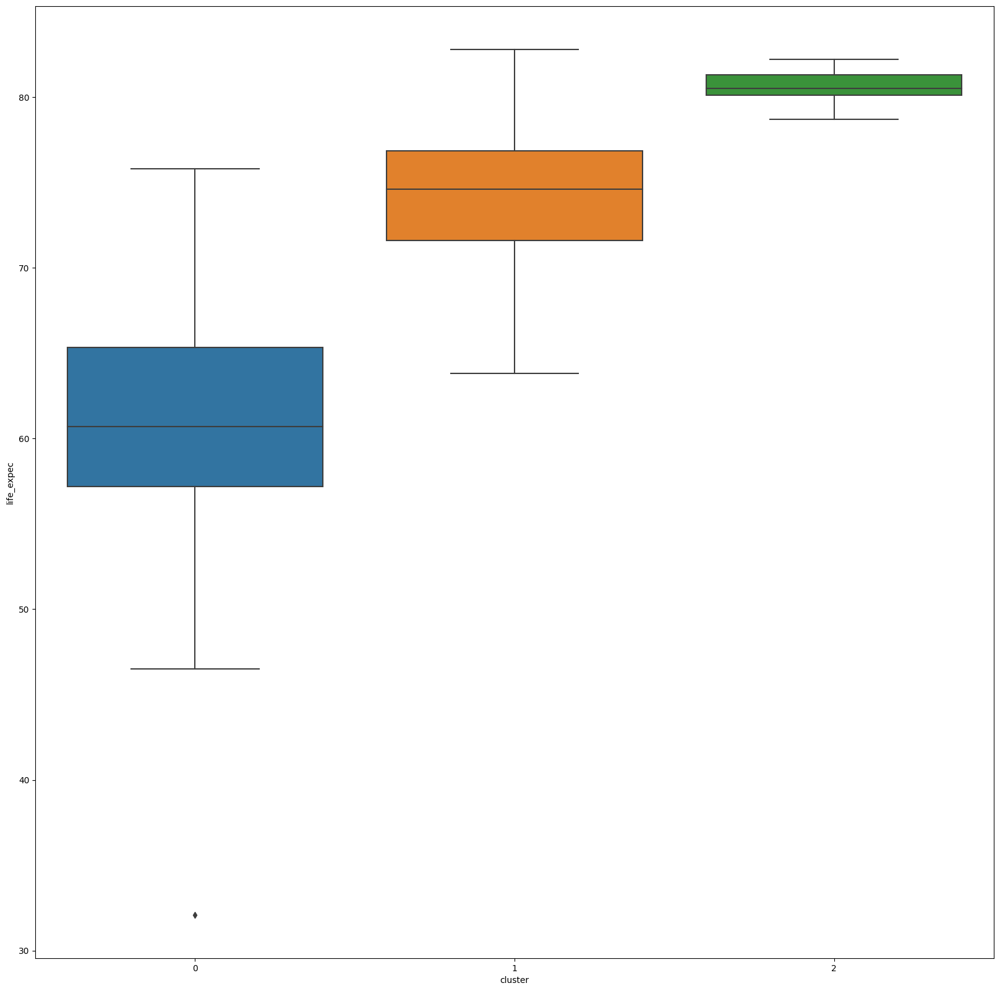

In [120]:
#plotting the clusters with the life_expec and country names using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_lda_hierarchal)
plt.show()

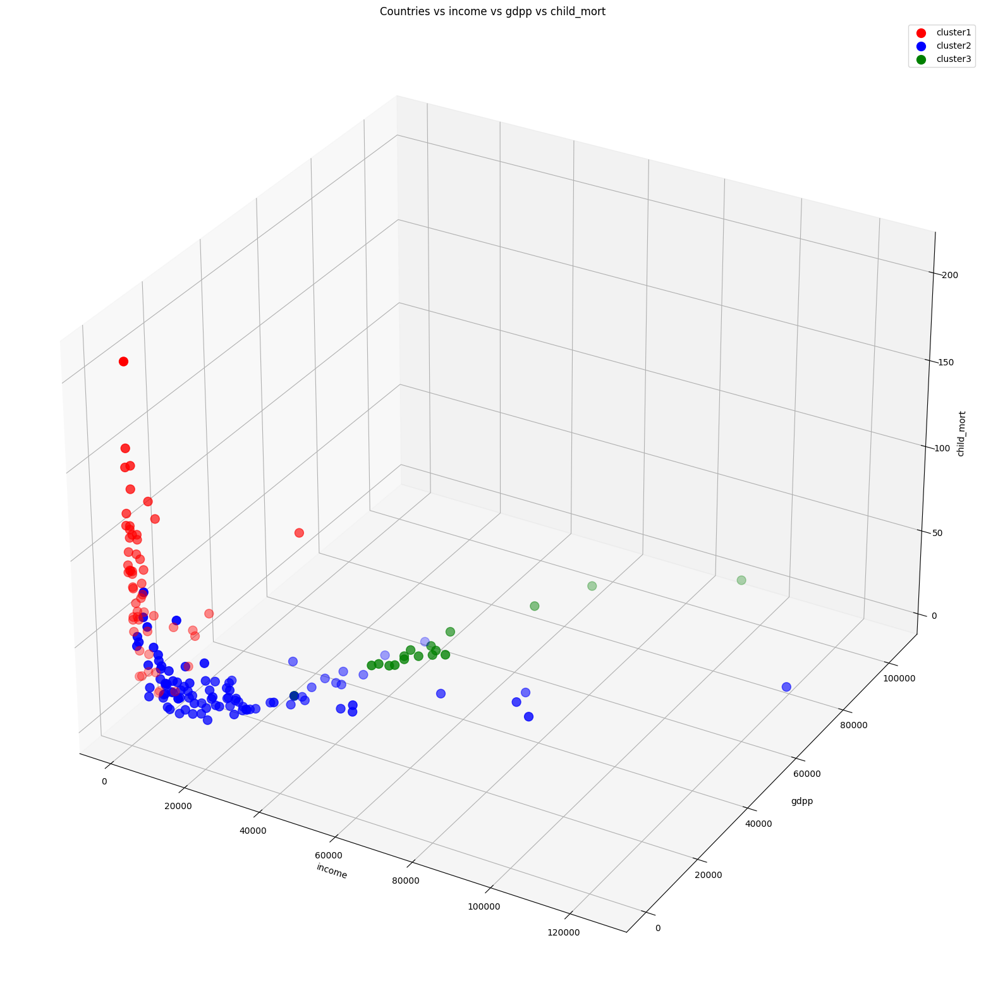

In [121]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['income'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['gdpp'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['income'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['gdpp'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['income'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['gdpp'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

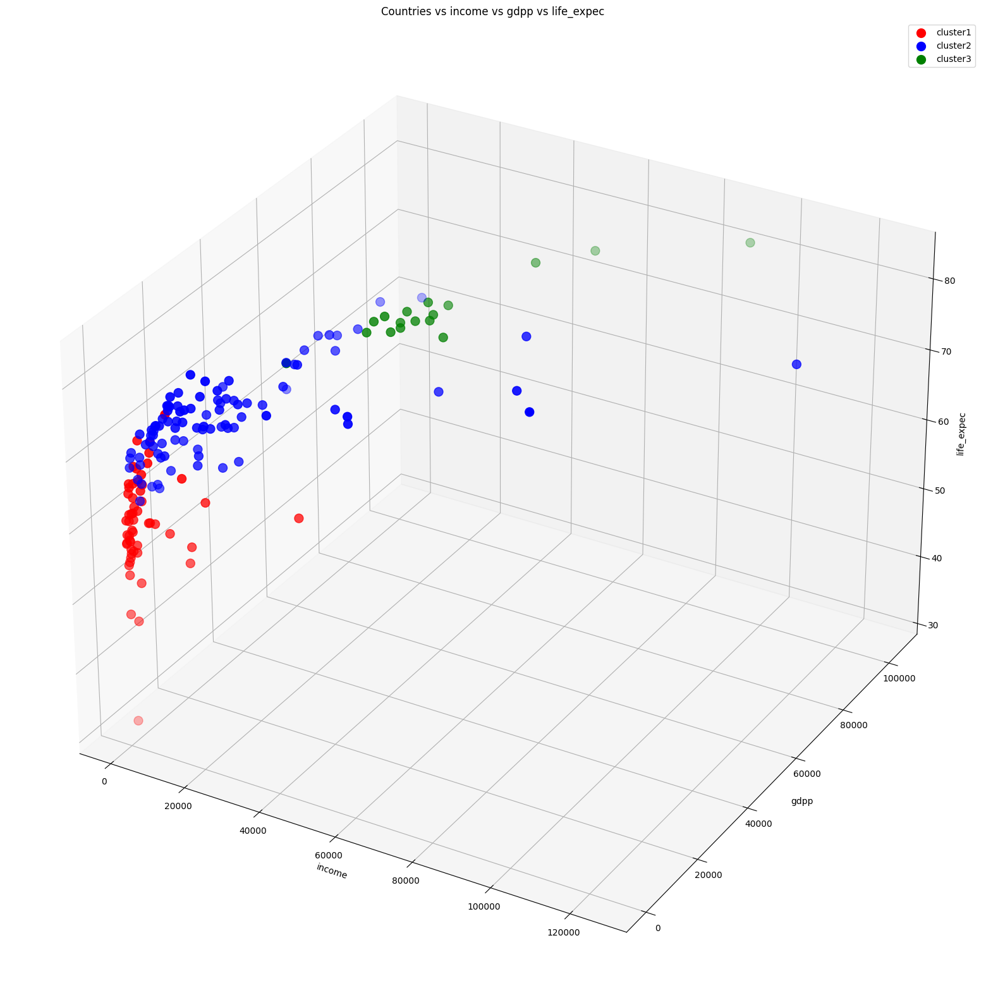

In [122]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['income'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['gdpp'],df_lda_hierarchal[df_lda_hierarchal['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['income'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['gdpp'],df_lda_hierarchal[df_lda_hierarchal['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['income'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['gdpp'],df_lda_hierarchal[df_lda_hierarchal['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [123]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_lda_hierarchal, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

In [124]:
#preparing the plot_kmeans_data to plot in the world map
plot_hierarchal_data = df_lda_hierarchal['cluster']
#adding the country names to the plot_kmeans_data
plot_hierarchal_data = pd.concat([plot_hierarchal_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_hierarchal_data['cluster'] = plot_hierarchal_data['cluster'].replace({0:'Help Needed',1:'May Need Help',2:'Least Help Needed'})
plot_kmeans_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,Least Help Needed,Albania
2,May Need Help,Algeria
3,Help Needed,Angola
4,May Need Help,Antigua and Barbuda


In [125]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_hierarchal_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" represents the countries which "may need help"

Countries in color "Green" represents the countries which "needed least help"

#**ICA and applying K-Means on the data**

In [126]:
#implementing the ica on the data
from sklearn.decomposition import FastICA
ica = FastICA(n_components=3)
x_ica = ica.fit_transform(df_ica_kmeans)
x_ica = pd.DataFrame(x_ica)
x_ica.columns = ['IC1','IC2','IC3']
x_ica.head()

,IC1,IC2,IC3
0,-0.047866,0.137627,-0.034106
1,-0.001071,0.125520,-0.039348
2,0.021191,0.126636,-0.047879
3,-0.030498,0.134375,-0.028275
4,0.025704,0.120413,-0.013940


##Visualization of dataset and clusters after applying ICA on the data

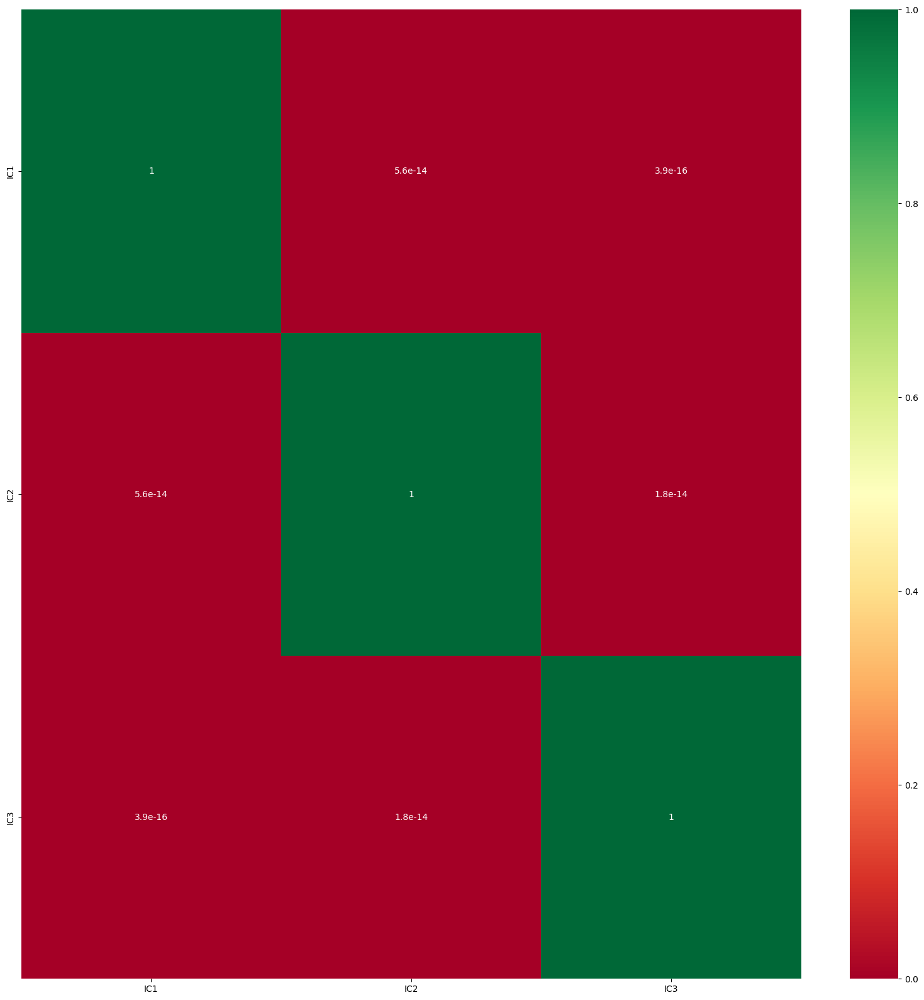

In [127]:
#plotting correlation between the independent variables
plt.figure(figsize=(20,20))
sns.heatmap(x_ica.corr(),annot=True,cmap='RdYlGn')
plt.show()

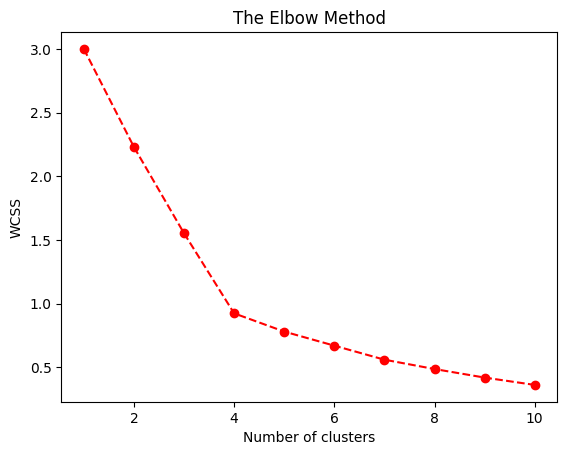

In [128]:
#finding the optimal number of clusters using the elbow method
from sklearn.cluster import KMeans
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(x_ica)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss,marker='o',linestyle='--',color='red')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


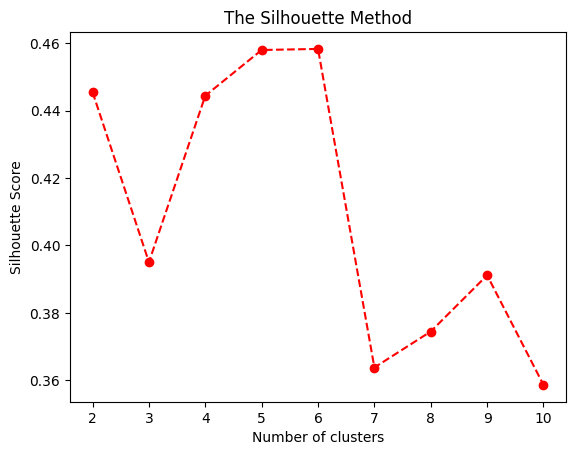

In [129]:
#finding the optimal number of clusters using the silhouette score
from sklearn.metrics import silhouette_score
silhouette_scores = []
for n_cluster in range(2,11):
    silhouette_scores.append(silhouette_score(x_ica, KMeans(n_clusters=n_cluster).fit_predict(x_ica)))
plt.plot(range(2,11),silhouette_scores,marker='o',linestyle='--',color='red')
plt.title('The Silhouette Method')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()


In [130]:
#implementing the kmeans on the data
kmeans = KMeans(n_clusters=4,init='k-means++',random_state=42)
y_kmeans = kmeans.fit_predict(x_ica)
y_kmeans

array([0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 3, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 2, 0, 0, 2, 3, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 1, 2, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 2,
       2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 3, 1, 1, 2, 2, 2, 2, 2, 2, 2])

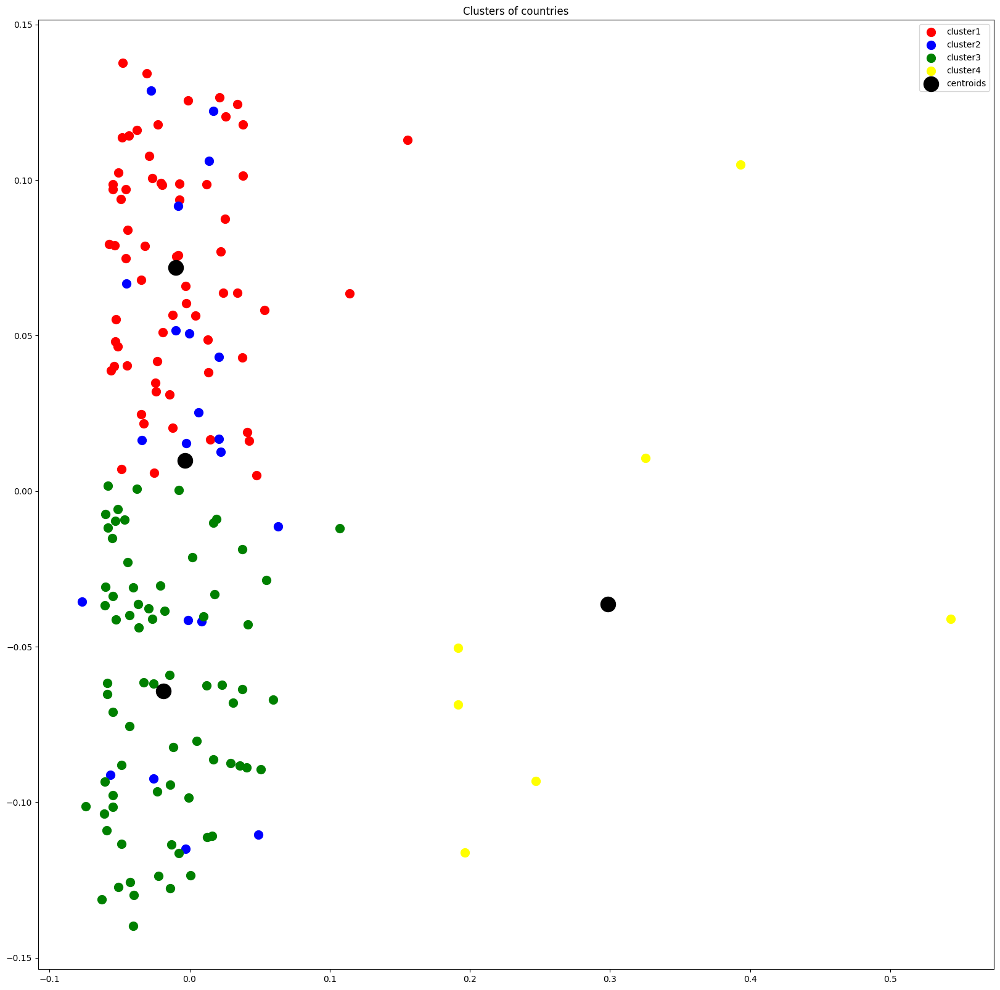

In [131]:
#plotting the clusters along with centroids
plt.figure(figsize=(20,20))
plt.scatter(x_ica[y_kmeans==0]['IC1'],x_ica[y_kmeans==0]['IC2'],s=100,c='red',label='cluster1')
plt.scatter(x_ica[y_kmeans==1]['IC1'],x_ica[y_kmeans==1]['IC2'],s=100,c='blue',label='cluster2')
plt.scatter(x_ica[y_kmeans==2]['IC1'],x_ica[y_kmeans==2]['IC2'],s=100,c='green',label='cluster3')
plt.scatter(x_ica[y_kmeans==3]['IC1'],x_ica[y_kmeans==3]['IC2'],s=100,c='yellow',label='cluster4')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],s=300,c='black',label='centroids')
plt.title('Clusters of countries')
plt.legend()
plt.show()


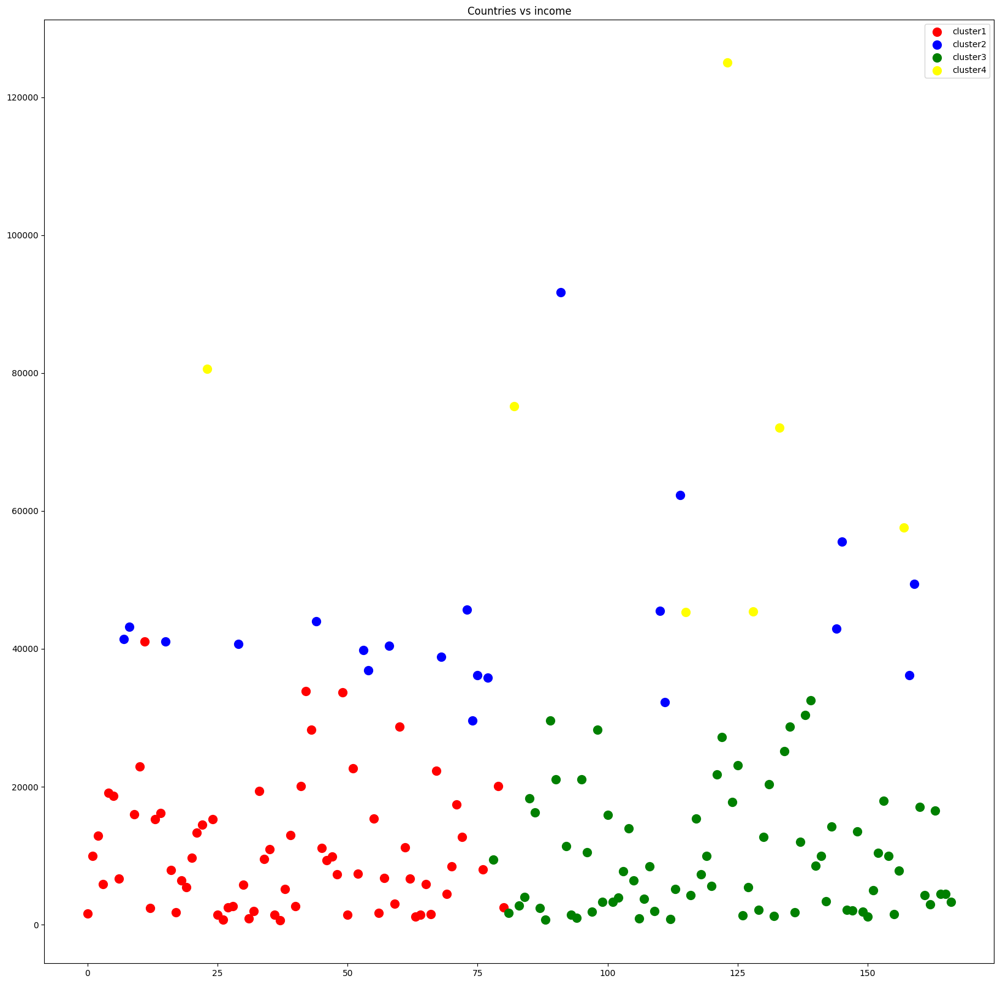

In [132]:
#plotting the clusters for country vs income
df_ica_kmeans['cluster'] = y_kmeans
plt.figure(figsize=(20,20))
plt.scatter(df_ica_kmeans[y_kmeans==0]['country'],df_ica_kmeans[y_kmeans==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_kmeans[y_kmeans==1]['country'],df_ica_kmeans[y_kmeans==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_kmeans[y_kmeans==2]['country'],df_ica_kmeans[y_kmeans==2]['income'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_kmeans[y_kmeans==3]['country'],df_ica_kmeans[y_kmeans==3]['income'],s=100,c='yellow',label='cluster4')
plt.title('Countries vs income')
plt.legend()
plt.show()

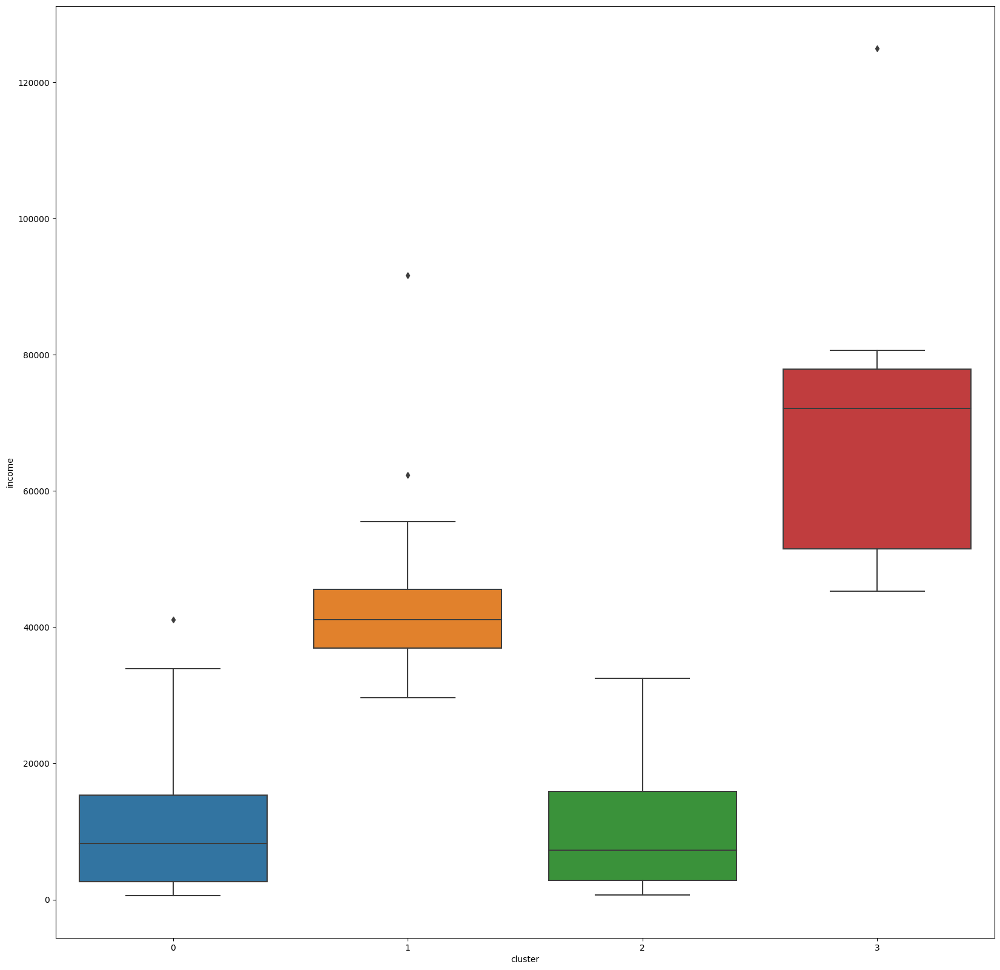

In [133]:
#plotting the clusters for country vs income using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_ica_kmeans)
plt.show()

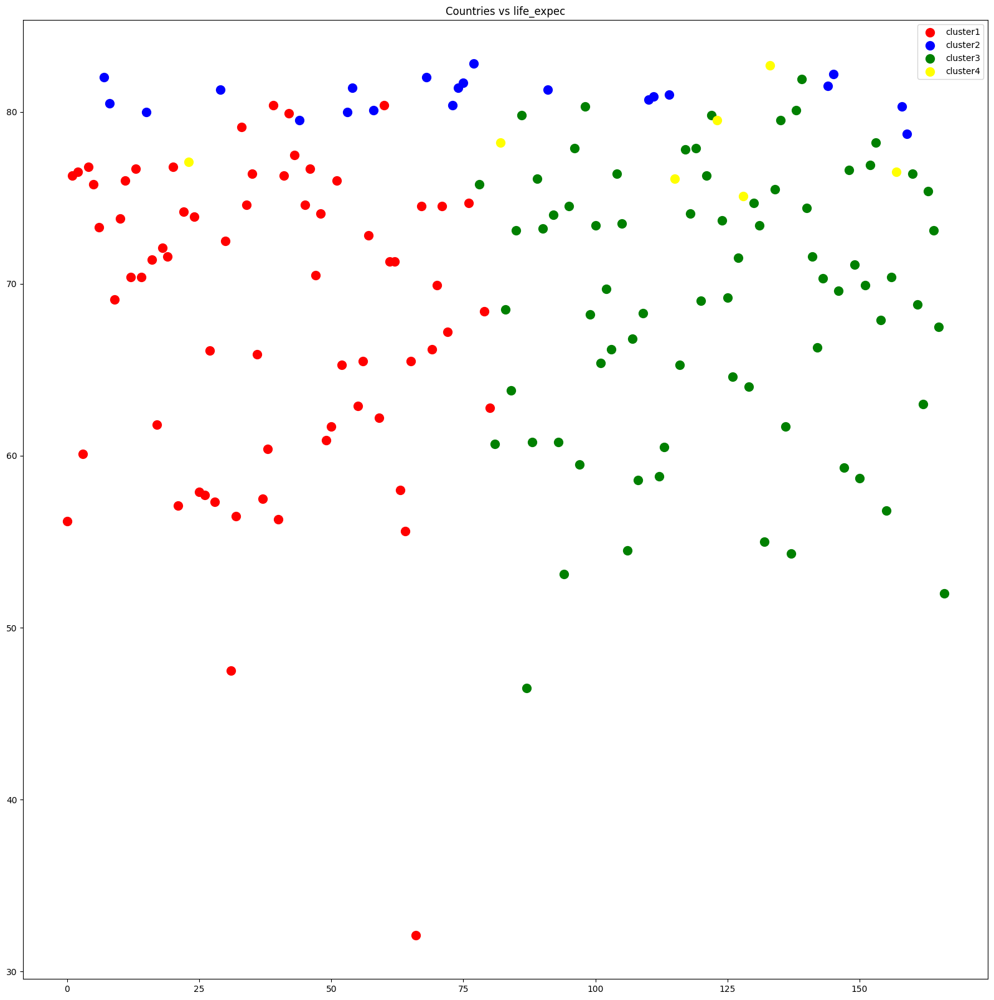

In [134]:
#plotting the clusters for country vs life_expec
plt.figure(figsize=(20,20))
plt.scatter(df_ica_kmeans[y_kmeans==0]['country'],df_ica_kmeans[y_kmeans==0]['life_expec'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_kmeans[y_kmeans==1]['country'],df_ica_kmeans[y_kmeans==1]['life_expec'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_kmeans[y_kmeans==2]['country'],df_ica_kmeans[y_kmeans==2]['life_expec'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_kmeans[y_kmeans==3]['country'],df_ica_kmeans[y_kmeans==3]['life_expec'],s=100,c='yellow',label='cluster4')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()

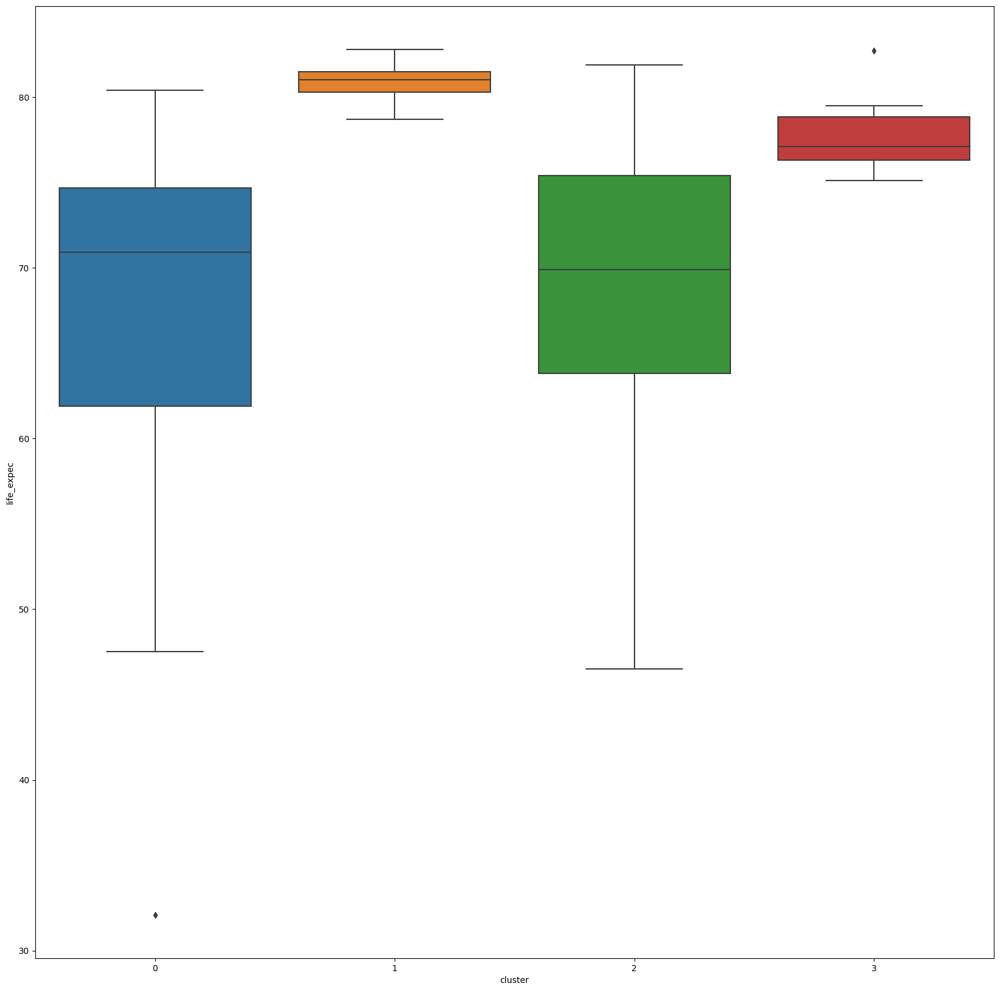

In [135]:
#plotting the clusters for country vs life_expec using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_ica_kmeans)
plt.show()

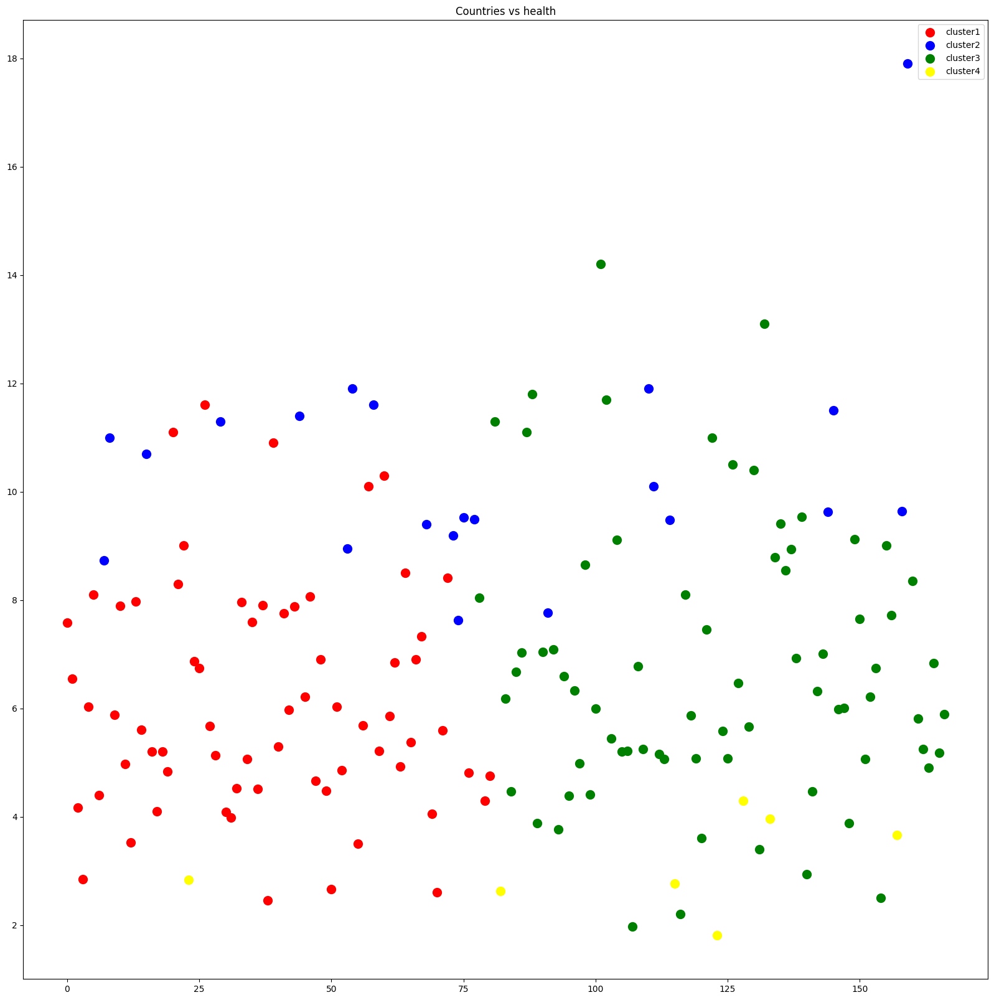

In [136]:
#plotting the clusters for country vs health
plt.figure(figsize=(20,20))
plt.scatter(df_ica_kmeans[y_kmeans==0]['country'],df_ica_kmeans[y_kmeans==0]['health'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_kmeans[y_kmeans==1]['country'],df_ica_kmeans[y_kmeans==1]['health'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_kmeans[y_kmeans==2]['country'],df_ica_kmeans[y_kmeans==2]['health'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_kmeans[y_kmeans==3]['country'],df_ica_kmeans[y_kmeans==3]['health'],s=100,c='yellow',label='cluster4')
plt.title('Countries vs health')
plt.legend()
plt.show()

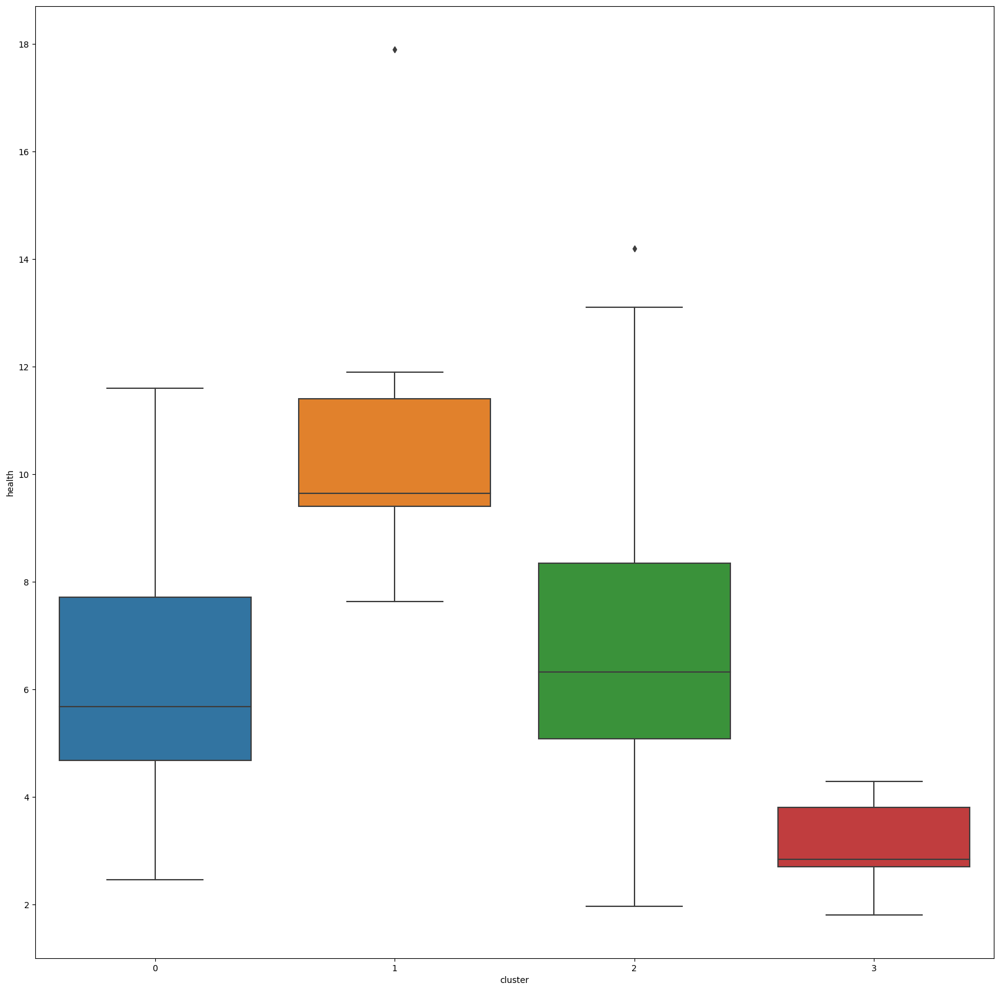

In [137]:
#plotting the clusters for country vs health using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='health',data=df_ica_kmeans)
plt.show()

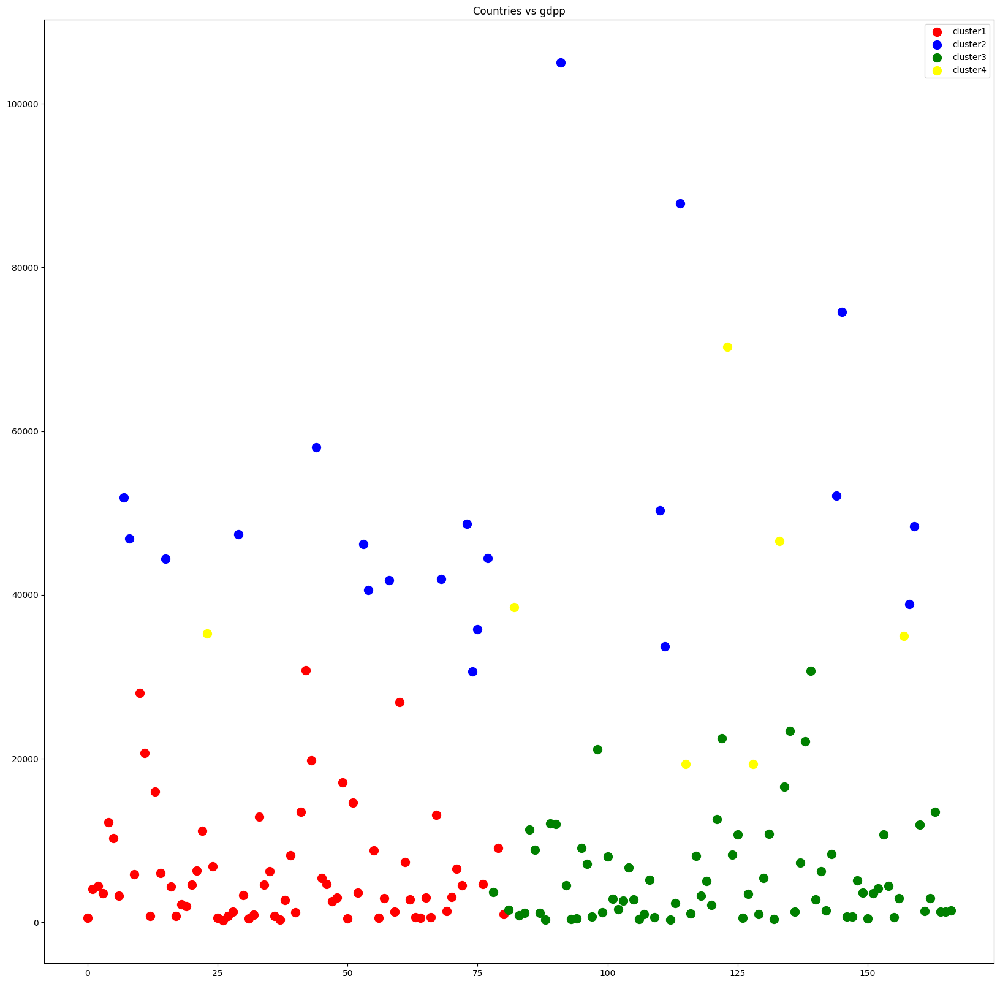

In [138]:
#plotting the clusters for country vs gdpp
plt.figure(figsize=(20,20))
plt.scatter(df_ica_kmeans[y_kmeans==0]['country'],df_ica_kmeans[y_kmeans==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_kmeans[y_kmeans==1]['country'],df_ica_kmeans[y_kmeans==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_kmeans[y_kmeans==2]['country'],df_ica_kmeans[y_kmeans==2]['gdpp'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_kmeans[y_kmeans==3]['country'],df_ica_kmeans[y_kmeans==3]['gdpp'],s=100,c='yellow',label='cluster4')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

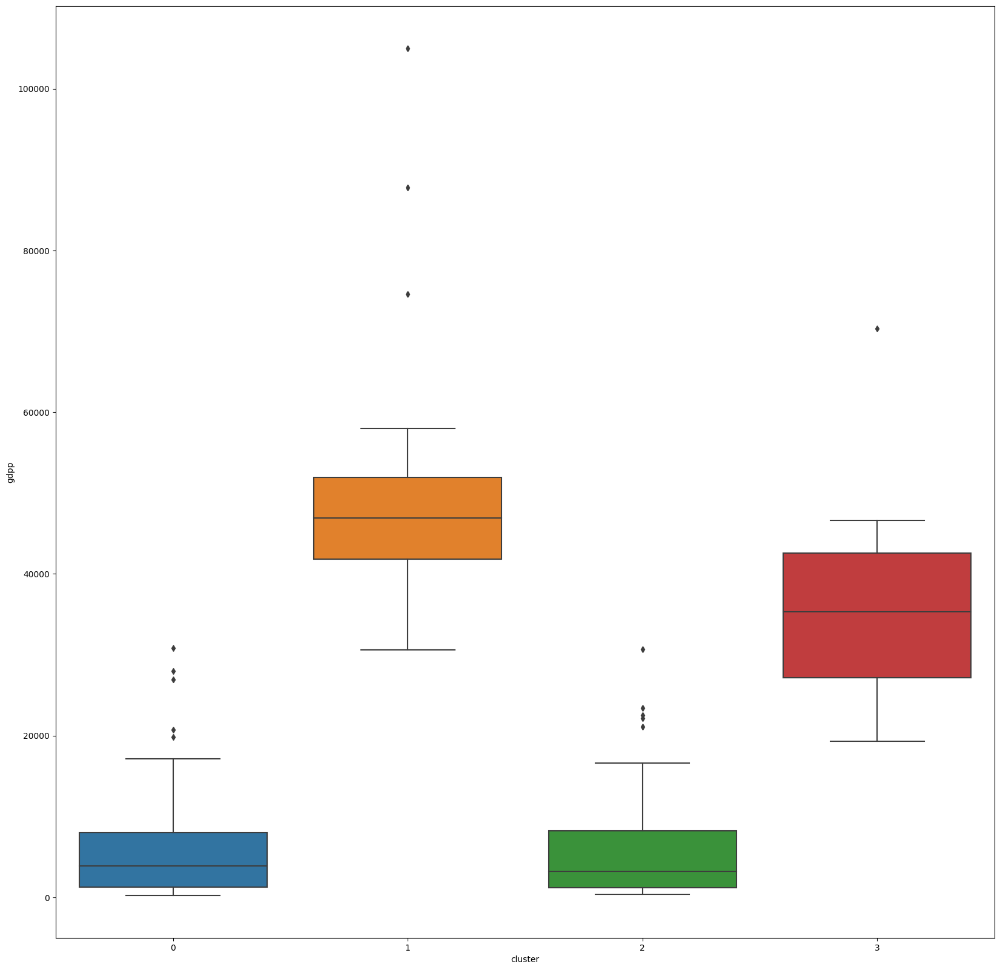

In [139]:
#plotting the clusters for country vs gdpp using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_ica_kmeans)
plt.show()

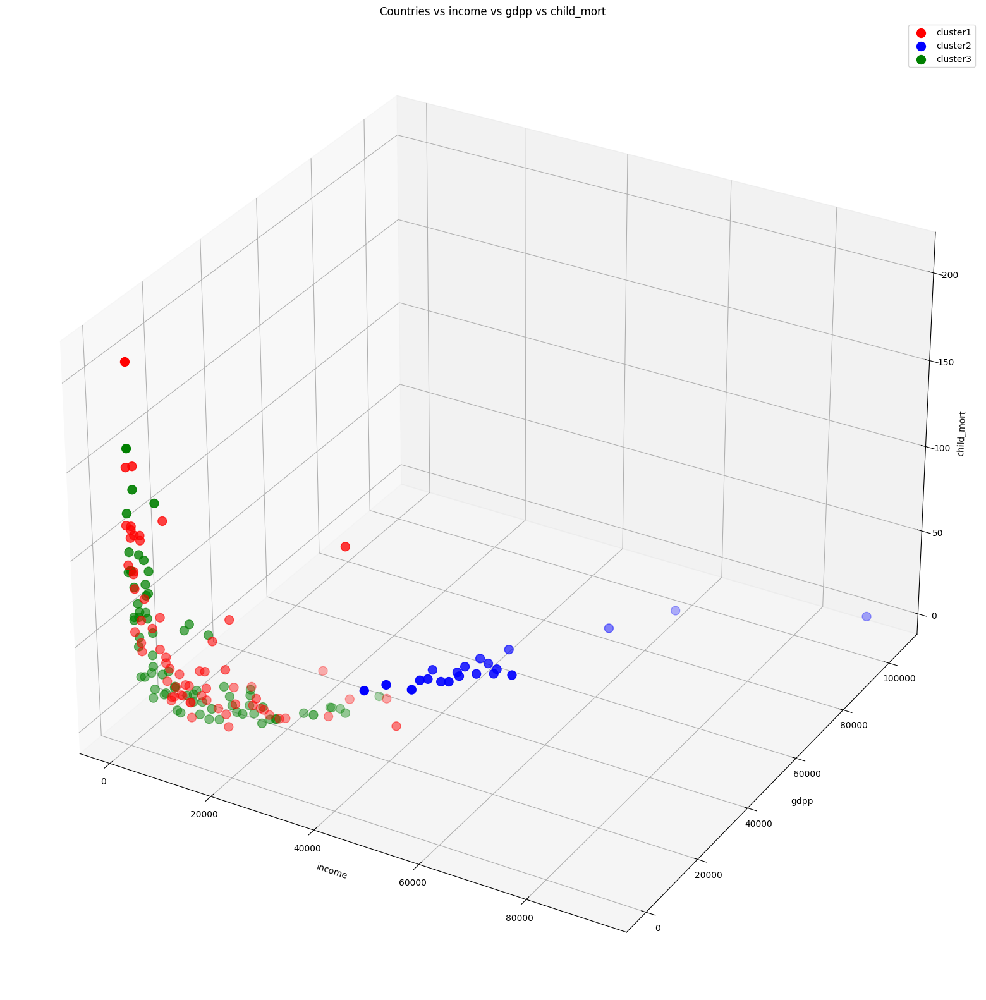

In [140]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_ica_kmeans[df_ica_kmeans['cluster']==0]['income'],df_ica_kmeans[df_ica_kmeans['cluster']==0]['gdpp'],df_ica_kmeans[df_ica_kmeans['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_ica_kmeans[df_ica_kmeans['cluster']==1]['income'],df_ica_kmeans[df_ica_kmeans['cluster']==1]['gdpp'],df_ica_kmeans[df_ica_kmeans['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_ica_kmeans[df_ica_kmeans['cluster']==2]['income'],df_ica_kmeans[df_ica_kmeans['cluster']==2]['gdpp'],df_ica_kmeans[df_ica_kmeans['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

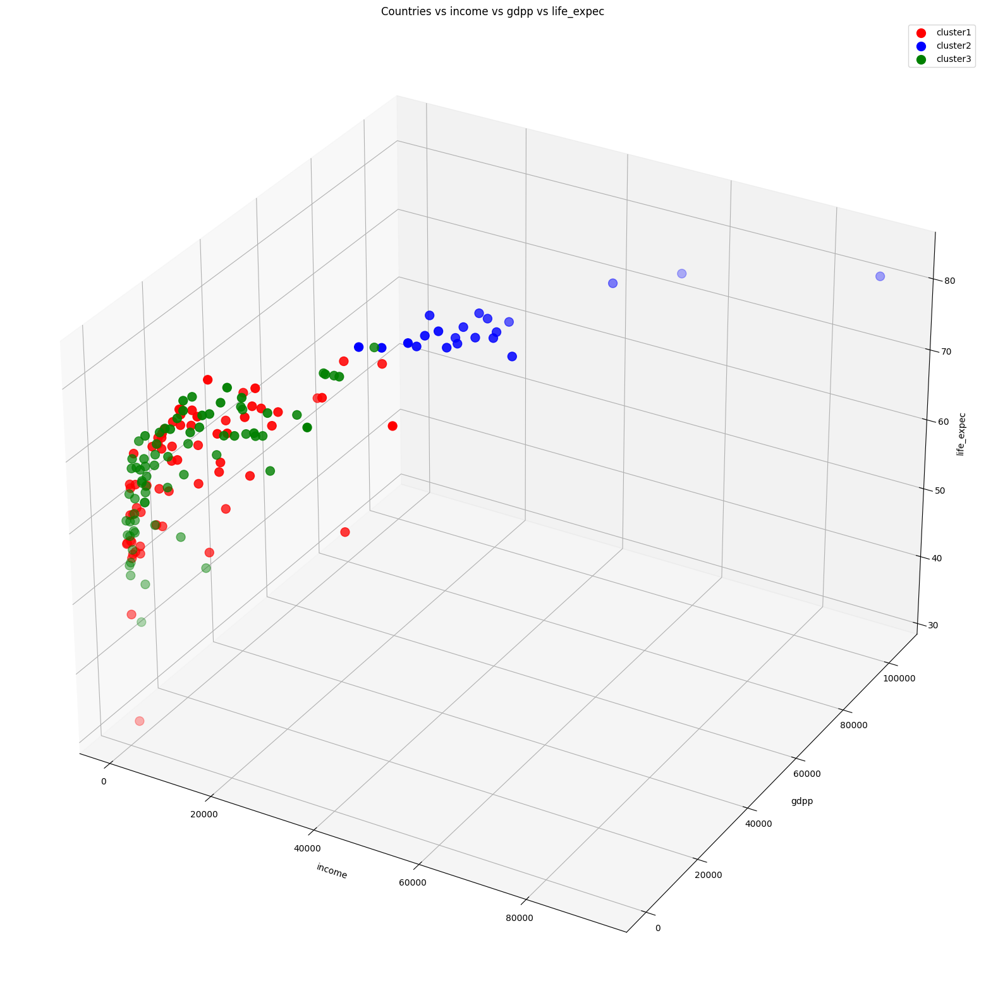

In [141]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_ica_kmeans[df_ica_kmeans['cluster']==0]['income'],df_ica_kmeans[df_ica_kmeans['cluster']==0]['gdpp'],df_ica_kmeans[df_ica_kmeans['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_ica_kmeans[df_ica_kmeans['cluster']==1]['income'],df_ica_kmeans[df_ica_kmeans['cluster']==1]['gdpp'],df_ica_kmeans[df_ica_kmeans['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_ica_kmeans[df_ica_kmeans['cluster']==2]['income'],df_ica_kmeans[df_ica_kmeans['cluster']==2]['gdpp'],df_ica_kmeans[df_ica_kmeans['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [142]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_ica_kmeans, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

In [143]:
#preparing the plot_kmeans_data to plot in the world map
plot_kmeans_data = df_ica_kmeans['cluster']
#adding the country names to the plot_kmeans_data
plot_kmeans_data = pd.concat([plot_kmeans_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_kmeans_data['cluster'] = plot_kmeans_data['cluster'].replace({0:'Help Needed',2:'Help Needed',1:'Least Help Needed',3:'May Need Help'})
plot_kmeans_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,Help Needed,Albania
2,Help Needed,Algeria
3,Help Needed,Angola
4,Help Needed,Antigua and Barbuda


In [144]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_kmeans_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" represents the countries which "needed least help"

Countries in color "Green" represents the countries which "may need help"

#**Applying Hierarchial clustering on the ICA implemented dataset**

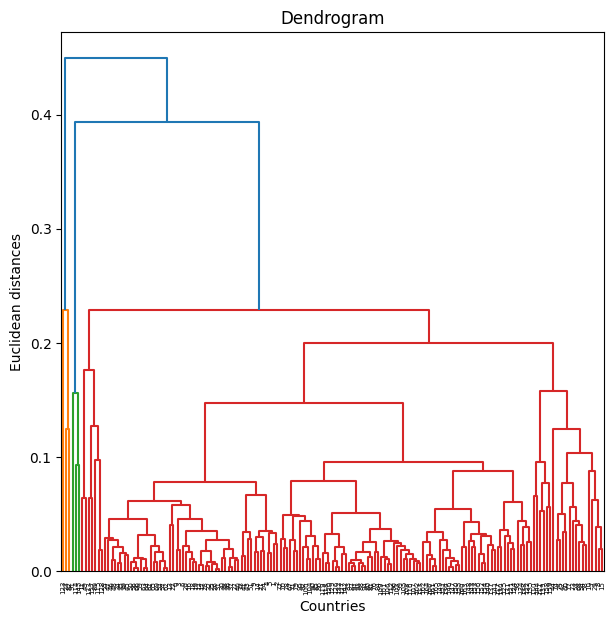

In [145]:
#implementing the hierarchical clustering
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(7,7))
dendrogram = sch.dendrogram(sch.linkage(x_ica,method='average'))
plt.title('Dendrogram')
plt.xlabel('Countries')
plt.ylabel('Euclidean distances')
plt.show()

In [146]:
#fitting the hierarchical clustering to the dataset
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters=4,affinity='euclidean',linkage='average')
y_hc = hc.fit_predict(x_ica)
y_hc

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 3, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 3, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 3, 1, 1, 1,
       1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64)

##Visualization of the dataset after Hierarchial clustering 

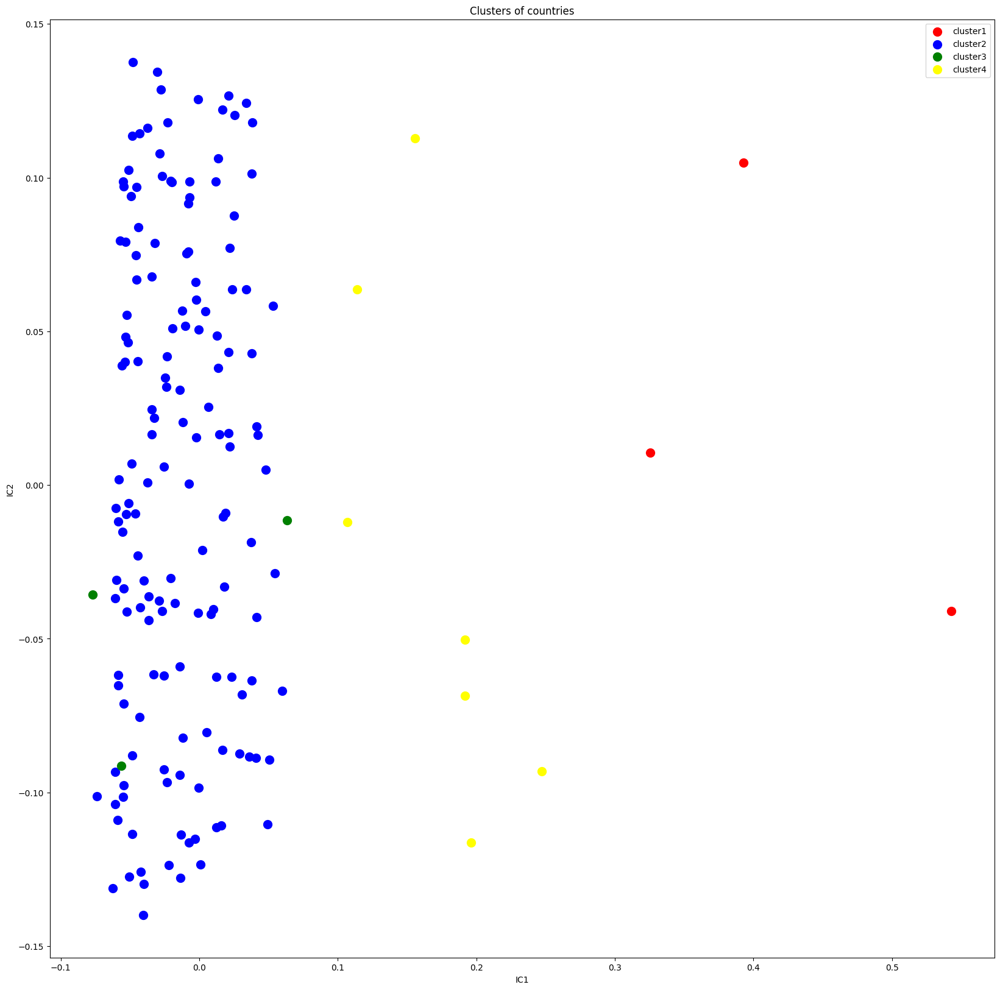

In [147]:
#plotting the clusters with ic1 and ic2 along with centroids
df_ica_hierarchal['cluster'] = y_hc
plt.figure(figsize=(20,20))
plt.scatter(x_ica[y_hc==0]['IC1'],x_ica[y_hc==0]['IC2'],s=100,c='red',label='cluster1')
plt.scatter(x_ica[y_hc==1]['IC1'],x_ica[y_hc==1]['IC2'],s=100,c='blue',label='cluster2')
plt.scatter(x_ica[y_hc==2]['IC1'],x_ica[y_hc==2]['IC2'],s=100,c='green',label='cluster3')
plt.scatter(x_ica[y_hc==3]['IC1'],x_ica[y_hc==3]['IC2'],s=100,c='yellow',label='cluster4')
plt.title('Clusters of countries')
plt.xlabel('IC1')
plt.ylabel('IC2')
plt.legend()

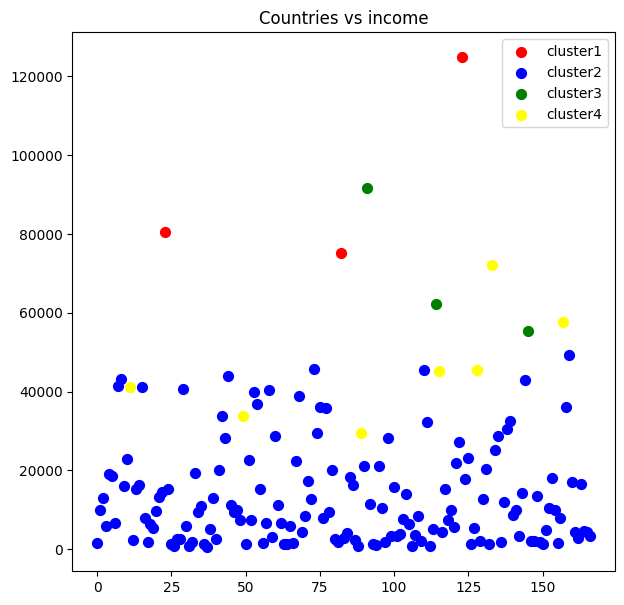

In [148]:
#plotting the clusters for country vs income
plt.figure(figsize=(7,7))
plt.scatter(df_ica_hierarchal[y_hc==0]['country'],df_ica_hierarchal[y_hc==0]['income'],s=50,c='red',label='cluster1')
plt.scatter(df_ica_hierarchal[y_hc==1]['country'],df_ica_hierarchal[y_hc==1]['income'],s=50,c='blue',label='cluster2')
plt.scatter(df_ica_hierarchal[y_hc==2]['country'],df_ica_hierarchal[y_hc==2]['income'],s=50,c='green',label='cluster3')
plt.scatter(df_ica_hierarchal[y_hc==3]['country'],df_ica_hierarchal[y_hc==3]['income'],s=50,c='yellow',label='cluster4')
plt.title('Countries vs income')
plt.legend()
plt.show()

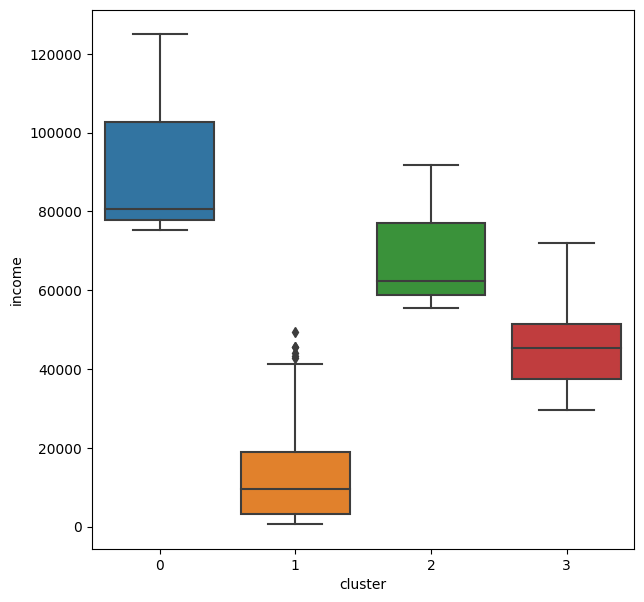

In [149]:
#plotting the clusters for country vs income using boxplot
plt.figure(figsize=(7,7))
sns.boxplot(x='cluster',y='income',data=df_ica_hierarchal)
plt.show()

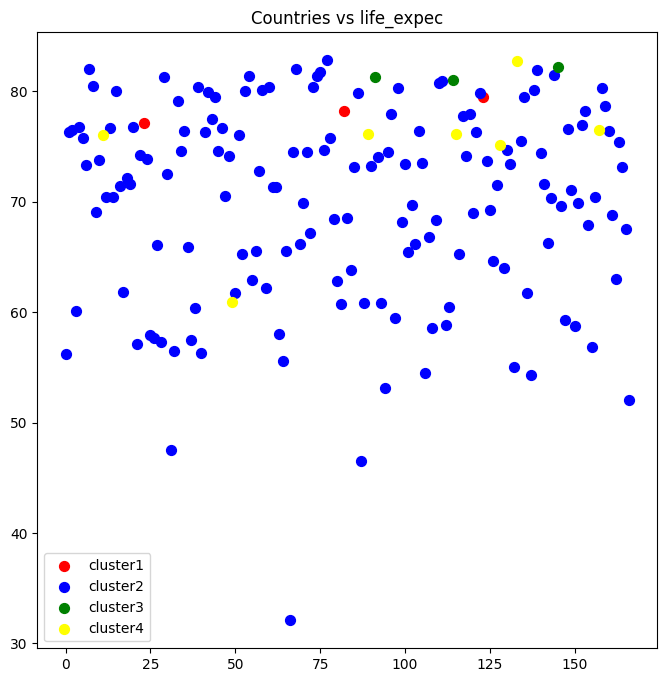

In [150]:
#plotting the clusters for country vs life_expec
plt.figure(figsize=(8,8))
plt.scatter(df_ica_hierarchal[y_hc==0]['country'],df_ica_hierarchal[y_hc==0]['life_expec'],s=50,c='red',label='cluster1')
plt.scatter(df_ica_hierarchal[y_hc==1]['country'],df_ica_hierarchal[y_hc==1]['life_expec'],s=50,c='blue',label='cluster2')
plt.scatter(df_ica_hierarchal[y_hc==2]['country'],df_ica_hierarchal[y_hc==2]['life_expec'],s=50,c='green',label='cluster3')
plt.scatter(df_ica_hierarchal[y_hc==3]['country'],df_ica_hierarchal[y_hc==3]['life_expec'],s=50,c='yellow',label='cluster4')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()


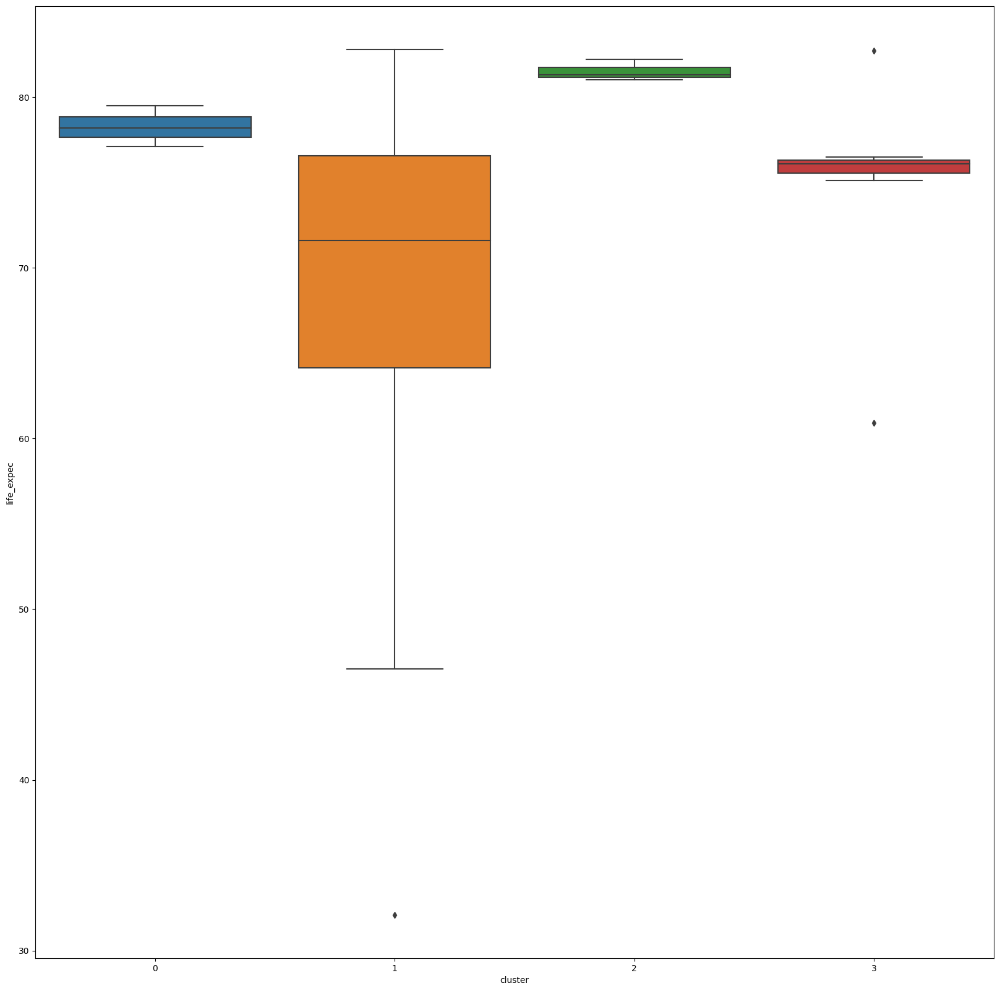

In [151]:
#plotting the clusters for country vs life_expec using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_ica_hierarchal)
plt.show()

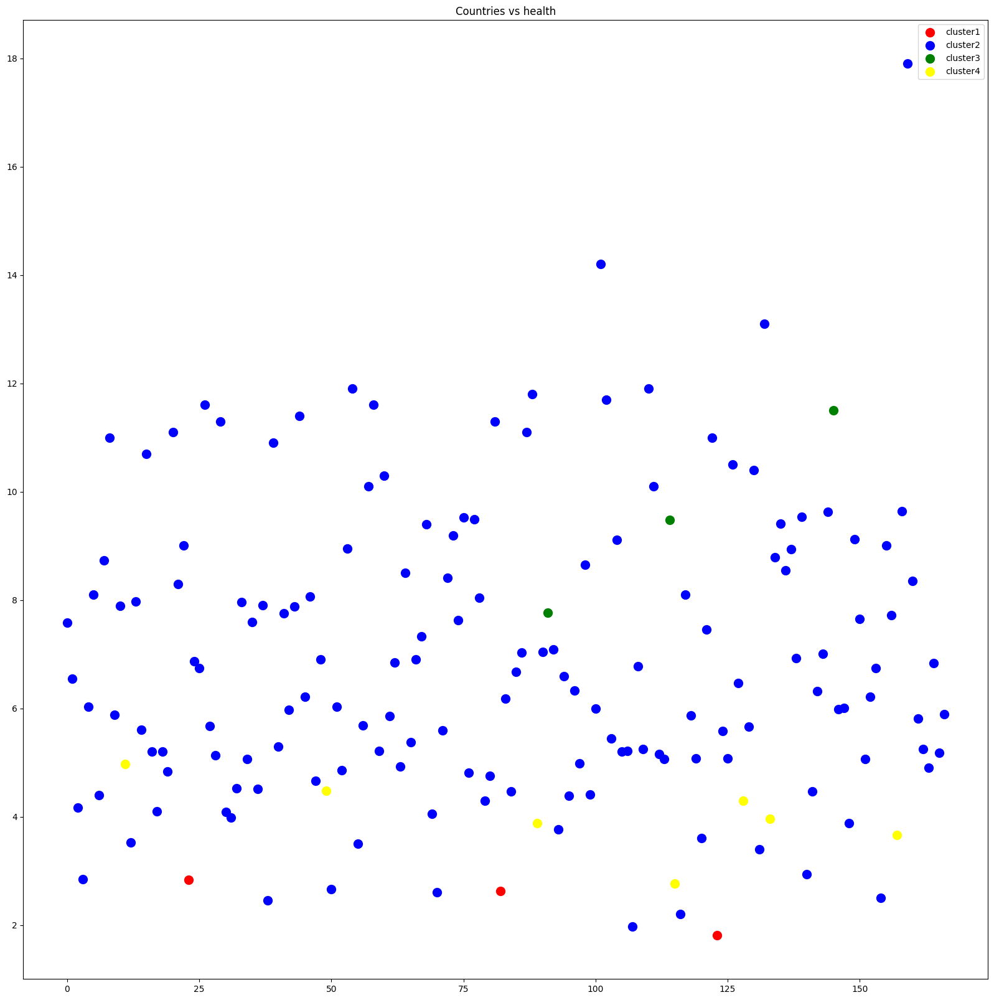

In [152]:
#plotting the clusters for country vs health
plt.figure(figsize=(20,20))
plt.scatter(df_ica_hierarchal[y_hc==0]['country'],df_ica_hierarchal[y_hc==0]['health'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_hierarchal[y_hc==1]['country'],df_ica_hierarchal[y_hc==1]['health'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_hierarchal[y_hc==2]['country'],df_ica_hierarchal[y_hc==2]['health'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_hierarchal[y_hc==3]['country'],df_ica_hierarchal[y_hc==3]['health'],s=100,c='yellow',label='cluster4')
plt.title('Countries vs health')
plt.legend()
plt.show()

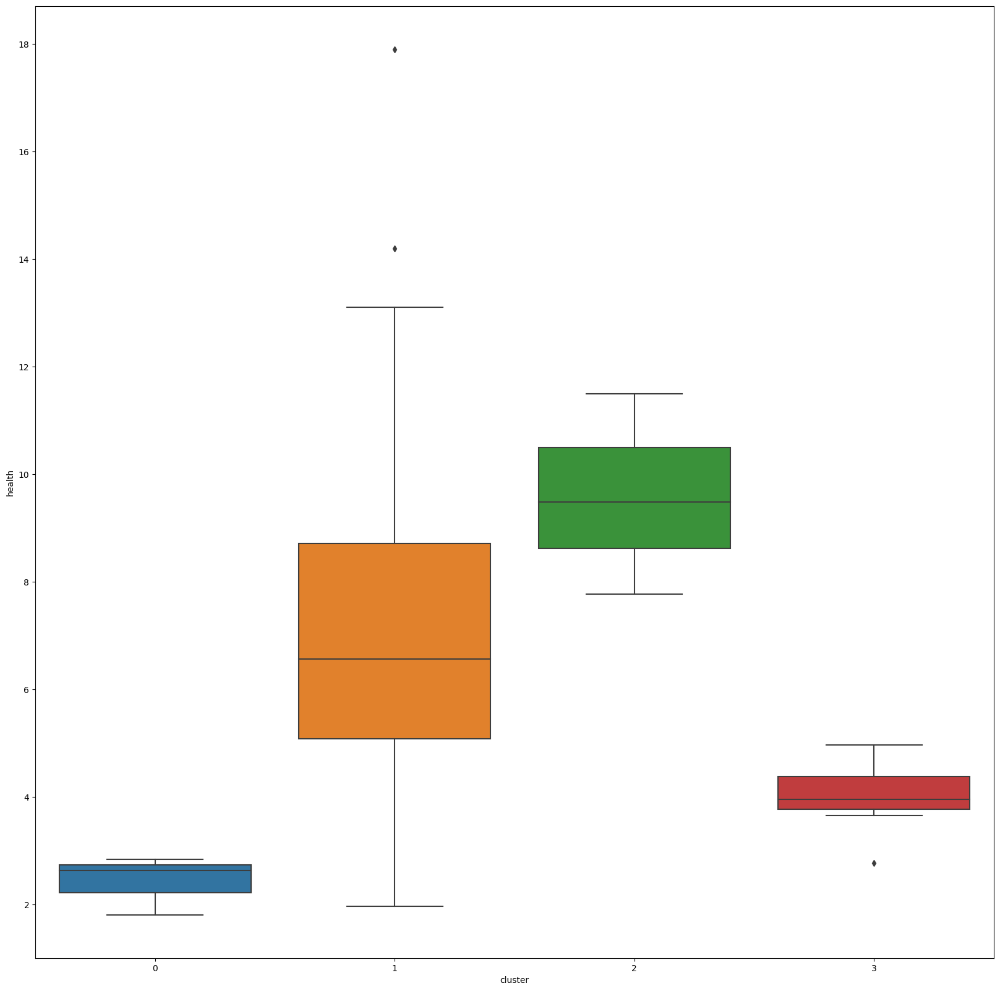

In [153]:
#plotting the clusters for country vs health using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='health',data=df_ica_hierarchal)
plt.show()

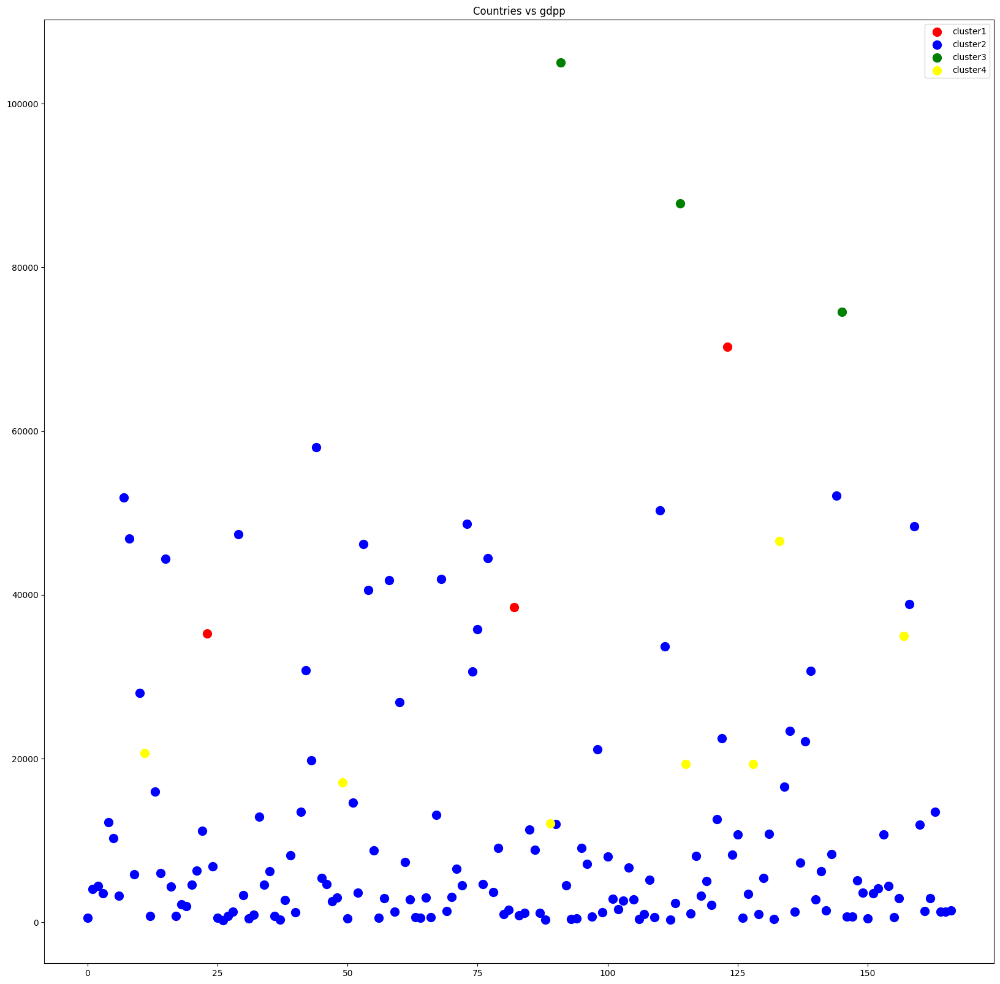

In [154]:
#plotting the clusters for country vs gdpp
plt.figure(figsize=(20,20))
plt.scatter(df_ica_hierarchal[y_hc==0]['country'],df_ica_hierarchal[y_hc==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_hierarchal[y_hc==1]['country'],df_ica_hierarchal[y_hc==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_hierarchal[y_hc==2]['country'],df_ica_hierarchal[y_hc==2]['gdpp'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_hierarchal[y_hc==3]['country'],df_ica_hierarchal[y_hc==3]['gdpp'],s=100,c='yellow',label='cluster4')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

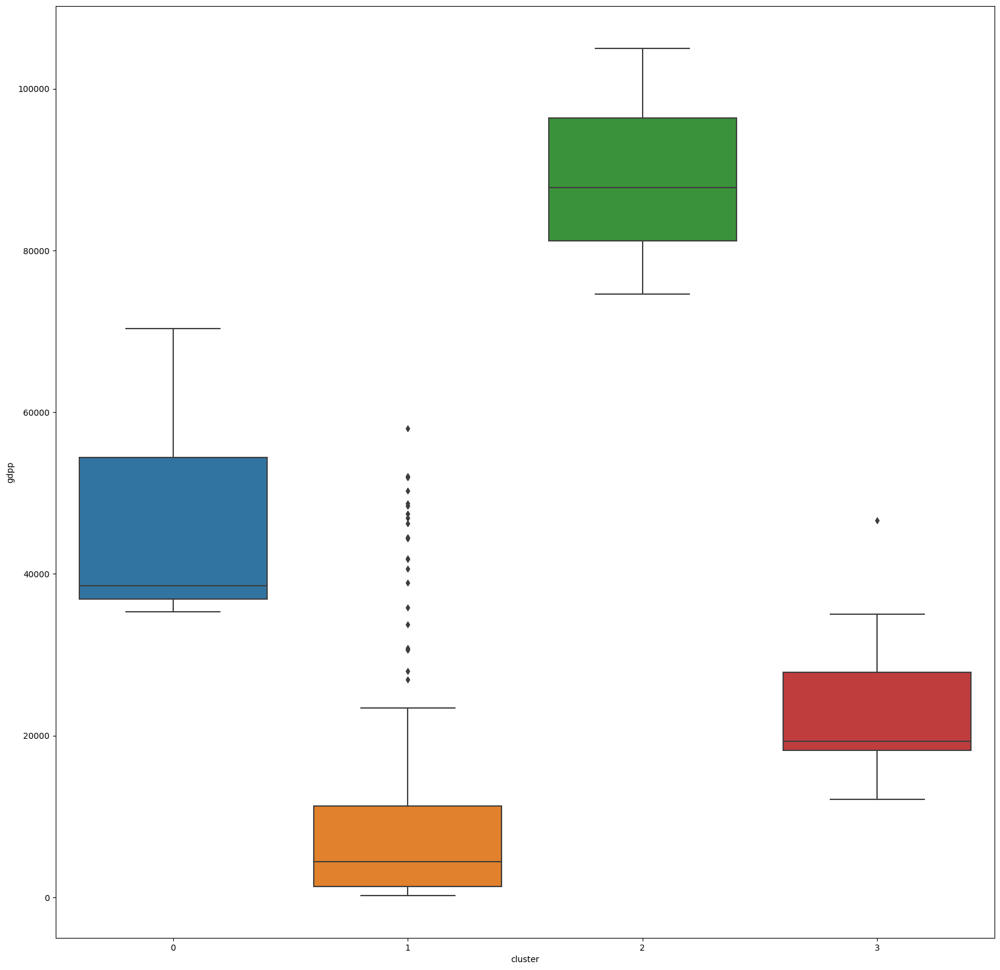

In [155]:
#plotting the clusters for country vs gdpp using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_ica_hierarchal)
plt.show()

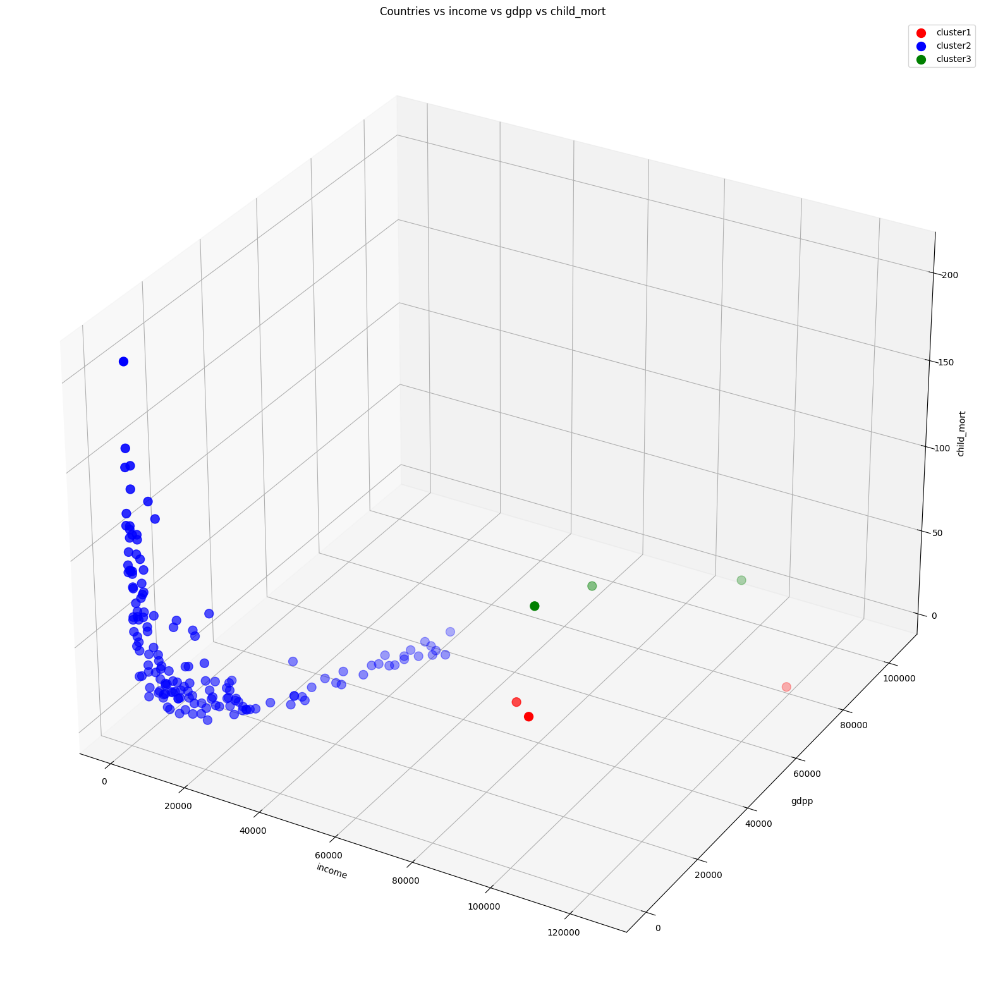

In [156]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_ica_hierarchal[df_ica_hierarchal['cluster']==0]['income'],df_ica_hierarchal[df_ica_hierarchal['cluster']==0]['gdpp'],df_ica_hierarchal[df_ica_hierarchal['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_ica_hierarchal[df_ica_hierarchal['cluster']==1]['income'],df_ica_hierarchal[df_ica_hierarchal['cluster']==1]['gdpp'],df_ica_hierarchal[df_ica_hierarchal['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_ica_hierarchal[df_ica_hierarchal['cluster']==2]['income'],df_ica_hierarchal[df_ica_hierarchal['cluster']==2]['gdpp'],df_ica_hierarchal[df_ica_hierarchal['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

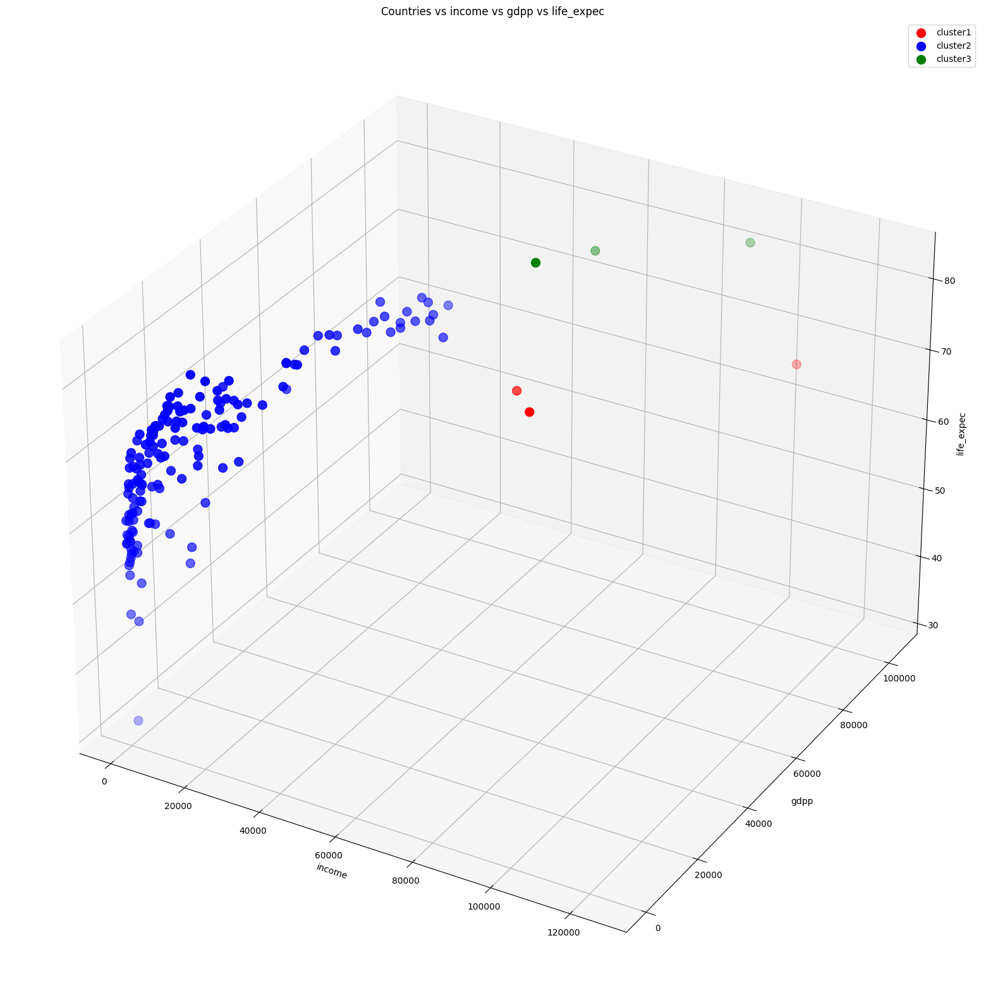

In [157]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_ica_hierarchal[df_ica_hierarchal['cluster']==0]['income'],df_ica_hierarchal[df_ica_hierarchal['cluster']==0]['gdpp'],df_ica_hierarchal[df_ica_hierarchal['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_ica_hierarchal[df_ica_hierarchal['cluster']==1]['income'],df_ica_hierarchal[df_ica_hierarchal['cluster']==1]['gdpp'],df_ica_hierarchal[df_ica_hierarchal['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_ica_hierarchal[df_ica_hierarchal['cluster']==2]['income'],df_ica_hierarchal[df_ica_hierarchal['cluster']==2]['gdpp'],df_ica_hierarchal[df_ica_hierarchal['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [158]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_ica_hierarchal, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

In [159]:
#preparing the plot_kmeans_data to plot in the world map
plot_hierarchal_data = df_ica_hierarchal['cluster']
#adding the country names to the plot_kmeans_data
plot_hierarchal_data = pd.concat([plot_hierarchal_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_hierarchal_data['cluster'] = plot_hierarchal_data['cluster'].replace({0:'Least Help Needed',2:'Least Help Needed',1:'Help Needed',3:'May Need Help'})
plot_hierarchal_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,Help Needed,Albania
2,Help Needed,Algeria
3,Help Needed,Angola
4,Help Needed,Antigua and Barbuda


In [160]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_hierarchal_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Countries in color "Red" represents the countries which "needed help"

Countries in color "Green" represents the countries which "needed least help"

Countries in color "Blue" represents the countries which "may need help"


# **Applying DBSCAN on the ICA implemented dataset**

In [161]:
#implementing dbscan for ica
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.05,min_samples=2)
dbscan.fit(x_ica)
y_dbscan = dbscan.labels_
y_dbscan

array([ 0,  0,  0,  0,  0,  0,  0, -1,  1,  0, -1, -1,  0,  0,  0,  1,  0,
        0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  1,  0, -1,  0,  0,  0,  0, -1,  0,
        0,  0,  1,  1,  0,  0,  0,  1,  0,  1,  0,  0,  0,  0,  0,  0,  0,
        1,  0,  0,  0,  0,  1,  1,  1,  0,  1,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0, -1,  2,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  0,  0,  2,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1, -1, -1,  0,  0,  0,  0,  0,  0,  0],
      dtype=int64)

In [162]:
print(np.unique(y_dbscan))

[-1  0  1  2]


##Visualization of the dataset after applying DBSCAN

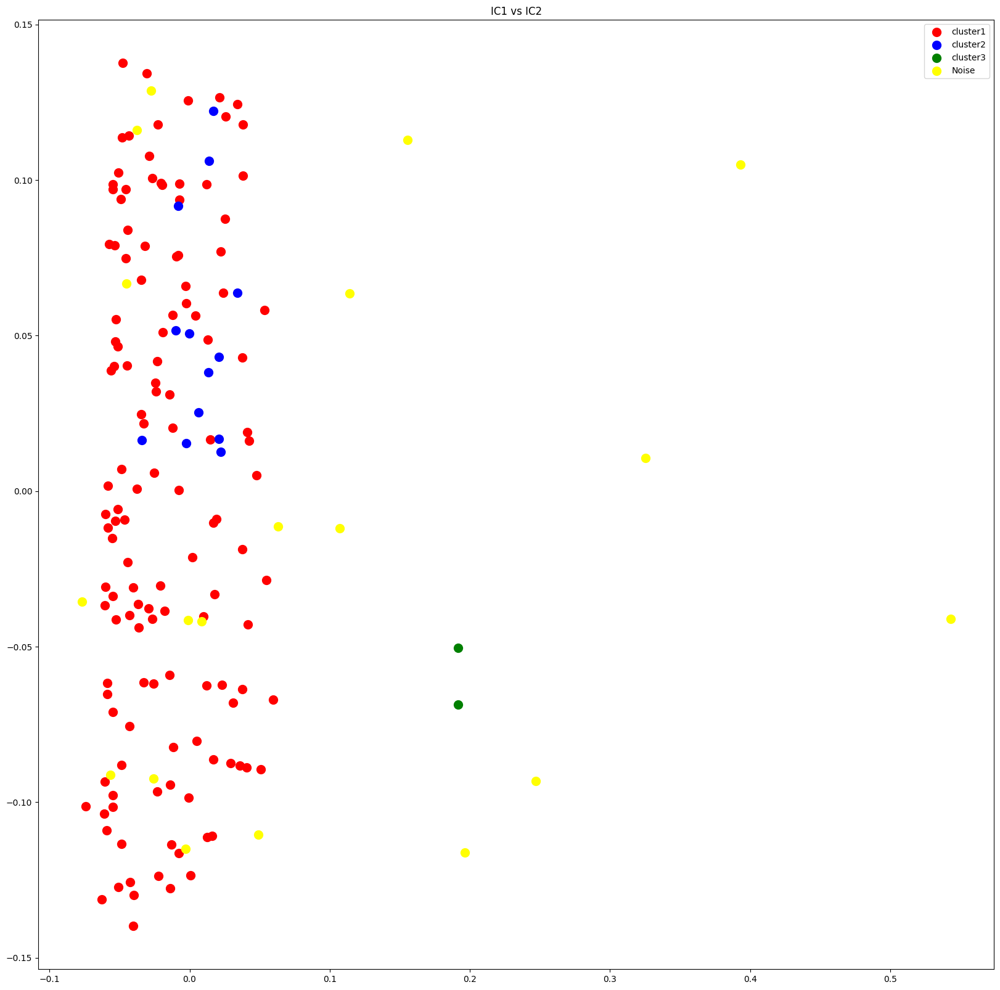

In [163]:
#plotting the clusters for IC1 vs IC2
plt.figure(figsize=(20,20))
plt.scatter(x_ica[y_dbscan==0]['IC1'],x_ica[y_dbscan==0]['IC2'],s=100,c='red',label='cluster1')
plt.scatter(x_ica[y_dbscan==1]['IC1'],x_ica[y_dbscan==1]['IC2'],s=100,c='blue',label='cluster2')
plt.scatter(x_ica[y_dbscan==2]['IC1'],x_ica[y_dbscan==2]['IC2'],s=100,c='green',label='cluster3')
plt.scatter(x_ica[y_dbscan==-1]['IC1'],x_ica[y_dbscan==-1]['IC2'],s=100,c='yellow',label='Noise')
plt.title('IC1 vs IC2')
plt.legend()
plt.show()


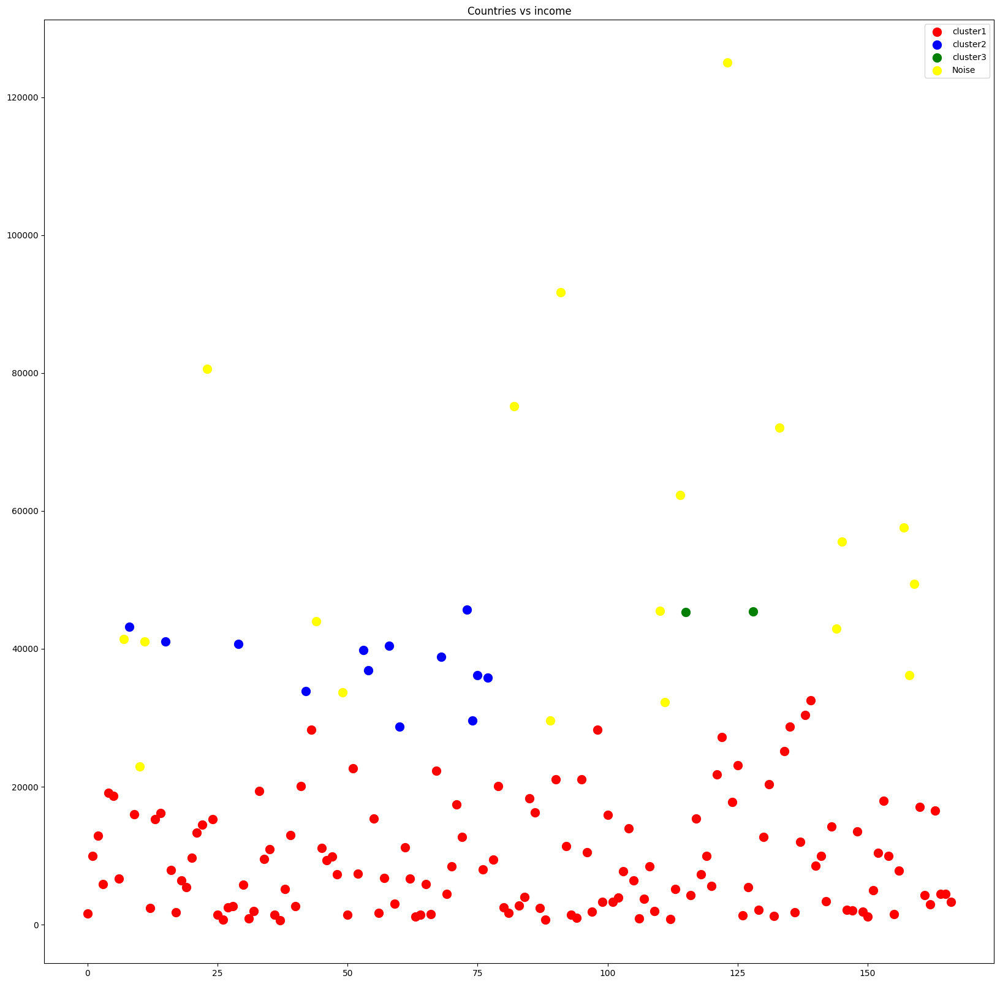

In [164]:
#plotting the cluster for country vs income
df_ica_dbscan['cluster'] = y_dbscan
plt.figure(figsize=(20,20))
plt.scatter(df_ica_dbscan[y_dbscan==0]['country'],df_ica_dbscan[y_dbscan==0]['income'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_dbscan[y_dbscan==1]['country'],df_ica_dbscan[y_dbscan==1]['income'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_dbscan[y_dbscan==2]['country'],df_ica_dbscan[y_dbscan==2]['income'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_dbscan[y_dbscan==-1]['country'],df_ica_dbscan[y_dbscan==-1]['income'],s=100,c='yellow',label='Noise')
plt.title('Countries vs income')
plt.legend()
plt.show()

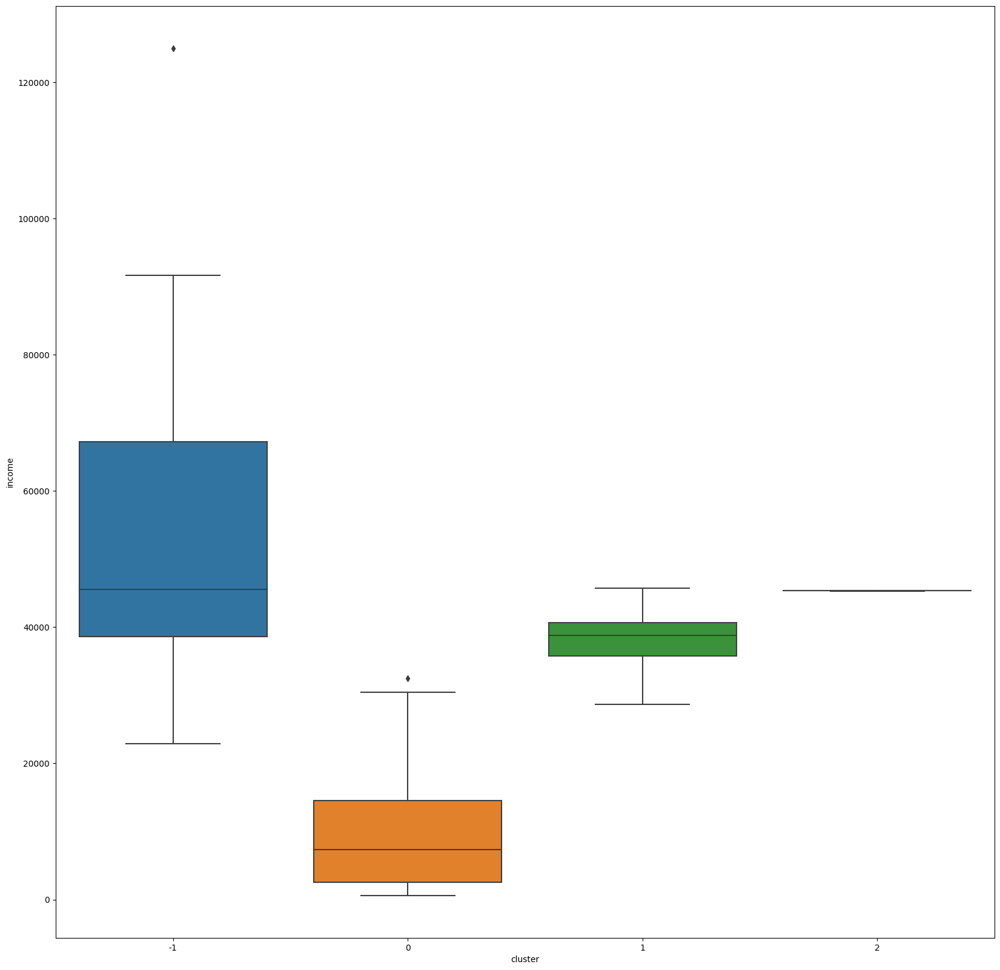

In [165]:
#plotting the clusters for country vs income using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='income',data=df_ica_dbscan)
plt.show()

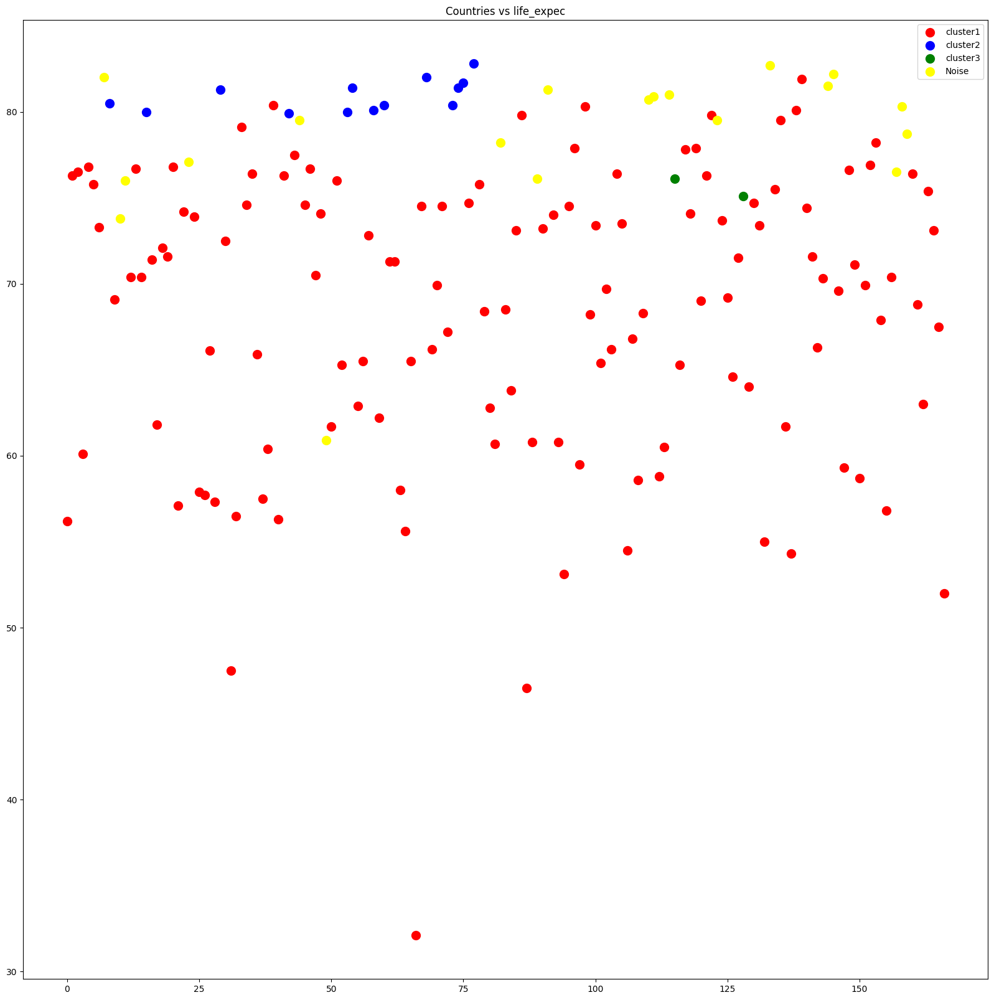

In [166]:
#plotting the clusters for country vs life_expec
plt.figure(figsize=(20,20))
plt.scatter(df_ica_dbscan[y_dbscan==0]['country'],df_ica_dbscan[y_dbscan==0]['life_expec'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_dbscan[y_dbscan==1]['country'],df_ica_dbscan[y_dbscan==1]['life_expec'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_dbscan[y_dbscan==2]['country'],df_ica_dbscan[y_dbscan==2]['life_expec'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_dbscan[y_dbscan==-1]['country'],df_ica_dbscan[y_dbscan==-1]['life_expec'],s=100,c='yellow',label='Noise')
plt.title('Countries vs life_expec')
plt.legend()
plt.show()

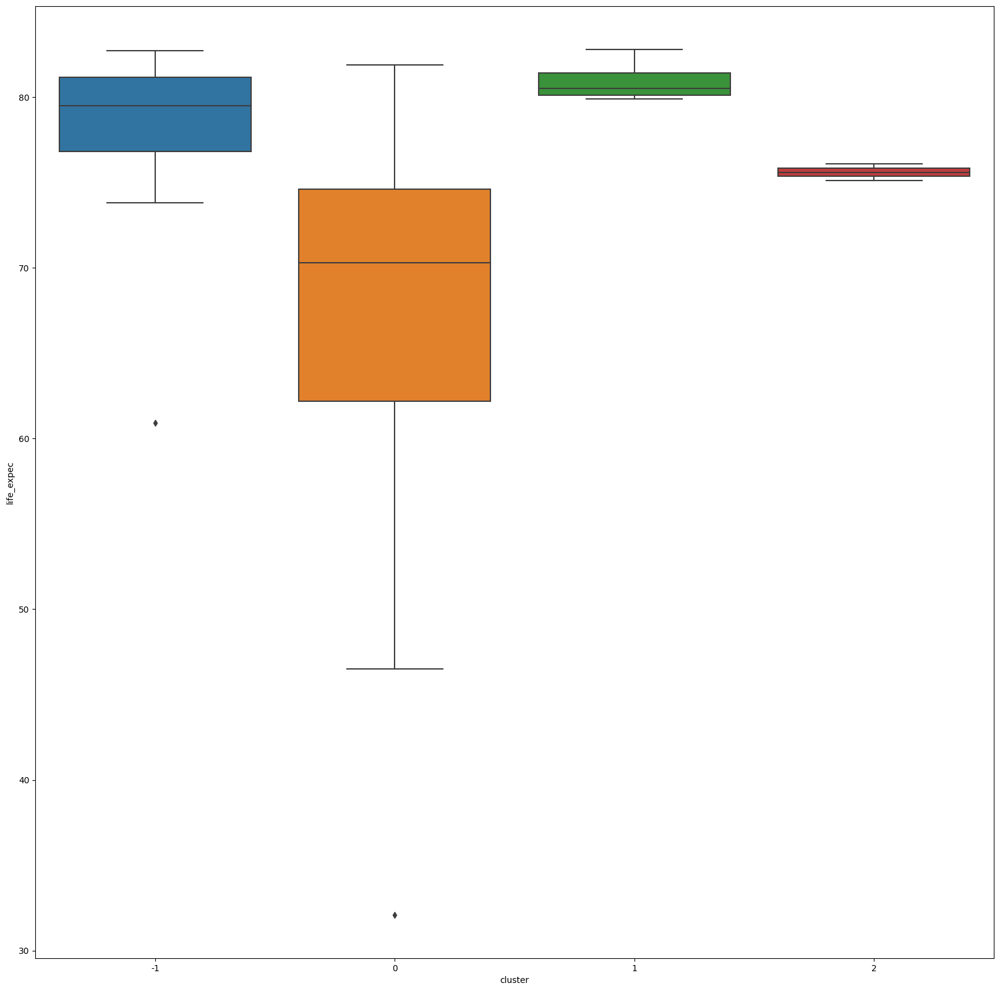

In [167]:
#plotting the clusters for country vs life_expec using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='life_expec',data=df_ica_dbscan)
plt.show()

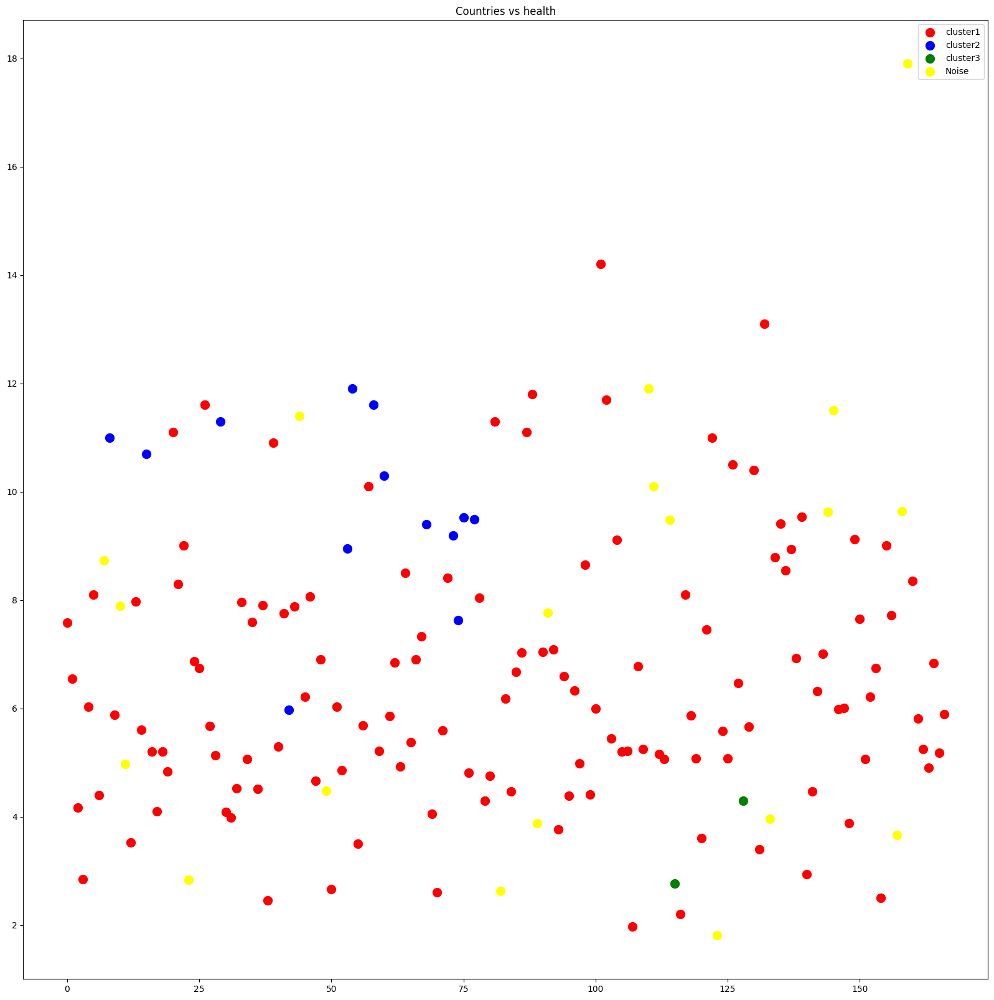

In [168]:
#plotting the clusters for country vs health
plt.figure(figsize=(20,20))
plt.scatter(df_ica_dbscan[y_dbscan==0]['country'],df_ica_dbscan[y_dbscan==0]['health'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_dbscan[y_dbscan==1]['country'],df_ica_dbscan[y_dbscan==1]['health'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_dbscan[y_dbscan==2]['country'],df_ica_dbscan[y_dbscan==2]['health'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_dbscan[y_dbscan==-1]['country'],df_ica_dbscan[y_dbscan==-1]['health'],s=100,c='yellow',label='Noise')
plt.title('Countries vs health')
plt.legend()
plt.show()

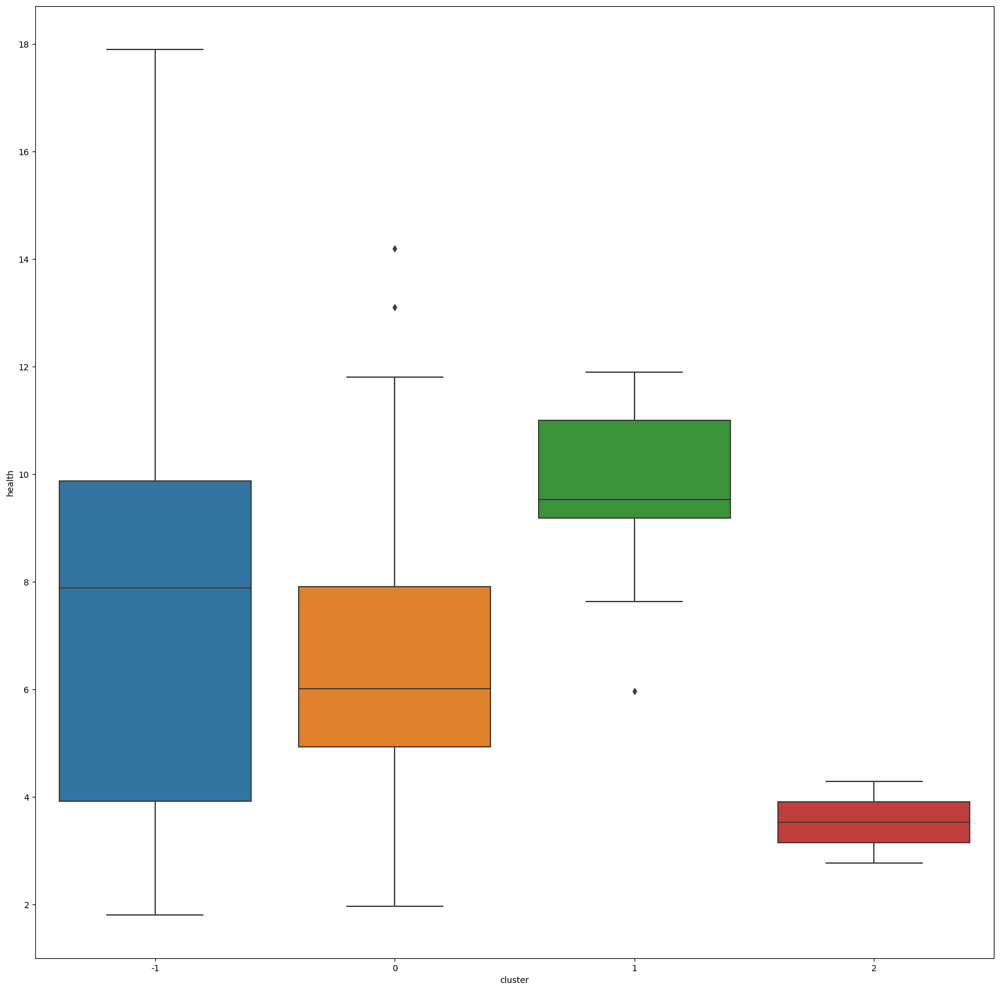

In [169]:
#plotting the clusters for country vs health using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='health',data=df_ica_dbscan)
plt.show()

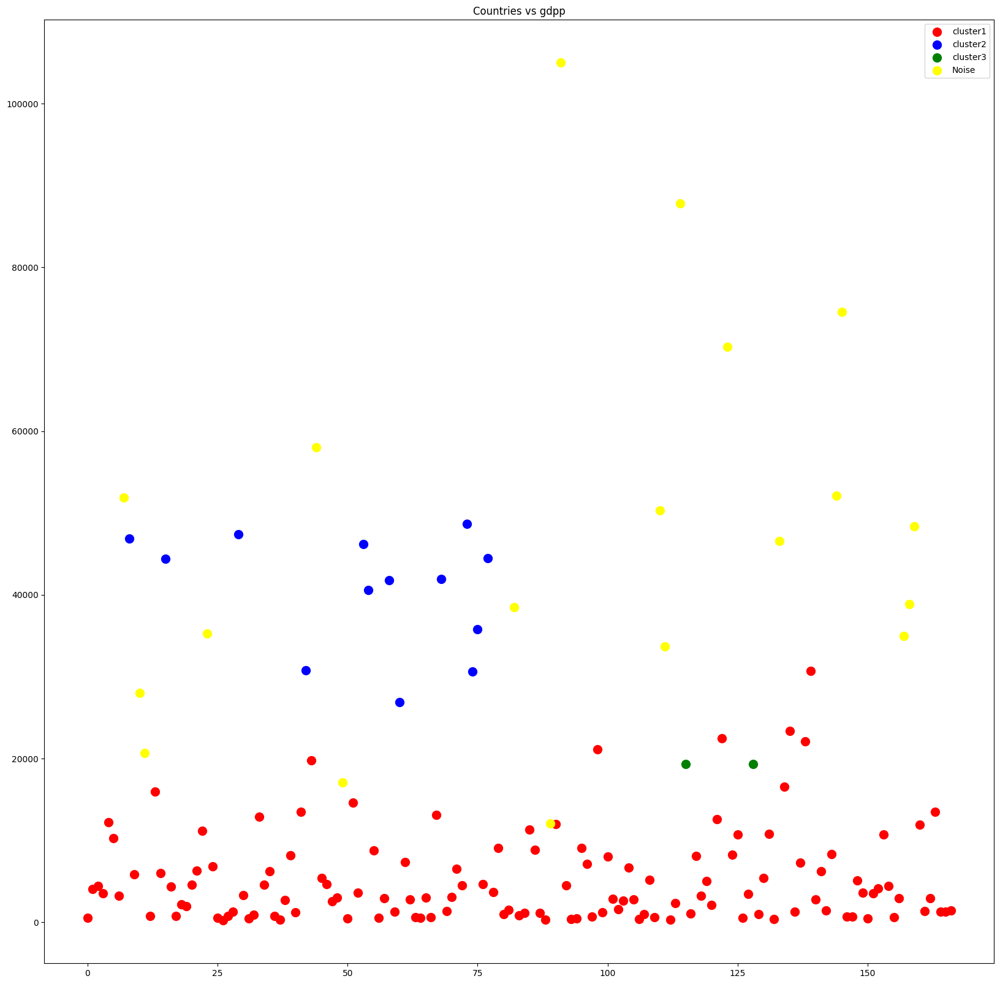

In [170]:
#plotting the clusters for country vs gdpp
plt.figure(figsize=(20,20))
plt.scatter(df_ica_dbscan[y_dbscan==0]['country'],df_ica_dbscan[y_dbscan==0]['gdpp'],s=100,c='red',label='cluster1')
plt.scatter(df_ica_dbscan[y_dbscan==1]['country'],df_ica_dbscan[y_dbscan==1]['gdpp'],s=100,c='blue',label='cluster2')
plt.scatter(df_ica_dbscan[y_dbscan==2]['country'],df_ica_dbscan[y_dbscan==2]['gdpp'],s=100,c='green',label='cluster3')
plt.scatter(df_ica_dbscan[y_dbscan==-1]['country'],df_ica_dbscan[y_dbscan==-1]['gdpp'],s=100,c='yellow',label='Noise')
plt.title('Countries vs gdpp')
plt.legend()
plt.show()

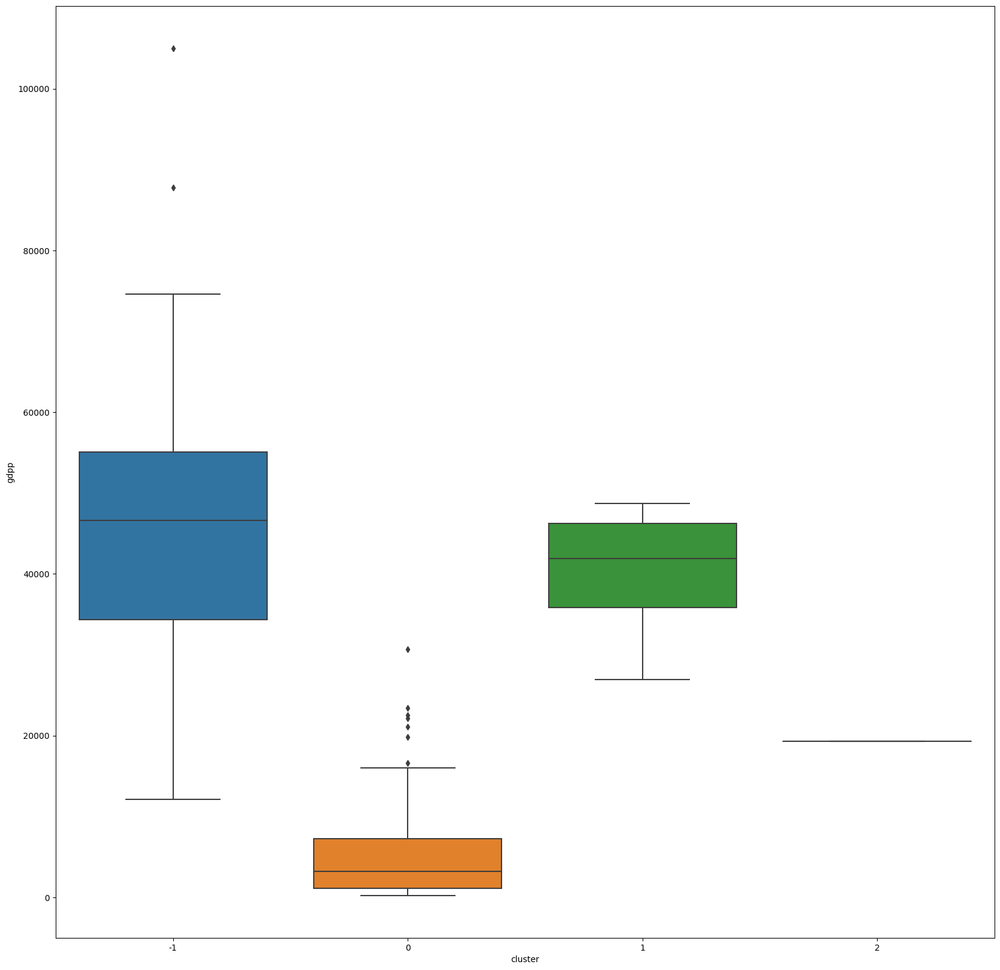

In [171]:
#plotting the clusters for country vs gdpp using boxplot
plt.figure(figsize=(20,20))
sns.boxplot(x='cluster',y='gdpp',data=df_ica_dbscan)
plt.show()

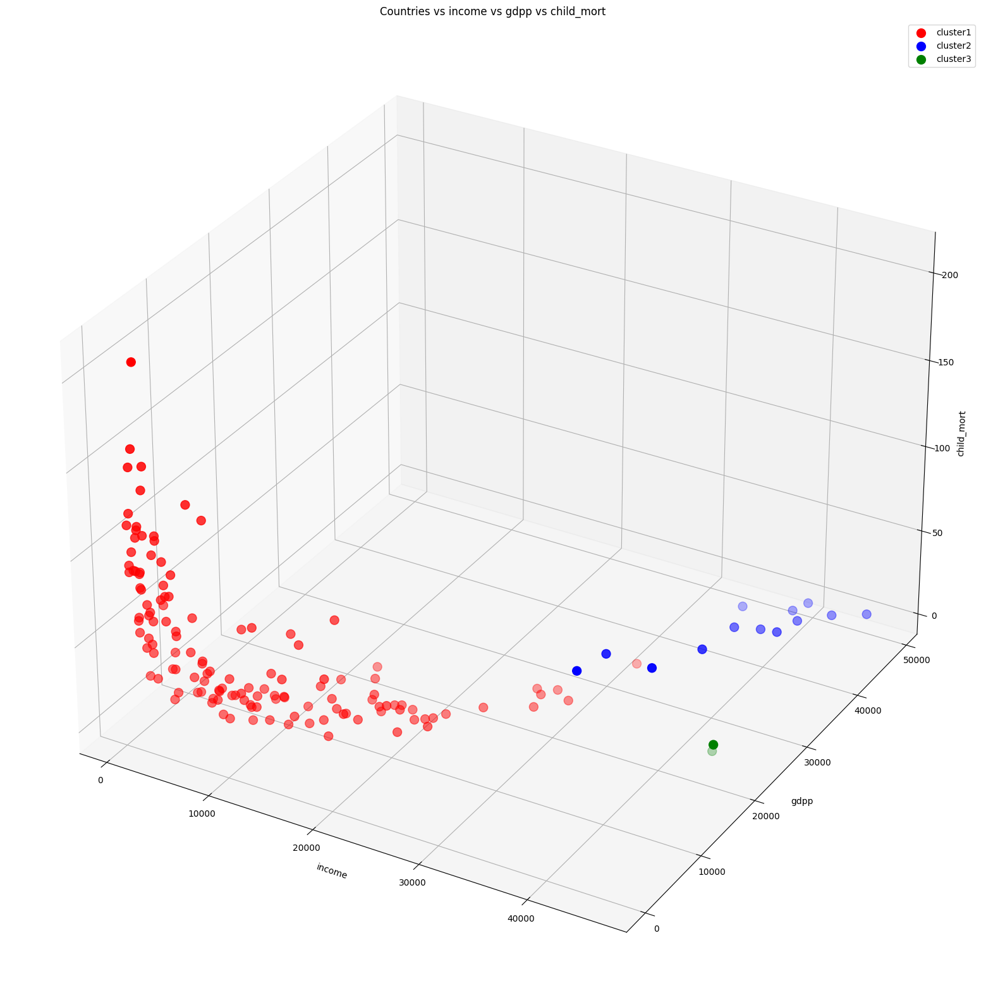

In [172]:
#3d visualization of the clusters
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_ica_dbscan[df_ica_dbscan['cluster']==0]['income'],df_ica_dbscan[df_ica_dbscan['cluster']==0]['gdpp'],df_ica_dbscan[df_ica_dbscan['cluster']==0]['child_mort'],s=100,c='red',label='cluster1')
ax.scatter(df_ica_dbscan[df_ica_dbscan['cluster']==1]['income'],df_ica_dbscan[df_ica_dbscan['cluster']==1]['gdpp'],df_ica_dbscan[df_ica_dbscan['cluster']==1]['child_mort'],s=100,c='blue',label='cluster2')
ax.scatter(df_ica_dbscan[df_ica_dbscan['cluster']==2]['income'],df_ica_dbscan[df_ica_dbscan['cluster']==2]['gdpp'],df_ica_dbscan[df_ica_dbscan['cluster']==2]['child_mort'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('child_mort')
plt.title('Countries vs income vs gdpp vs child_mort')
plt.legend()
plt.show()

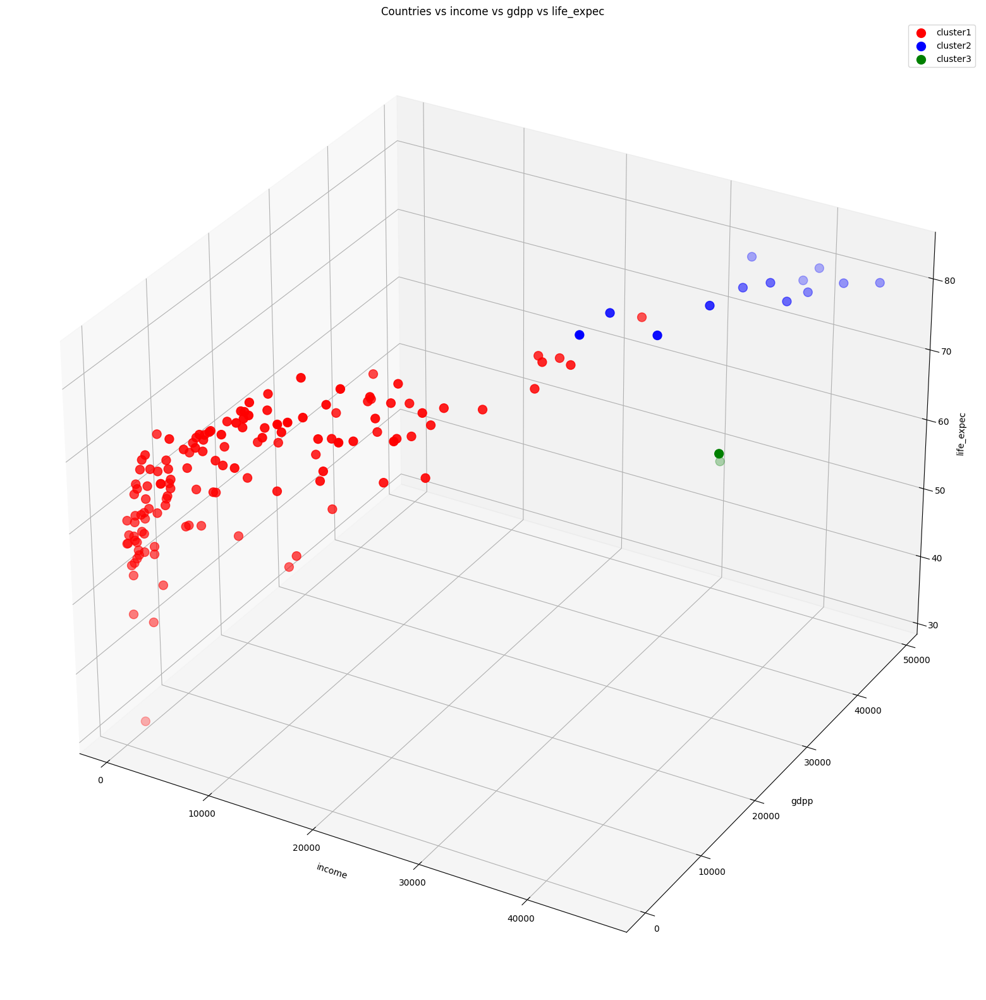

In [173]:
#visualizing the clusters using 3d plots for other than income, gdpp and child_mort
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_ica_dbscan[df_ica_dbscan['cluster']==0]['income'],df_ica_dbscan[df_ica_dbscan['cluster']==0]['gdpp'],df_ica_dbscan[df_ica_dbscan['cluster']==0]['life_expec'],s=100,c='red',label='cluster1')
ax.scatter(df_ica_dbscan[df_ica_dbscan['cluster']==1]['income'],df_ica_dbscan[df_ica_dbscan['cluster']==1]['gdpp'],df_ica_dbscan[df_ica_dbscan['cluster']==1]['life_expec'],s=100,c='blue',label='cluster2')
ax.scatter(df_ica_dbscan[df_ica_dbscan['cluster']==2]['income'],df_ica_dbscan[df_ica_dbscan['cluster']==2]['gdpp'],df_ica_dbscan[df_ica_dbscan['cluster']==2]['life_expec'],s=100,c='green',label='cluster3')
ax.set_xlabel('income')
ax.set_ylabel('gdpp')
ax.set_zlabel('life_expec')
plt.title('Countries vs income vs gdpp vs life_expec')
plt.legend()
plt.show()

In [174]:
import plotly.express as px
#plotting 3d plots using plotly
fig = px.scatter_3d(df_ica_dbscan, x='income', y='gdpp', z='child_mort',color='cluster')
fig.show()

From the above plots we can see that cluster 2,3 needs less help and cluster 1 needs more help.

In [175]:
#preparing the data for world map plot
plot_dbscan_data = df_ica_dbscan['cluster']
#adding the country names to the plot_dbscan_data
plot_dbscan_data = pd.concat([plot_dbscan_data,data['country']],axis=1)
#replacing cluster 1 as Help Needed, cluster 2 as May Need Help, and cluster 3 as Least Help Needed
plot_dbscan_data['cluster'] = plot_dbscan_data['cluster'].replace({0:'Help Needed',1:'Least Help Needed',2:'May Need Help',-1:'Noise'})
plot_dbscan_data.head()

,cluster,country
0,Help Needed,Afghanistan
1,Help Needed,Albania
2,Help Needed,Algeria
3,Help Needed,Angola
4,Help Needed,Antigua and Barbuda


In [176]:
#plotting the countries on the global map with the cluster 1 as underdeveloped countries and cluster 2 as developing countries and cluster 3 as developed countries
import plotly.express as px
#color the country according to their cluster and show the boundaries of the countries
fig = px.choropleth(plot_dbscan_data, locations="country", color="cluster", locationmode='country names', hover_name="country", color_discrete_sequence = ['red','blue','green','yellow'], scope="world",projection="natural earth",title='Countries with their cluster')
fig.update_layout(title_text = 'Countries with their cluster')
fig.show()

Countries in color "Red" represents the countries which "needed help"

Countries in color "Blue" corresponds to countries which are classified as "noise" by DBSCAN

Countries in color "Green" represents the countries which "needed least help"

Countries in color "Yellow" represents the countries which "may need help"
